## MASTER DATA SCIENCE: NUCLIO
## PROFESOR: CARME VIÑAS
## PROJECT: Entragable 1 - BMW Data engieering parte 2
## ALUMNO: Jorge SILVA ZUÑIGA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, MinMaxScaler

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Instanciar module personalizado eda_helper
!cp /content/drive/MyDrive/Colab\ Notebooks/Nuclio/Entragable-1_DataEngineering/eda_helper.py /content/

In [4]:
import eda_helper

In [5]:
# LEEMOS EL FICHERO
FICHIER="/content/drive/MyDrive/Colab Notebooks/Nuclio/Entragable-1_DataEngineering/data/raw/"

FICHIER_PICKLE = FICHIER + "dataset_preprocesado_bwm"

dataFrame_base = pd.read_pickle( FICHIER_PICKLE )

In [6]:
dataFrame_base.head()

,km,potencia,precio,fecha_registro_Year,fecha_registro_Month,fecha_registro_Weekday,fecha_venta_Year,fecha_venta_Month,fecha_venta_Weekday,color_beige,...,modelo_X1,modelo_X3,modelo_X4,modelo_X5,modelo_X5-M,modelo_X5-M50,modelo_X6,modelo_X6-M,modelo_Z4,modelo_i3
0,140411.0,100.0,11300.0,2012,2,2,2018,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,13929.0,317.0,69700.0,2015,1,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,0
2,183297.0,120.0,10200.0,2012,4,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,0
3,128035.0,135.0,25100.0,2014,5,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,0
5,152352.0,225.0,17100.0,2011,5,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
dataFrame_base.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4799 entries, 0 to 4842
Columns: 104 entries, km to modelo_i3
dtypes: float64(7), int32(6), int64(91)
memory usage: 3.7 MB


In [8]:
dataFrame_base.isnull().sum()

,0
km,0
potencia,0
precio,0
fecha_registro_Year,0
fecha_registro_Month,0
...,...
modelo_X5-M50,0
modelo_X6,0
modelo_X6-M,0
modelo_Z4,0


In [9]:
dataFrame_base.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4799 entries, 0 to 4842
Columns: 104 entries, km to modelo_i3
dtypes: float64(7), int32(6), int64(91)
memory usage: 3.7 MB


📊 Información general del DataFrame
--------------------------------------------------
Shape: (4799, 104)

Tipos de datos:
km                      float64
potencia                float64
precio                  float64
fecha_registro_Year       int32
fecha_registro_Month      int32
                         ...   
modelo_X5-M50             int64
modelo_X6                 int64
modelo_X6-M               int64
modelo_Z4                 int64
modelo_i3                 int64
Length: 104, dtype: object

Valores nulos por columna:
km                      0
potencia                0
precio                  0
fecha_registro_Year     0
fecha_registro_Month    0
                       ..
modelo_X5-M50           0
modelo_X6               0
modelo_X6-M             0
modelo_Z4               0
modelo_i3               0
Length: 104, dtype: int64
--------------------------------------------------

🔎 Columna: km
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4.799000e

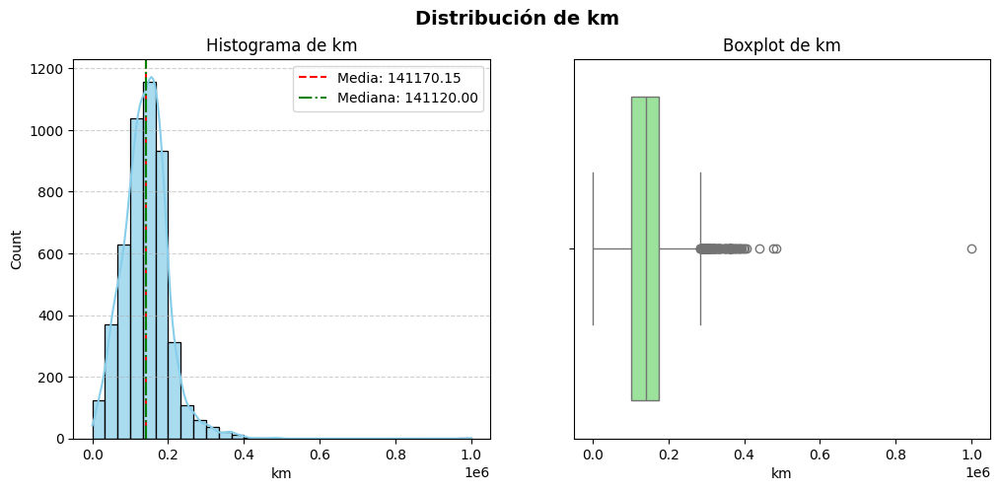




🔎 Columna: potencia
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean      128.693061
std        38.555787
min         0.000000
25%       100.000000
50%       120.000000
75%       135.000000
max       423.000000
Name: potencia, dtype: float64


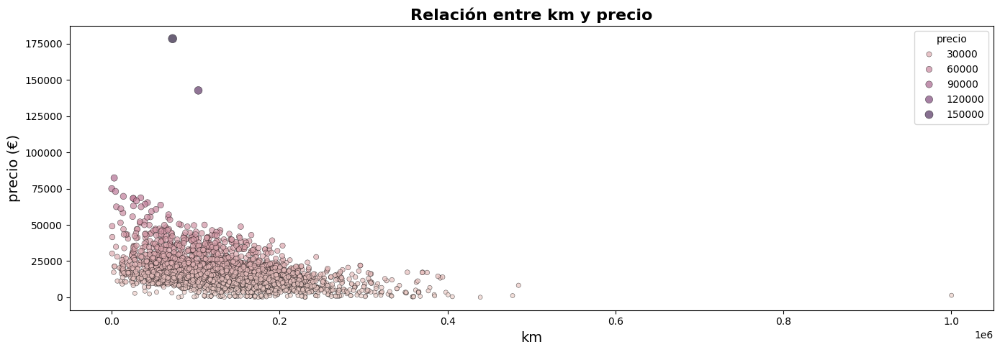

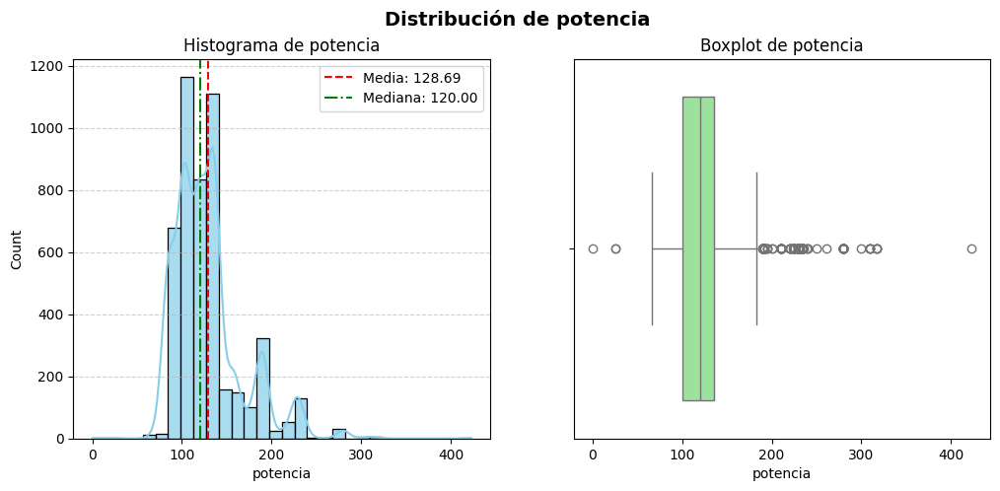




🔎 Columna: precio
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count      4799.000000
mean      15812.169202
std        9141.577934
min         100.000000
25%       10900.000000
50%       14200.000000
75%       18600.000000
max      178500.000000
Name: precio, dtype: float64


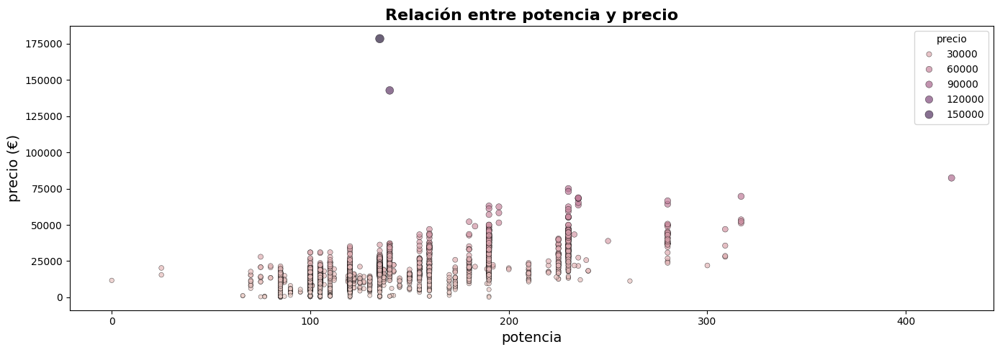

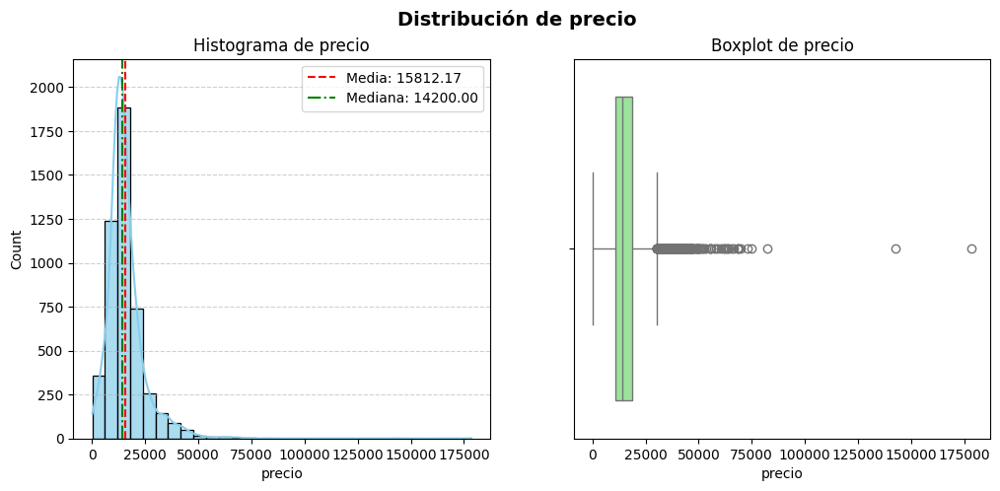




🔎 Columna: fecha_registro_Year
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean     2012.443426
std         1.922768
min      1990.000000
25%      2012.000000
50%      2013.000000
75%      2013.000000
max      2017.000000
Name: fecha_registro_Year, dtype: float64


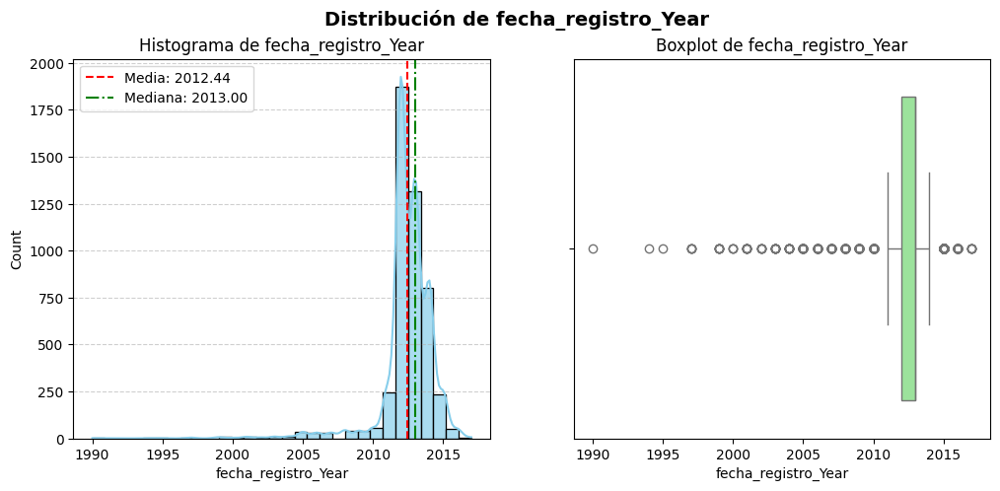




🔎 Columna: fecha_registro_Month
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        6.571161
std         3.409689
min         1.000000
25%         4.000000
50%         7.000000
75%        10.000000
max        12.000000
Name: fecha_registro_Month, dtype: float64


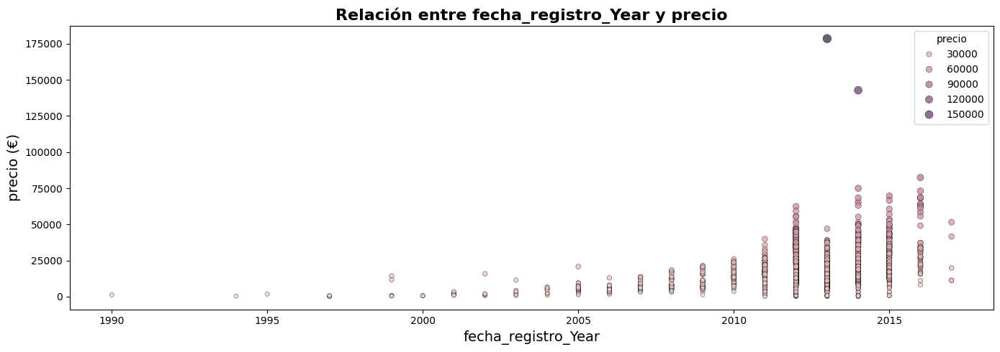

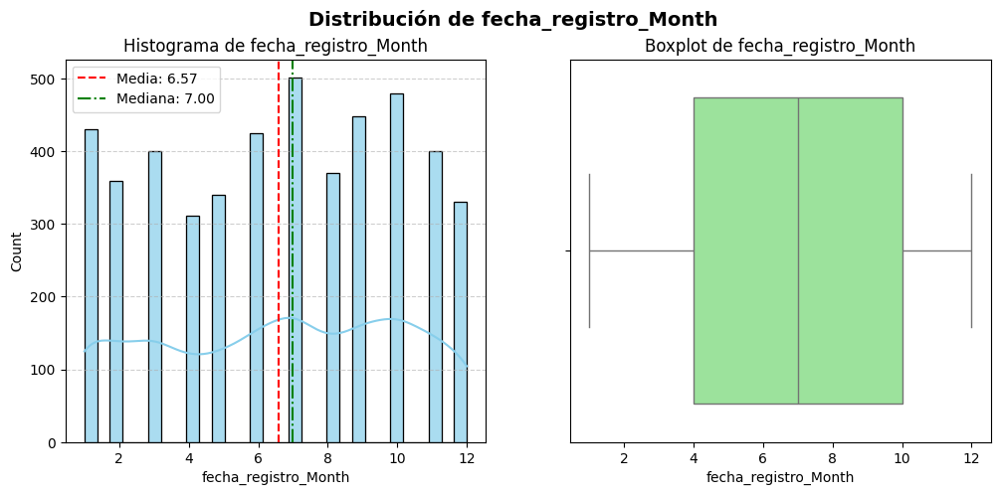




🔎 Columna: fecha_registro_Weekday
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        2.953532
std         2.024271
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max         6.000000
Name: fecha_registro_Weekday, dtype: float64


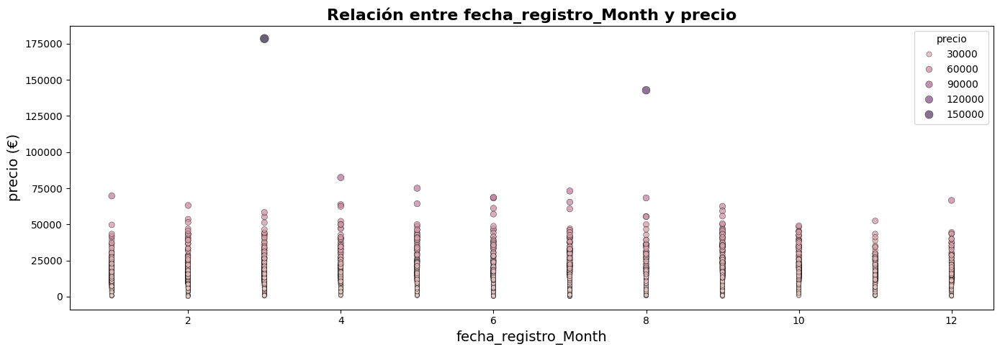

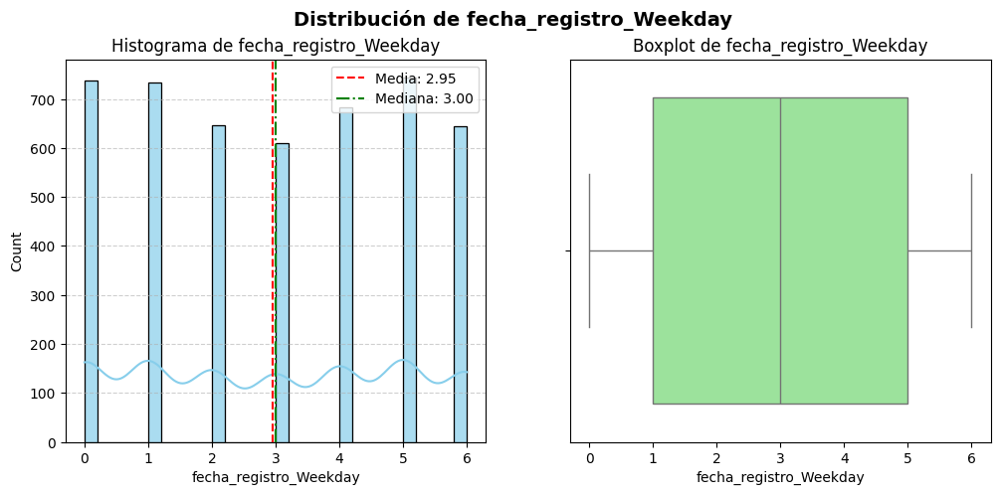




🔎 Columna: fecha_venta_Year
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean     2017.992082
std         0.276078
min      2007.000000
25%      2018.000000
50%      2018.000000
75%      2018.000000
max      2018.000000
Name: fecha_venta_Year, dtype: float64


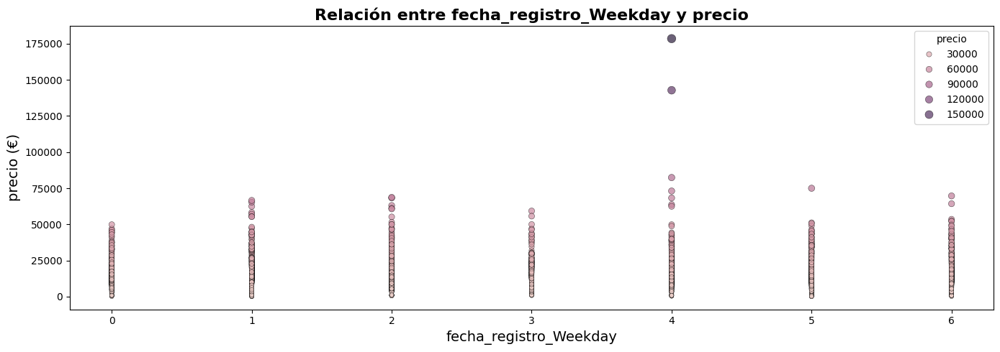

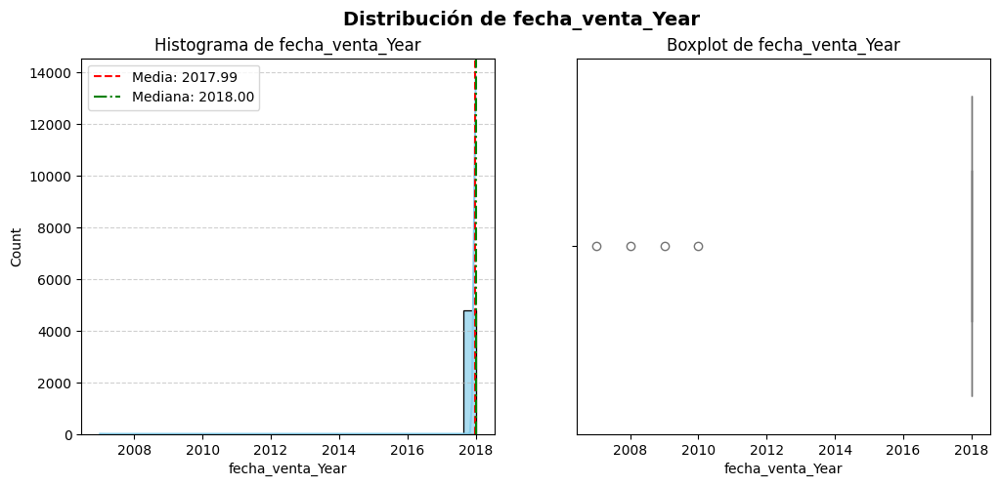




🔎 Columna: fecha_venta_Month
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        4.936445
std         2.153819
min         1.000000
25%         3.000000
50%         5.000000
75%         7.000000
max         9.000000
Name: fecha_venta_Month, dtype: float64


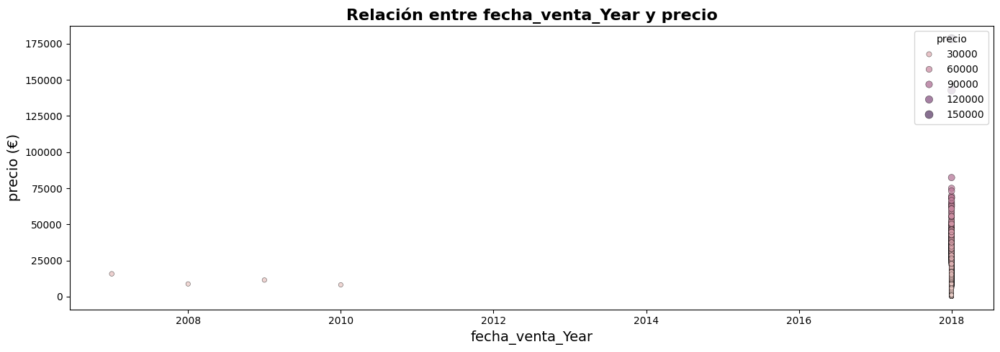

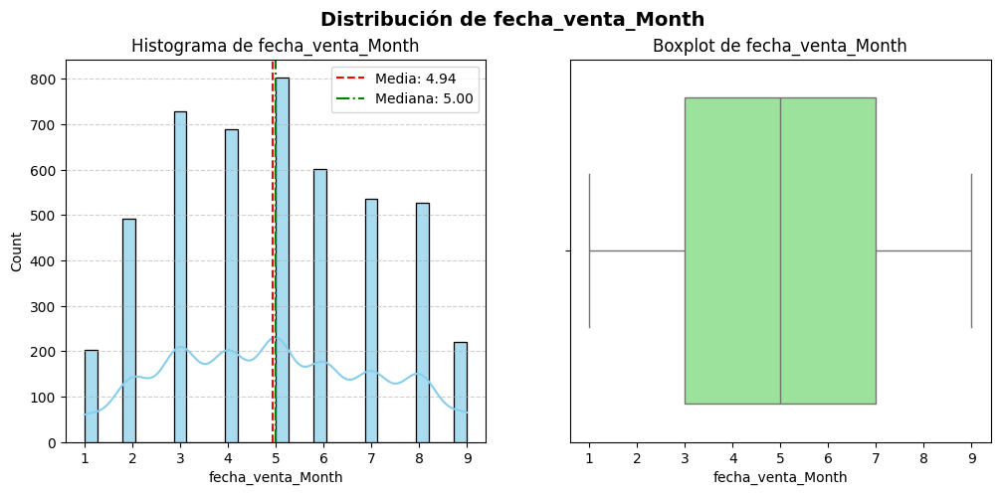




🔎 Columna: fecha_venta_Weekday
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        3.410085
std         1.895946
min         0.000000
25%         2.000000
50%         3.000000
75%         6.000000
max         6.000000
Name: fecha_venta_Weekday, dtype: float64


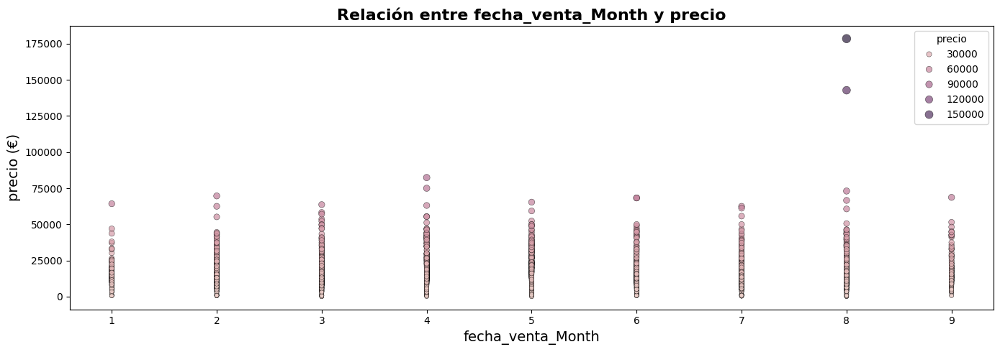

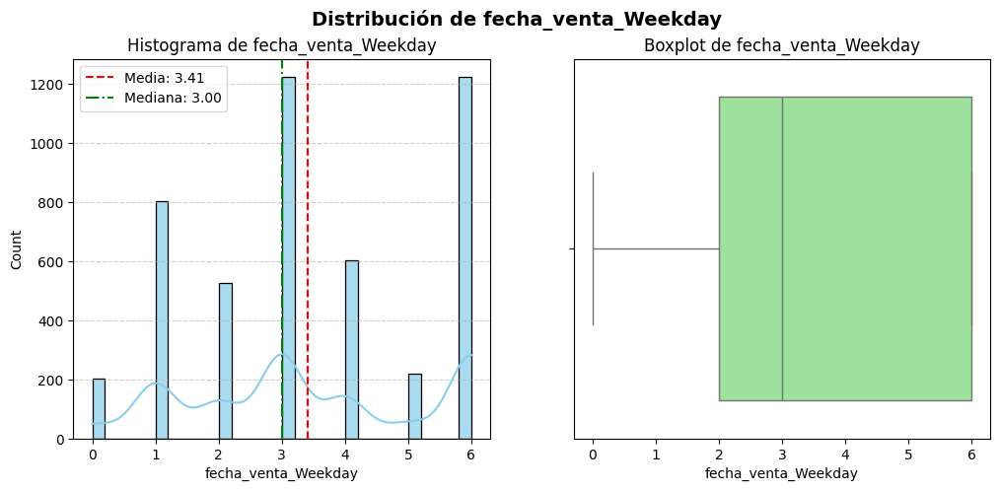




🔎 Columna: color_beige
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.007710
std         0.087476
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_beige, dtype: float64


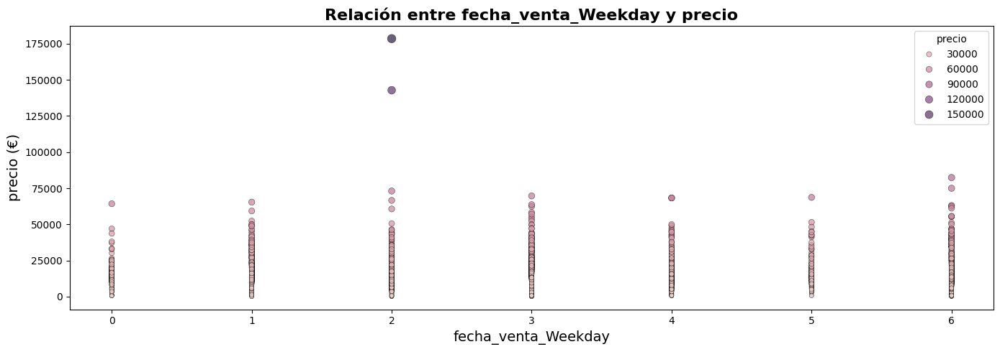

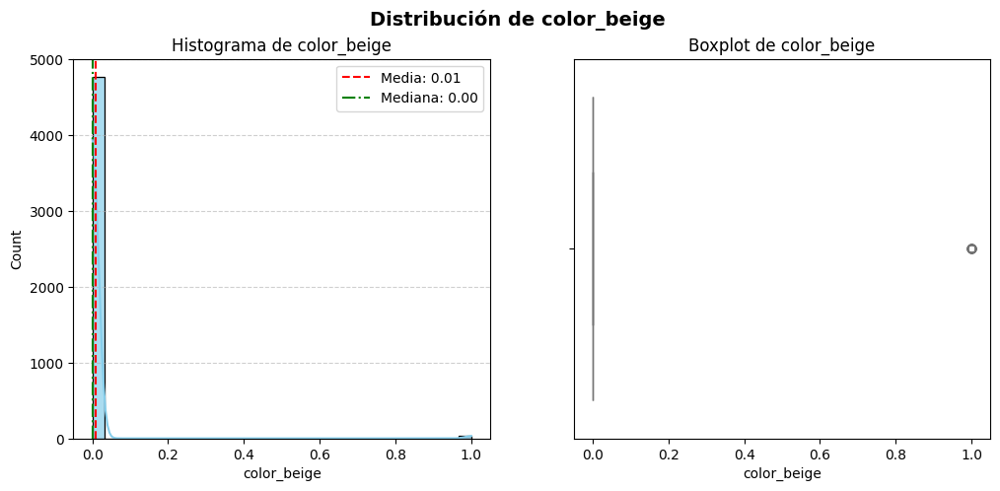




🔎 Columna: color_black
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.381538
std         0.485815
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: color_black, dtype: float64


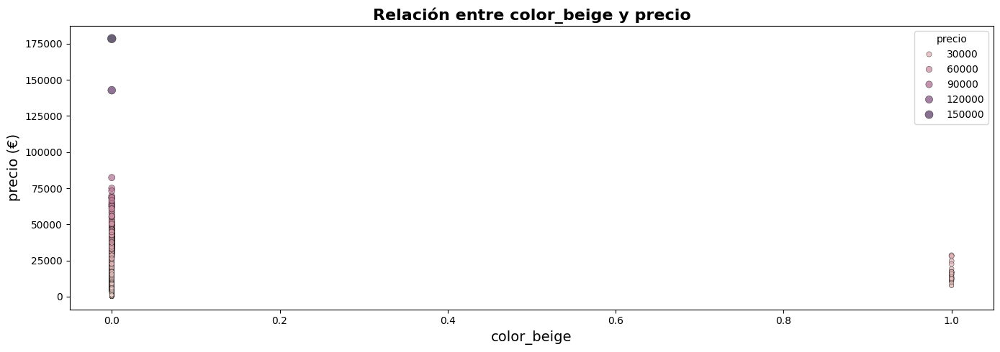

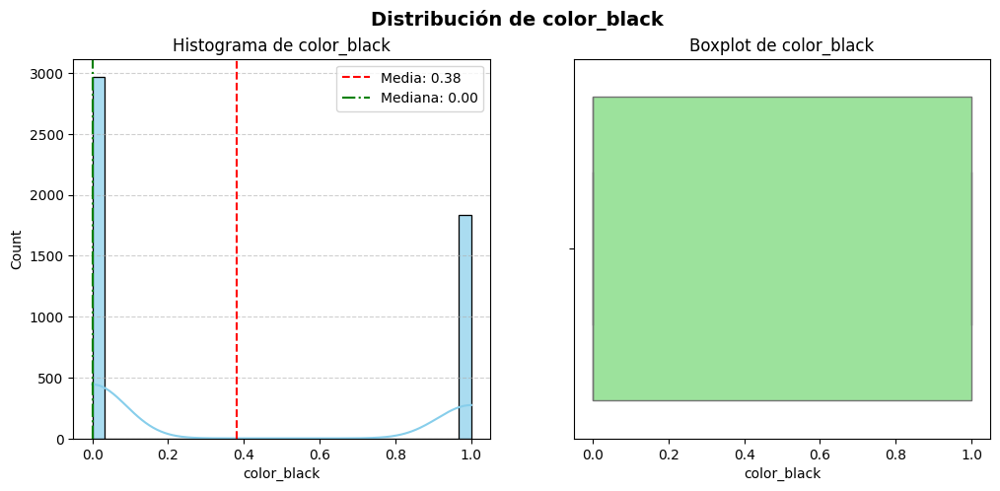




🔎 Columna: color_blue
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.136278
std         0.343120
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_blue, dtype: float64


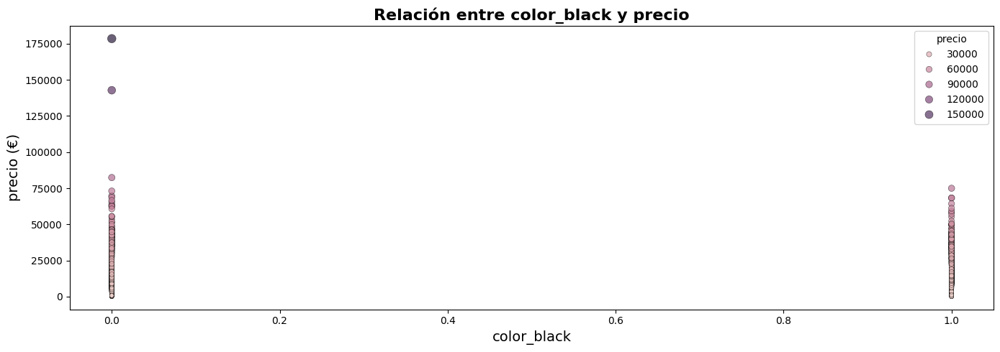

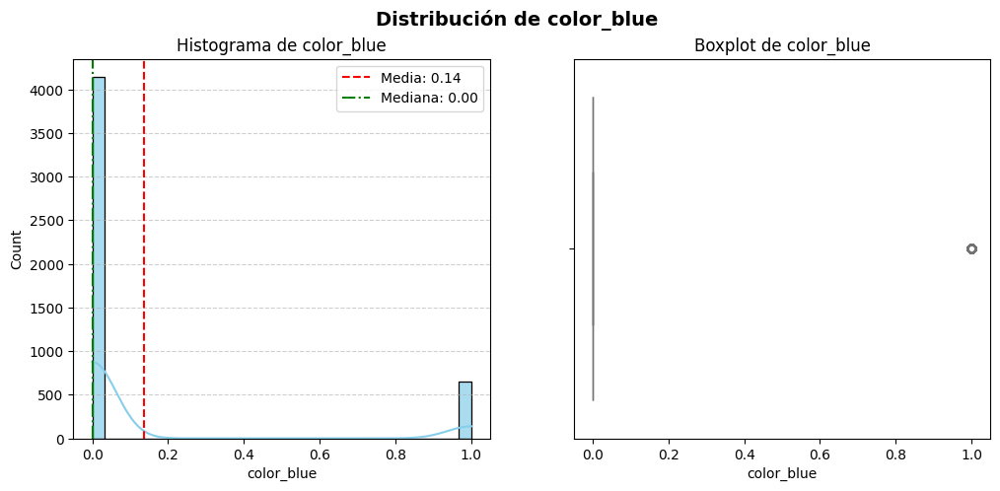




🔎 Columna: color_brown
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.062930
std         0.242862
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_brown, dtype: float64


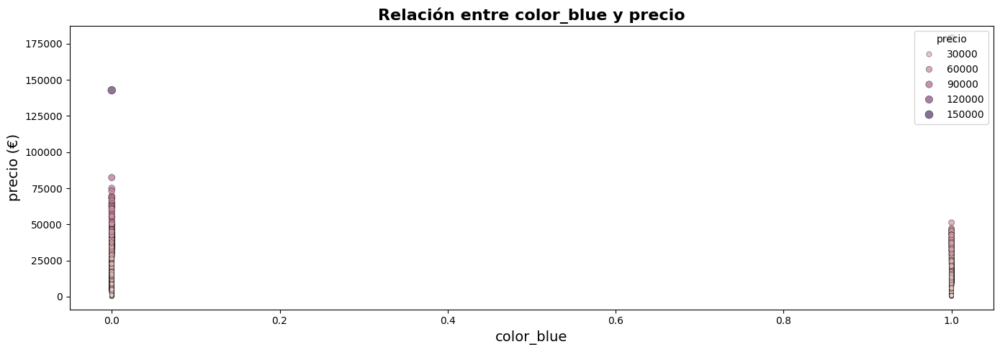

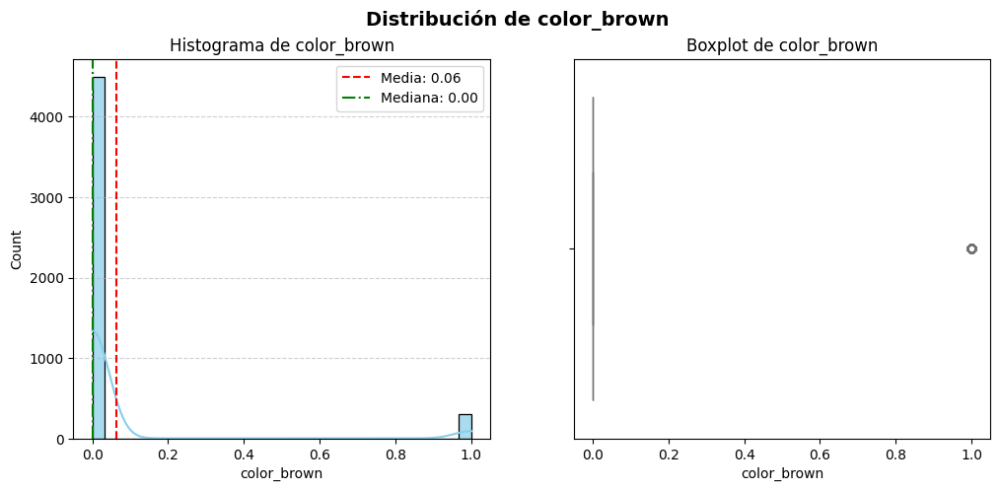




🔎 Columna: color_green
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.002917
std         0.053939
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_green, dtype: float64


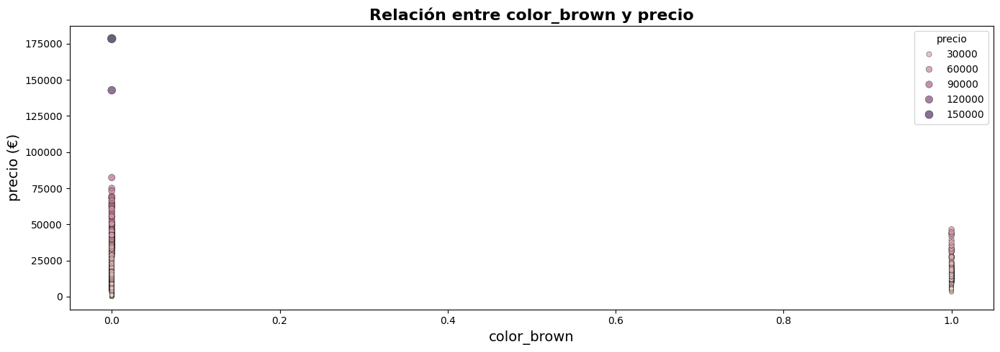

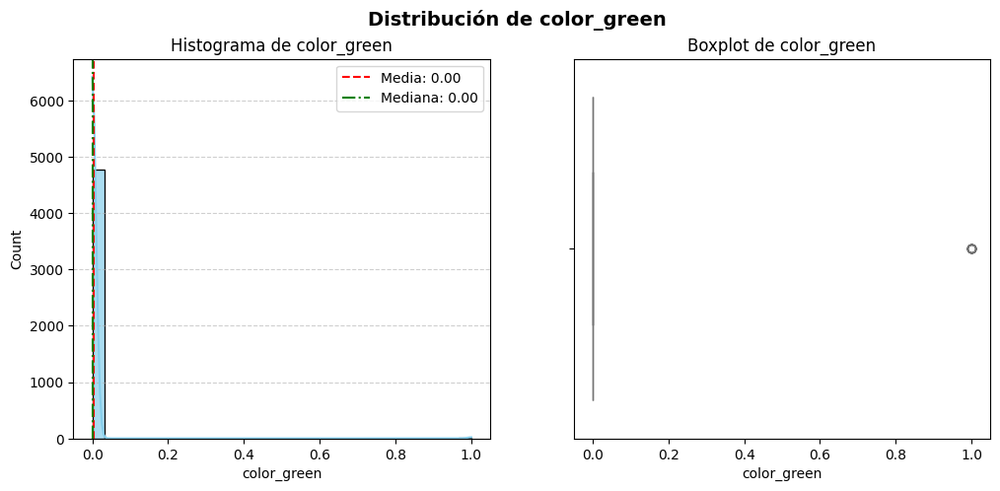




🔎 Columna: color_grey
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.237758
std         0.425754
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_grey, dtype: float64


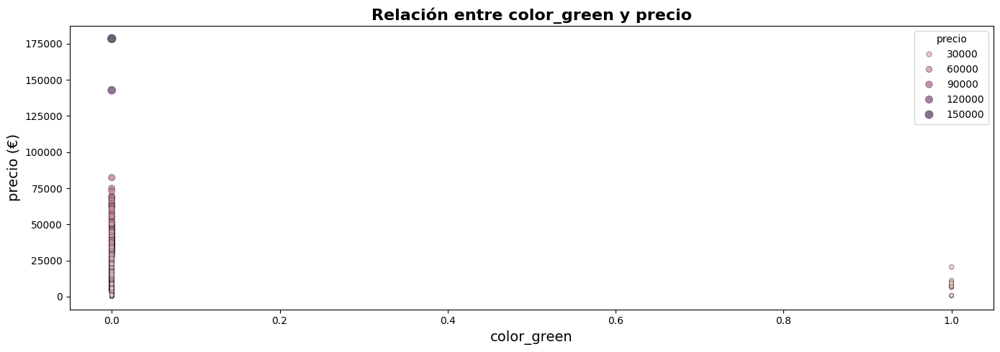

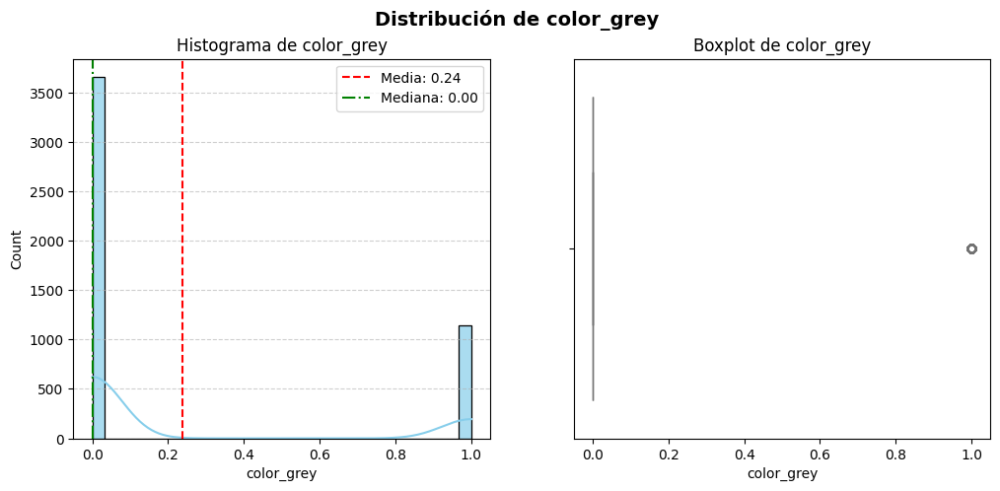




🔎 Columna: color_orange
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001250
std         0.035341
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_orange, dtype: float64


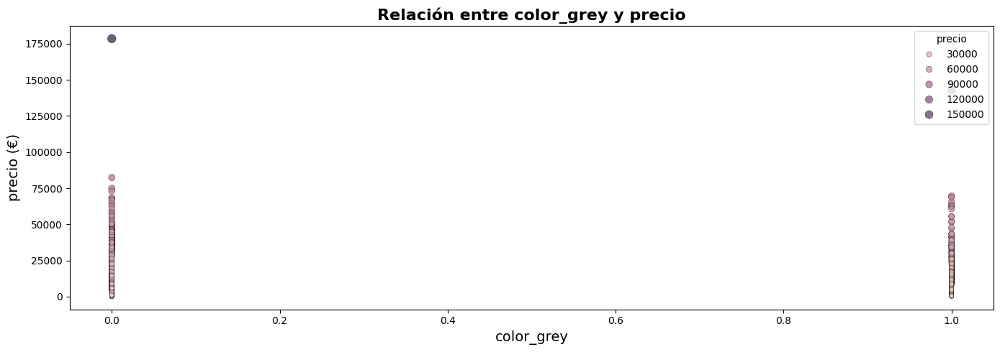

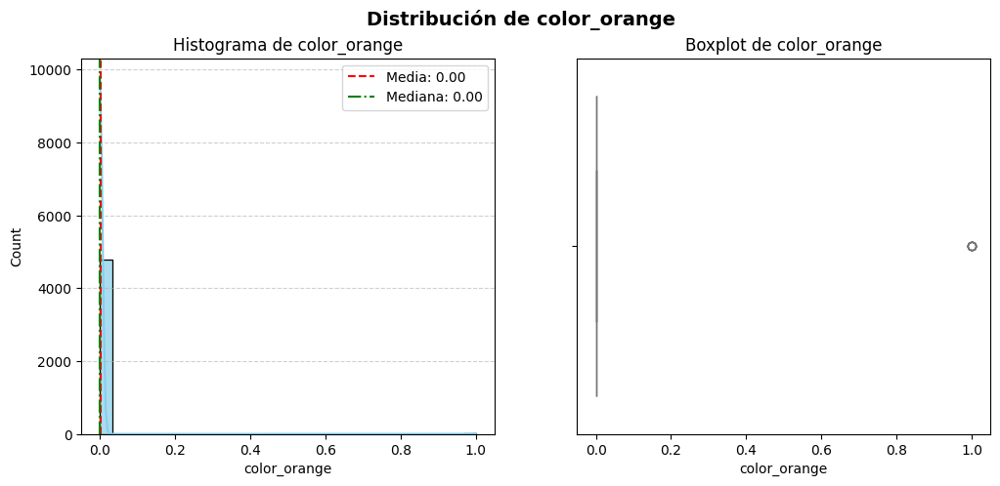




🔎 Columna: color_red
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.009794
std         0.098488
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_red, dtype: float64


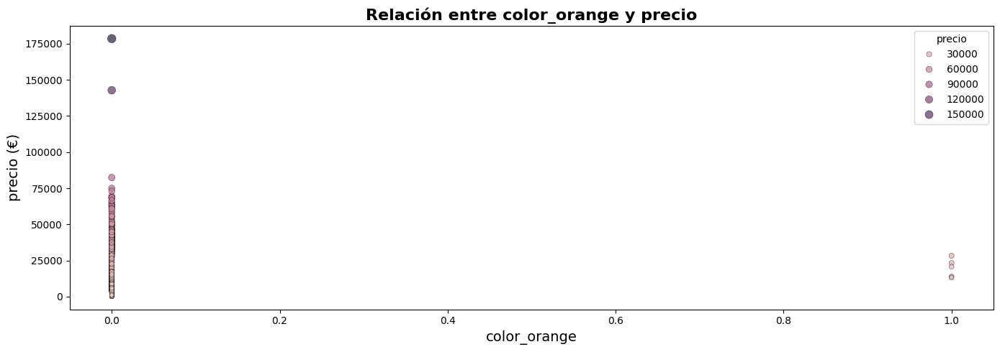

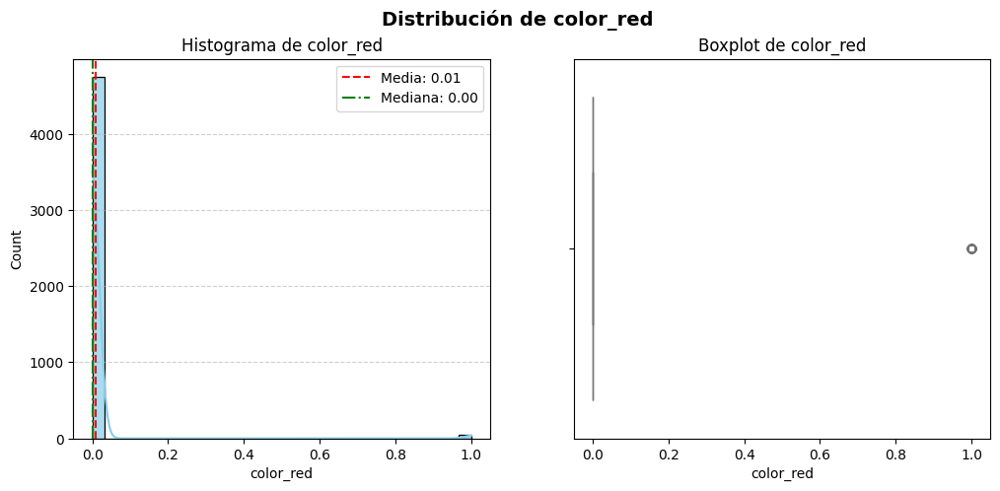




🔎 Columna: color_silver
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.060221
std         0.237920
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_silver, dtype: float64


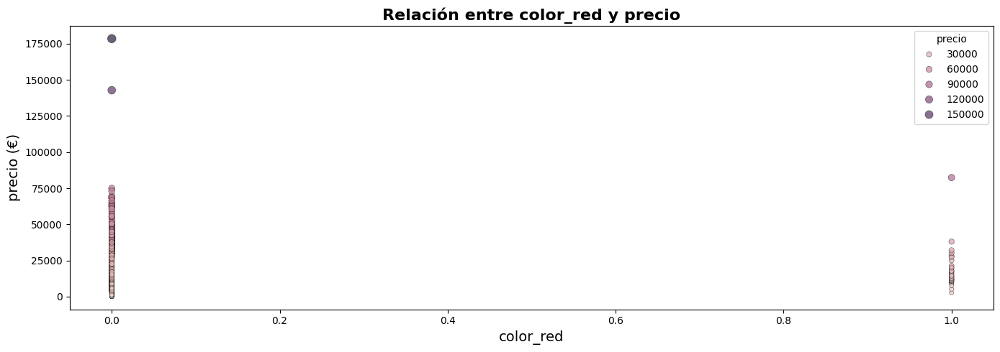

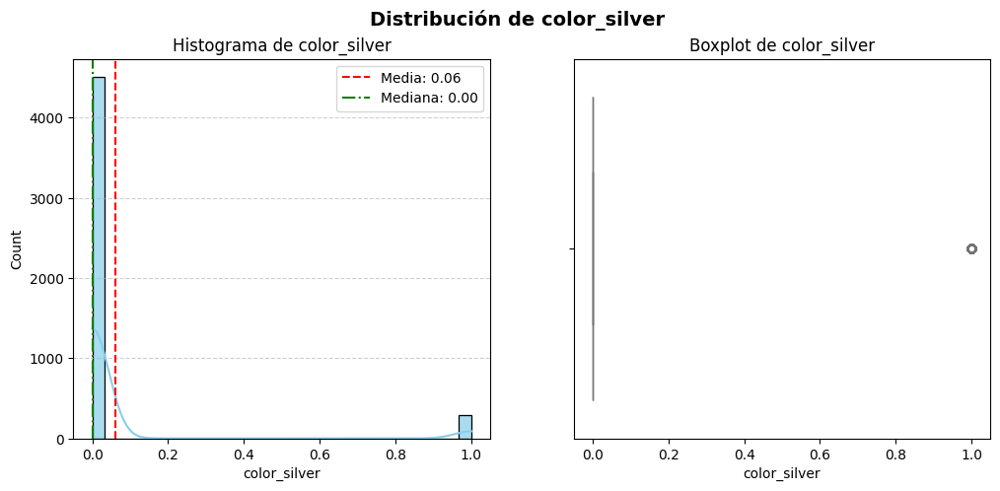




🔎 Columna: color_white
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.099604
std         0.299503
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: color_white, dtype: float64


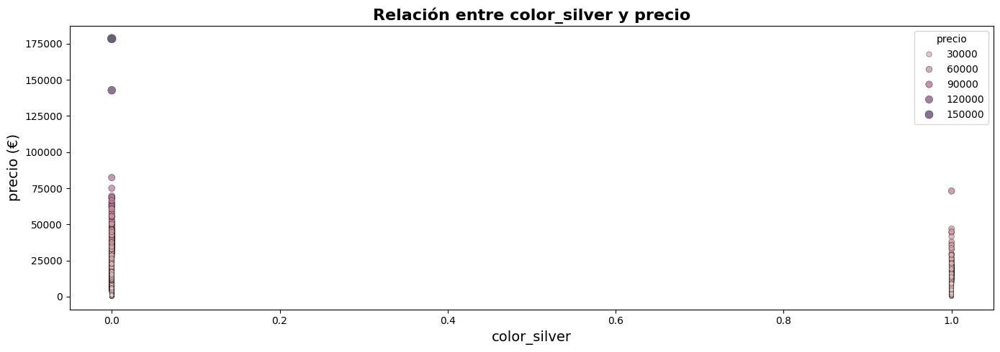

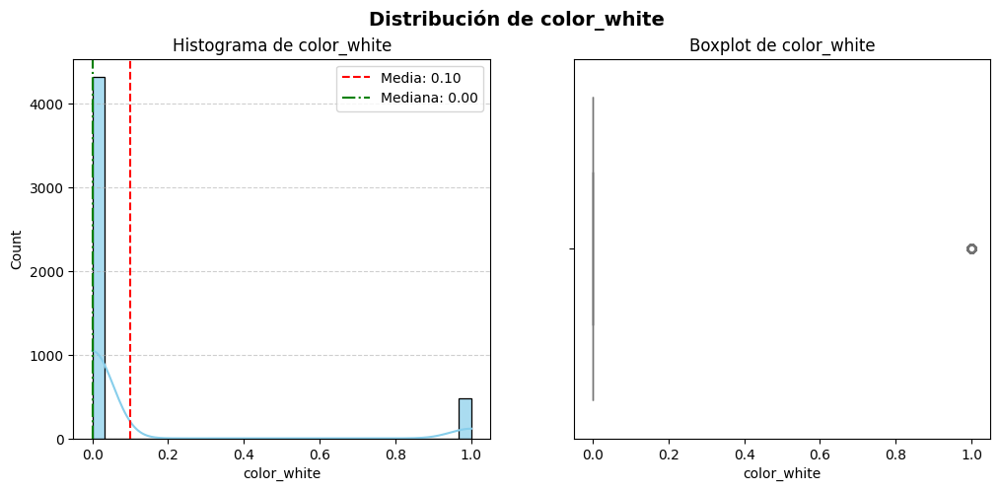




🔎 Columna: aire_acondicionado_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.615962
std         0.661137
min        -1.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: aire_acondicionado_number, dtype: float64


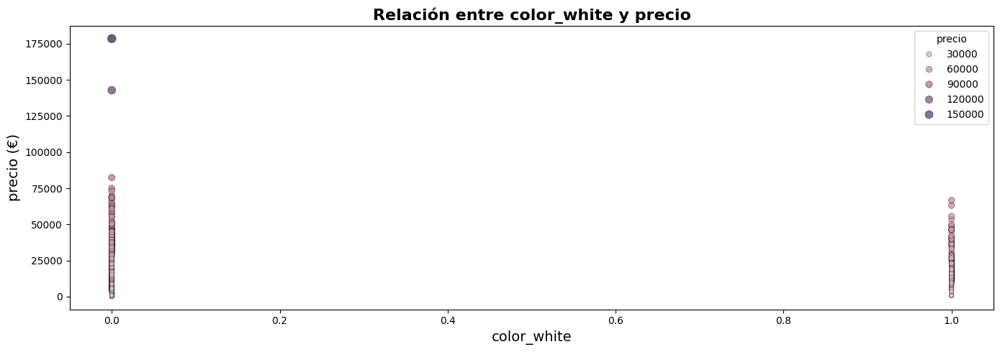

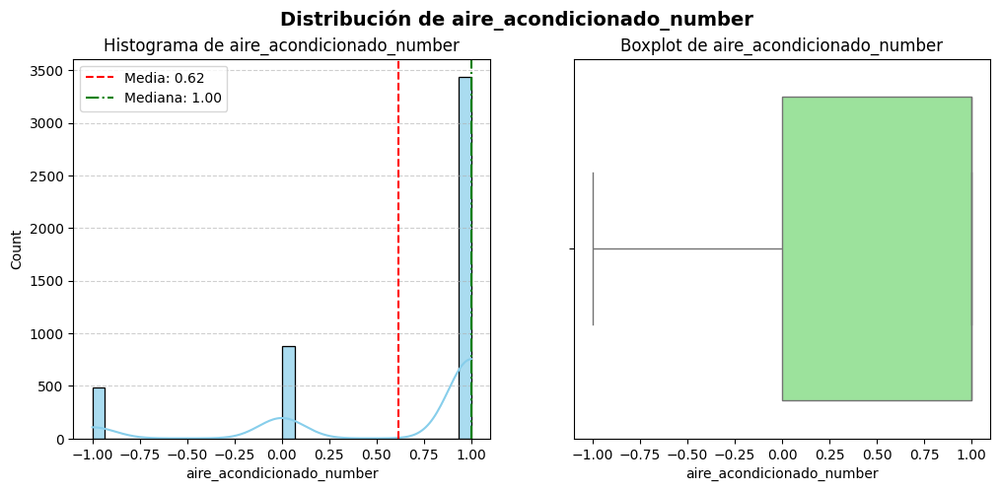




🔎 Columna: tipo_coche_convertible
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.006043
std         0.077509
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_convertible, dtype: float64


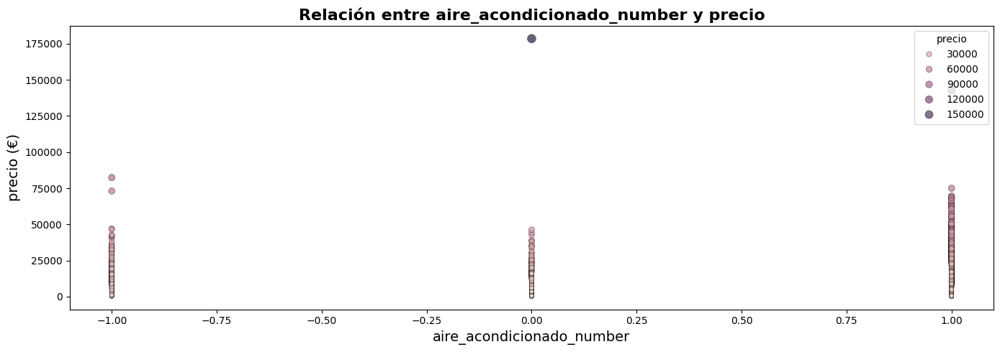

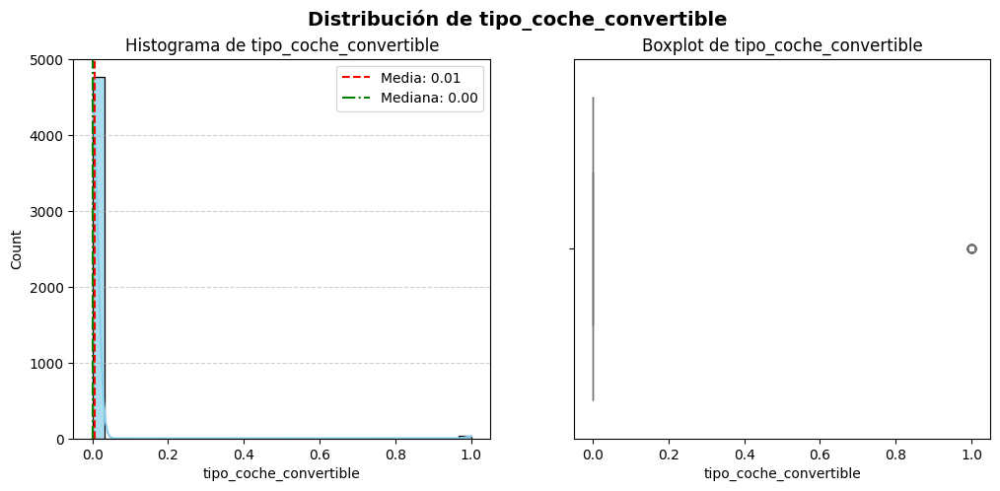




🔎 Columna: tipo_coche_coupe
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.014170
std         0.118202
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_coupe, dtype: float64


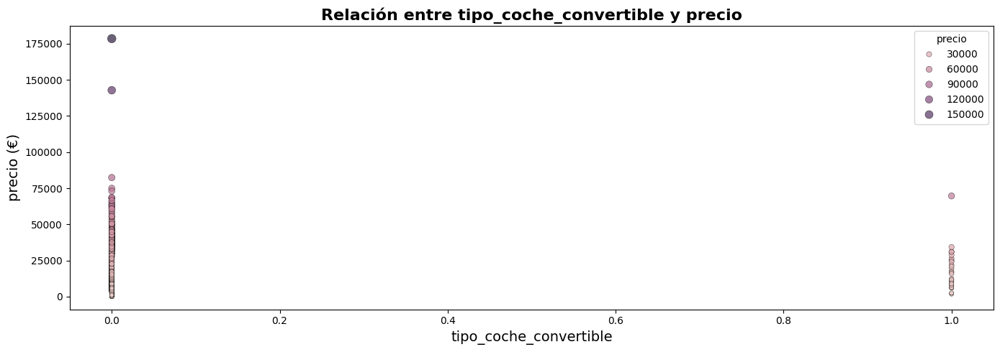

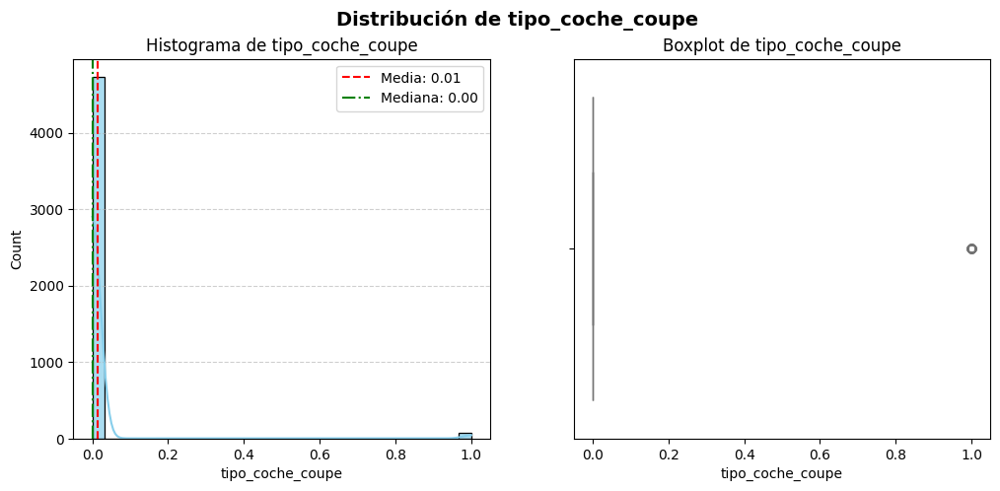




🔎 Columna: tipo_coche_estate
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.228589
std         0.419968
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_estate, dtype: float64


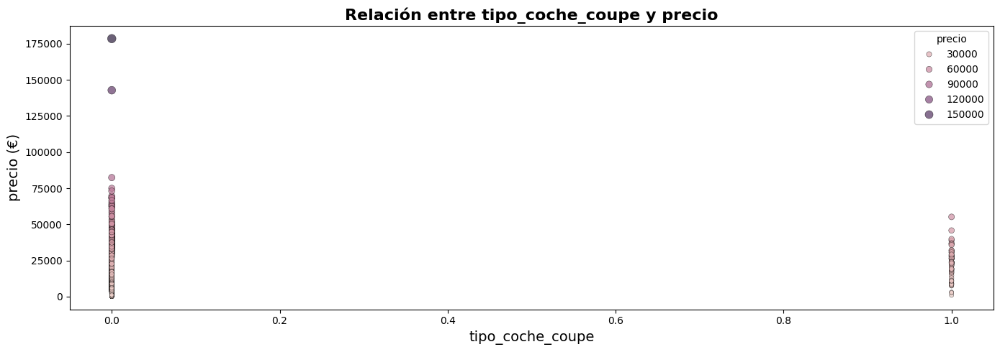

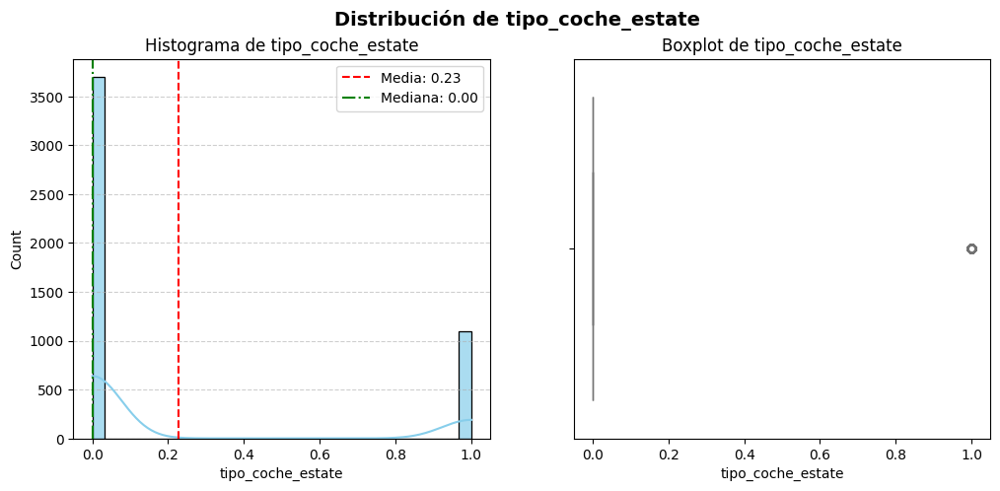




🔎 Columna: tipo_coche_hatchback
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.101479
std         0.301994
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_hatchback, dtype: float64


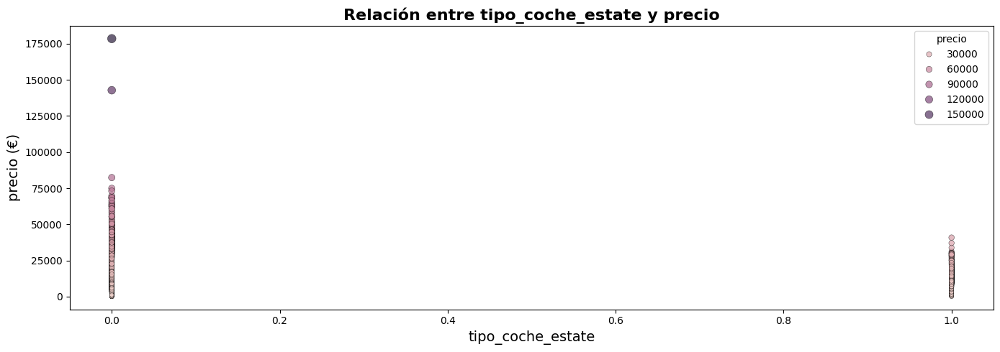

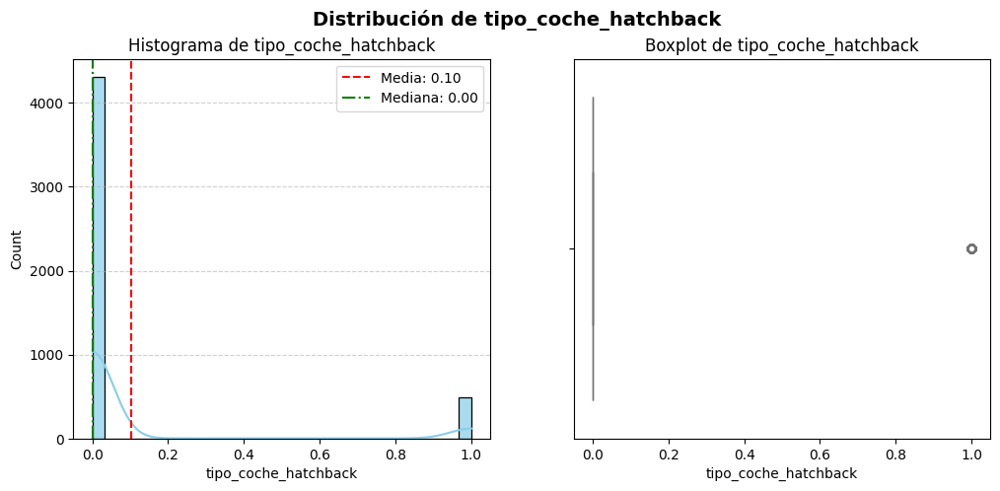




🔎 Columna: tipo_coche_sedan
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.170452
std         0.376069
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_sedan, dtype: float64


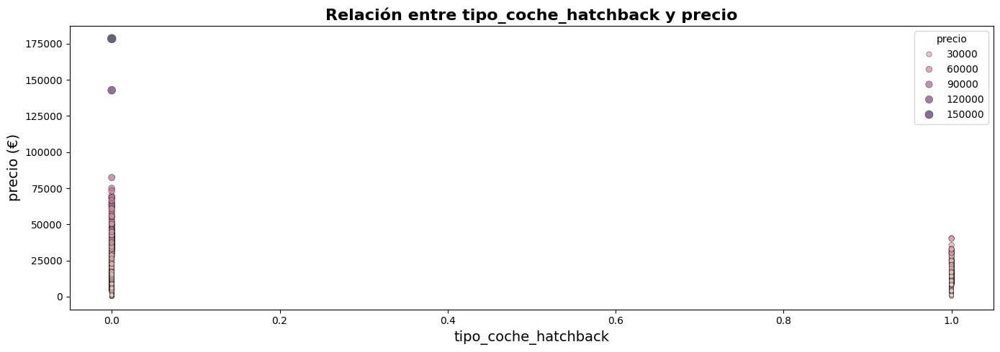

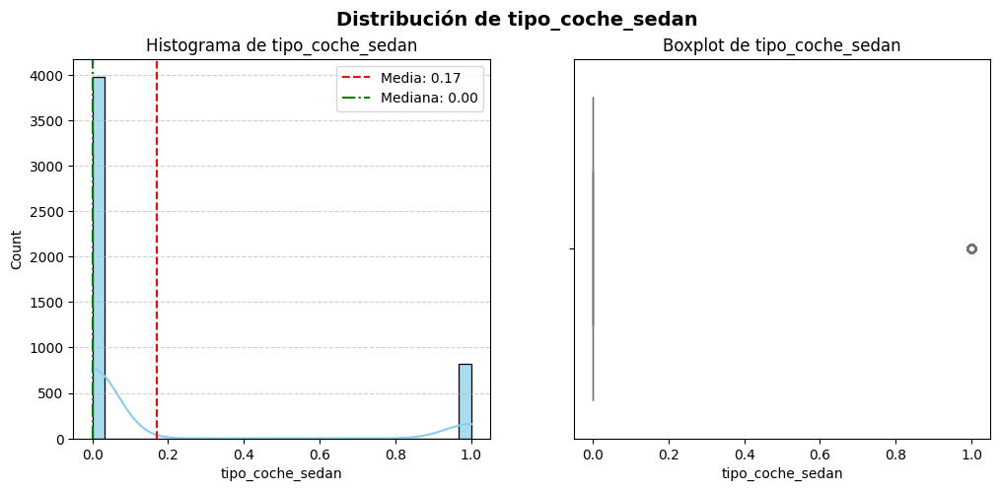




🔎 Columna: tipo_coche_subcompact
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.016045
std         0.125662
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_subcompact, dtype: float64


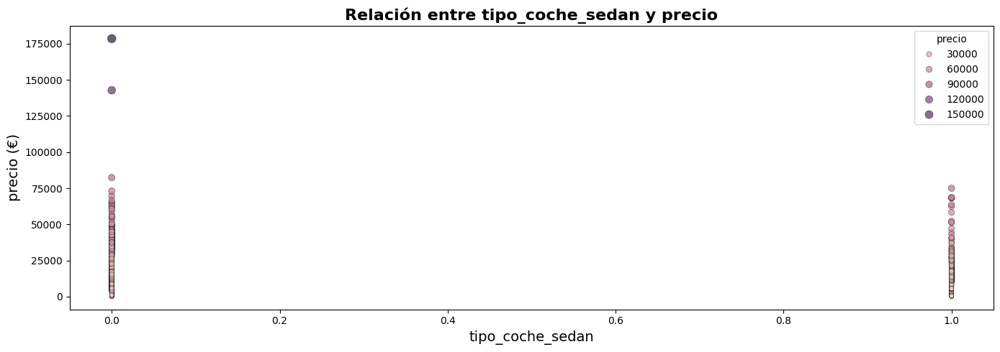

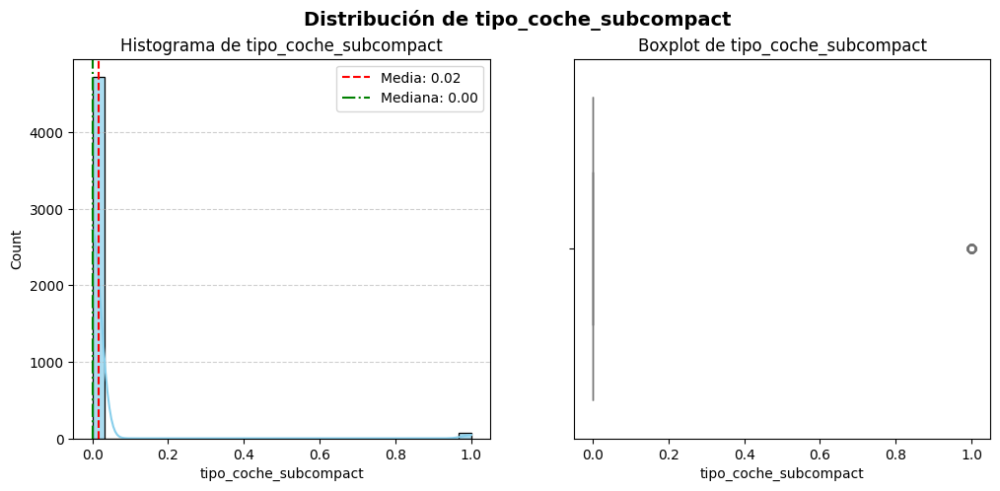




🔎 Columna: tipo_coche_suv
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.157116
std         0.363948
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_suv, dtype: float64


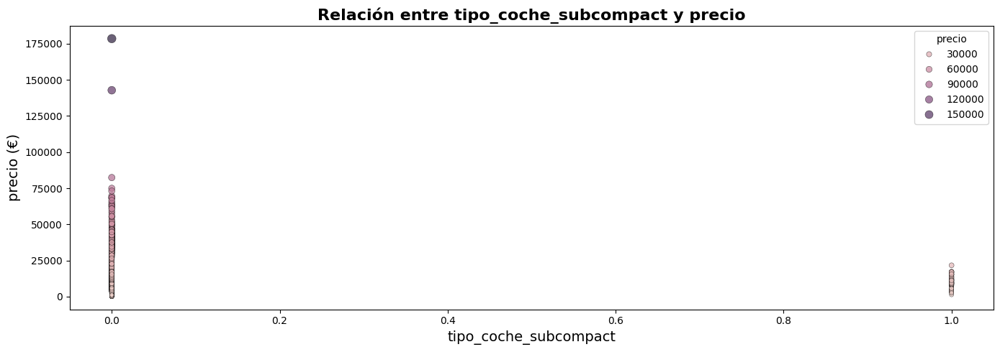

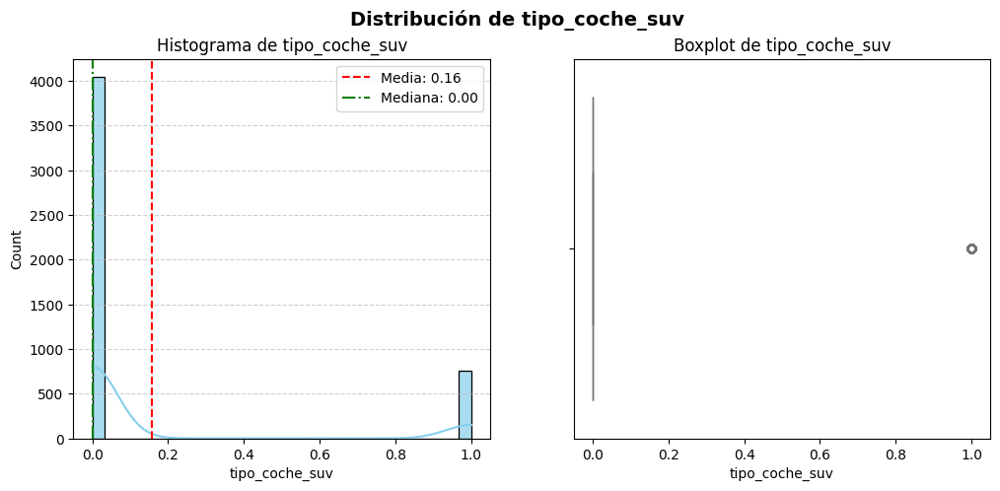




🔎 Columna: tipo_coche_vacio
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.300688
std         0.458605
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: tipo_coche_vacio, dtype: float64


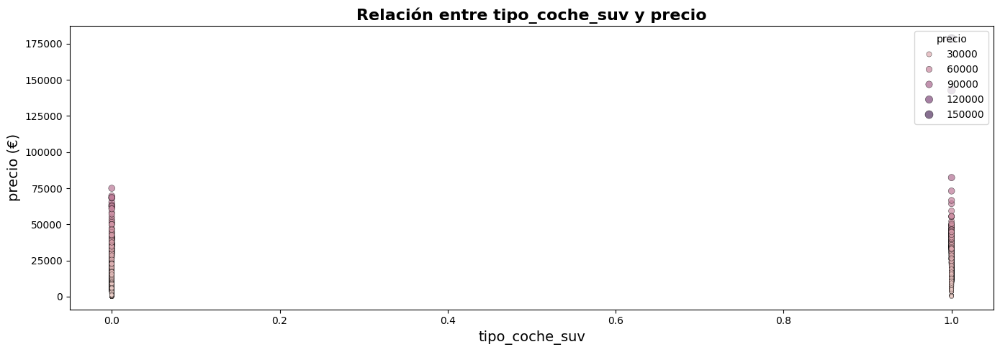

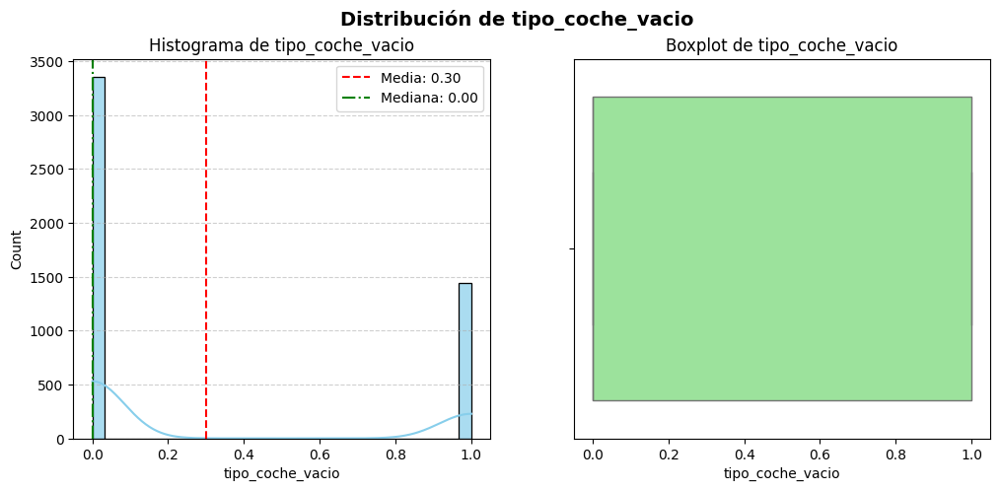




🔎 Columna: tipo_coche_van
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.005418
std         0.073414
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_coche_van, dtype: float64


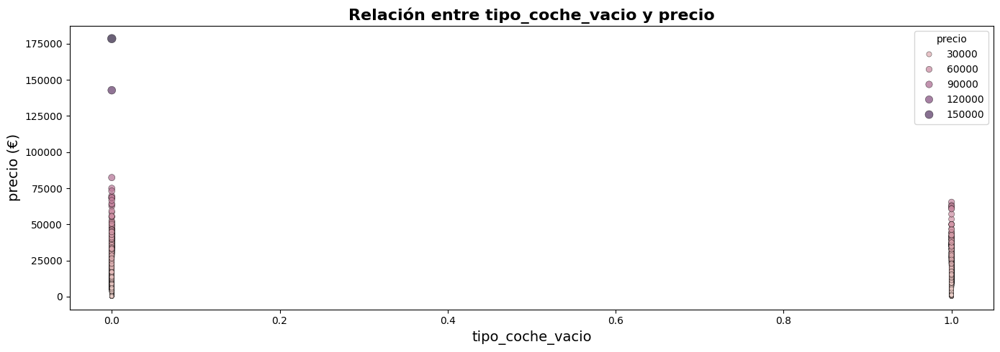

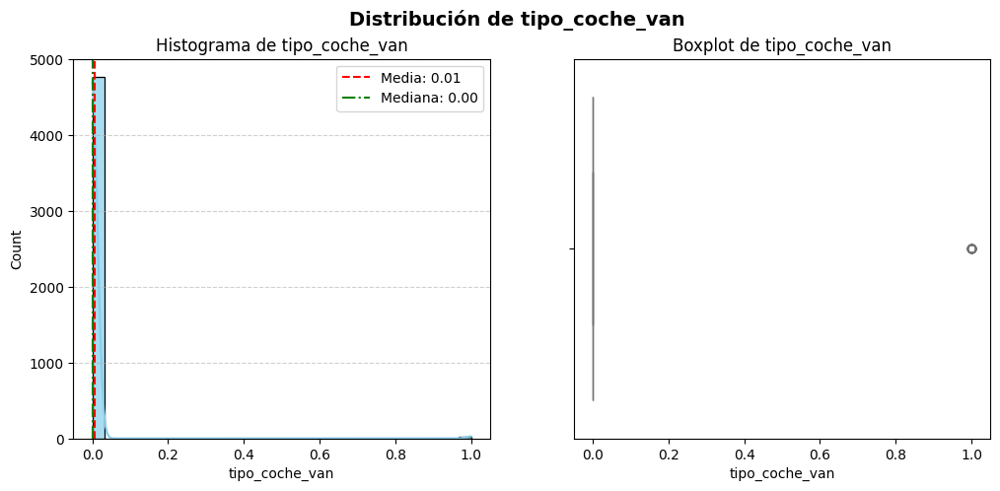




🔎 Columna: bluetooth_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.053344
std         0.593901
min        -1.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: bluetooth_number, dtype: float64


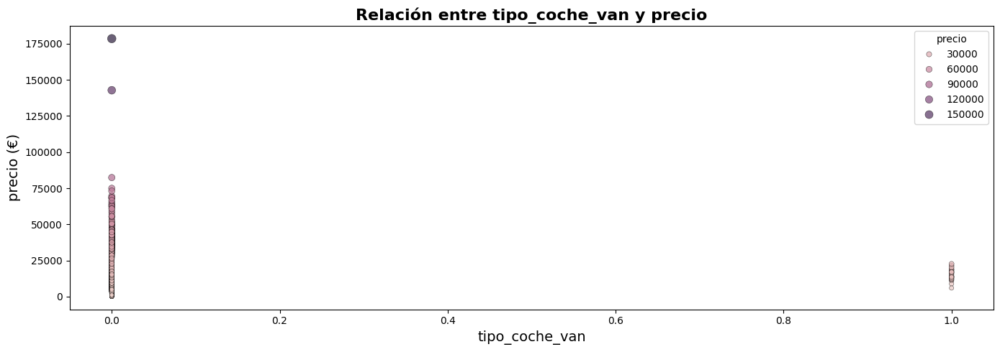

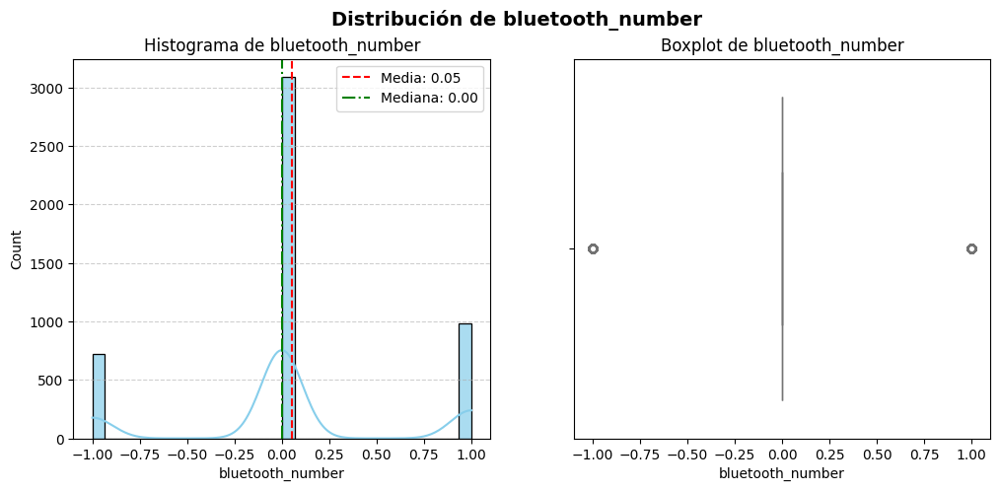




🔎 Columna: volante_regulable_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.549489
std         0.497597
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: volante_regulable_number, dtype: float64


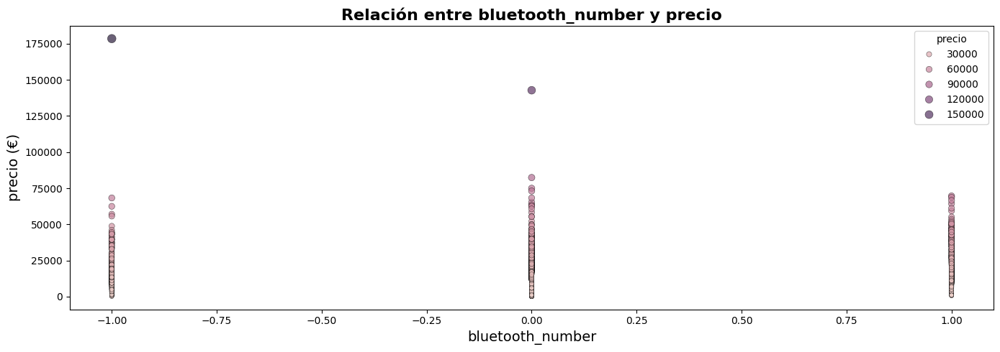

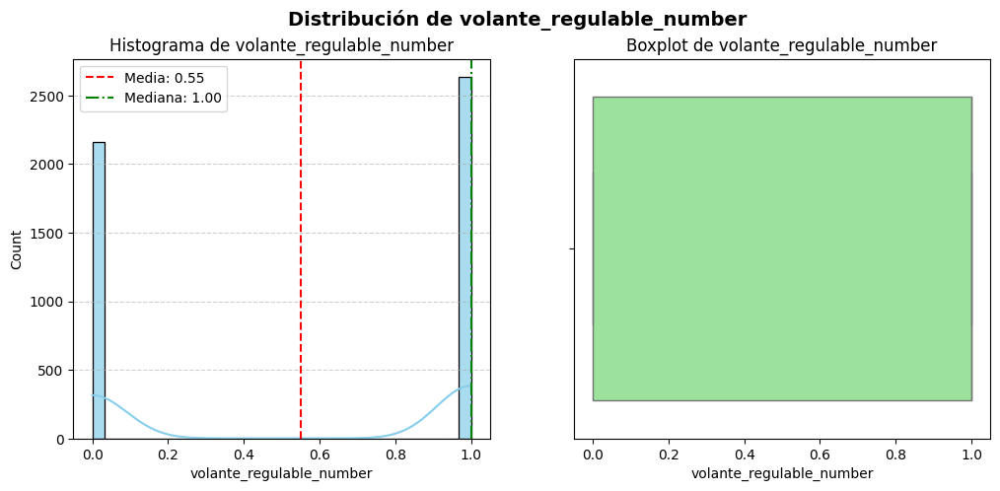




🔎 Columna: camara_trasera_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.200875
std         0.400697
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: camara_trasera_number, dtype: float64


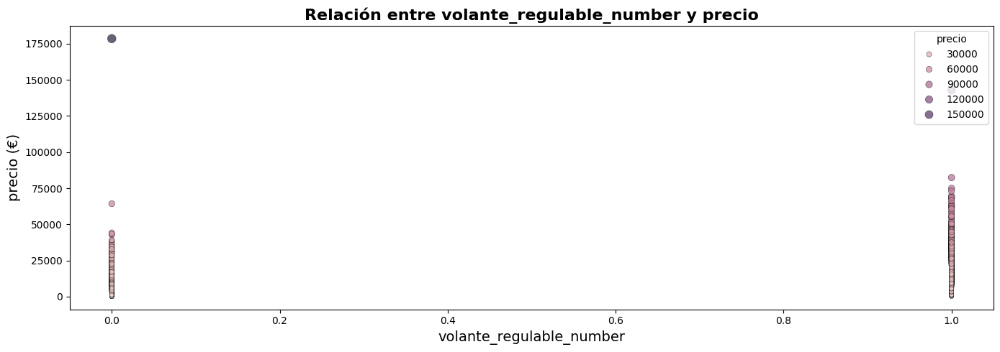

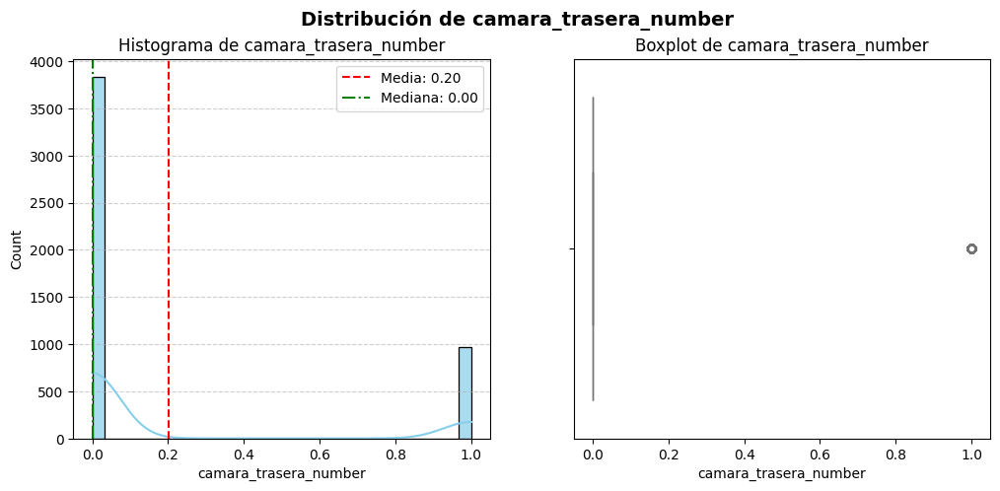




🔎 Columna: asientos_traseros_plegables_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean       -0.638050
std         0.597042
min        -1.000000
25%        -1.000000
50%        -1.000000
75%         0.000000
max         1.000000
Name: asientos_traseros_plegables_number, dtype: float64


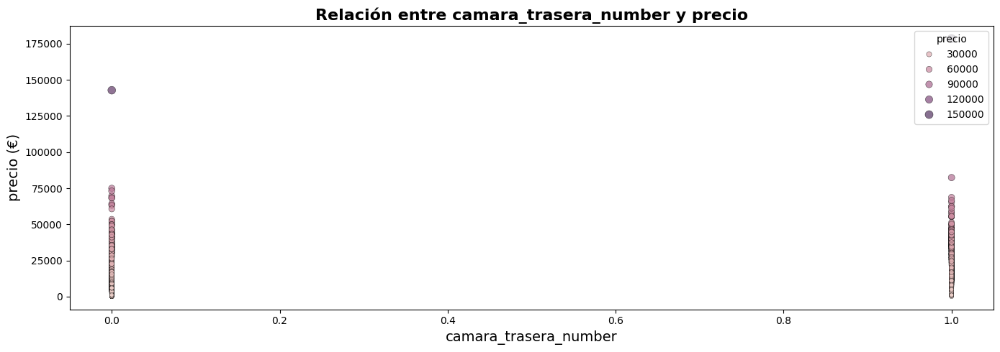

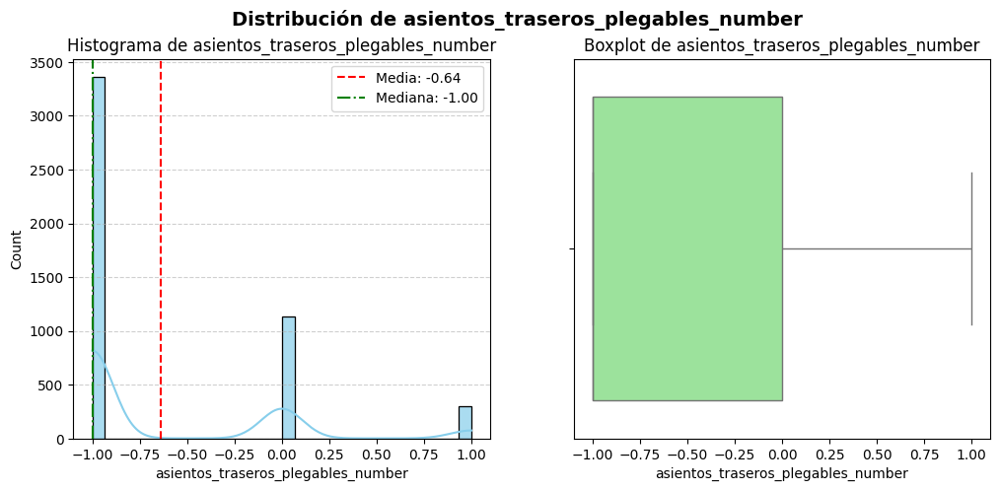




🔎 Columna: elevalunas_electrico_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.460513
std         0.498490
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: elevalunas_electrico_number, dtype: float64


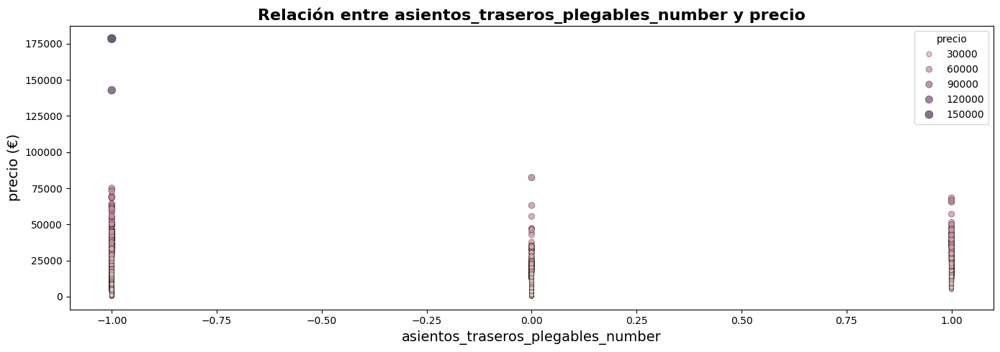

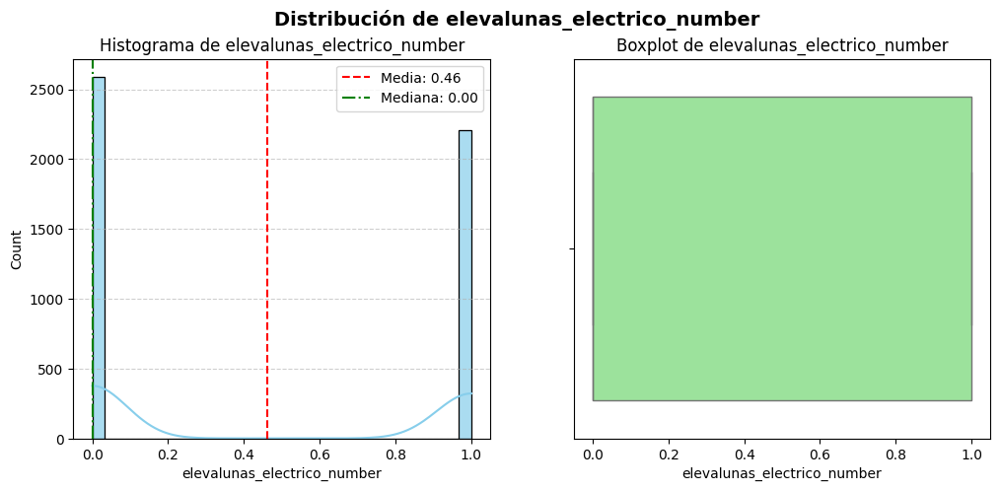




🔎 Columna: gps_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.933111
std         0.249856
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: gps_number, dtype: float64


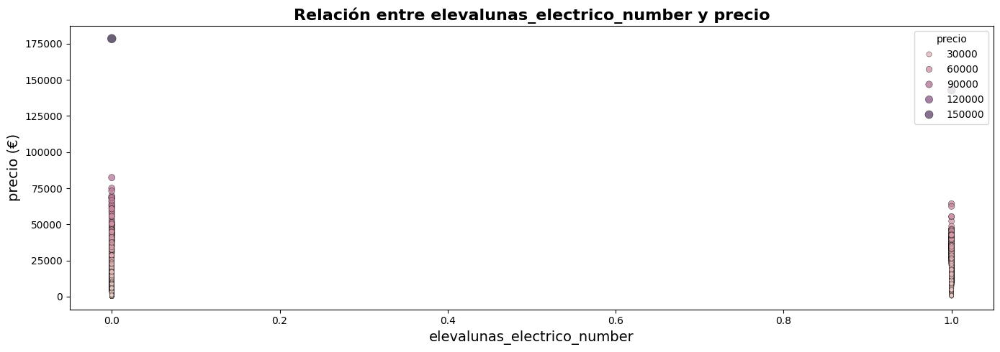

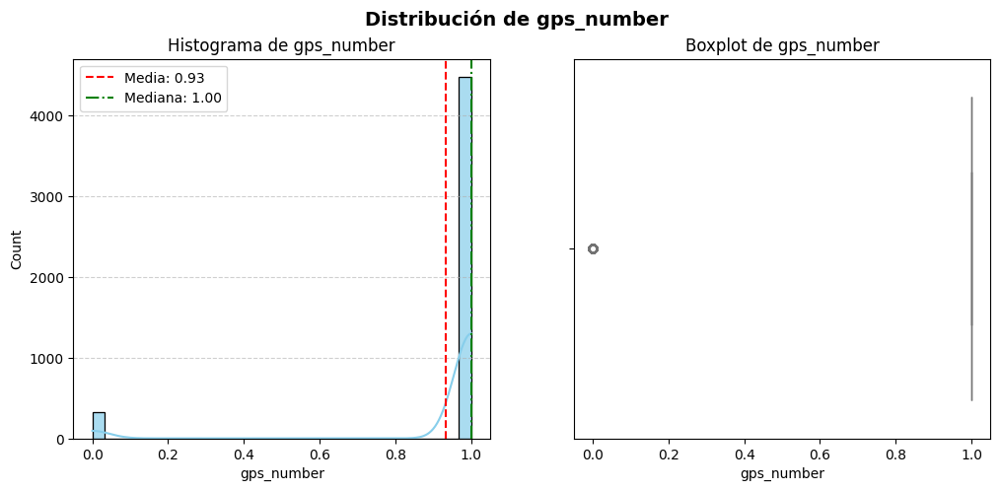




🔎 Columna: alerta_lim_velocidad_number
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.00000
mean        0.31069
std         0.71804
min        -1.00000
25%         0.00000
50%         0.00000
75%         1.00000
max         1.00000
Name: alerta_lim_velocidad_number, dtype: float64


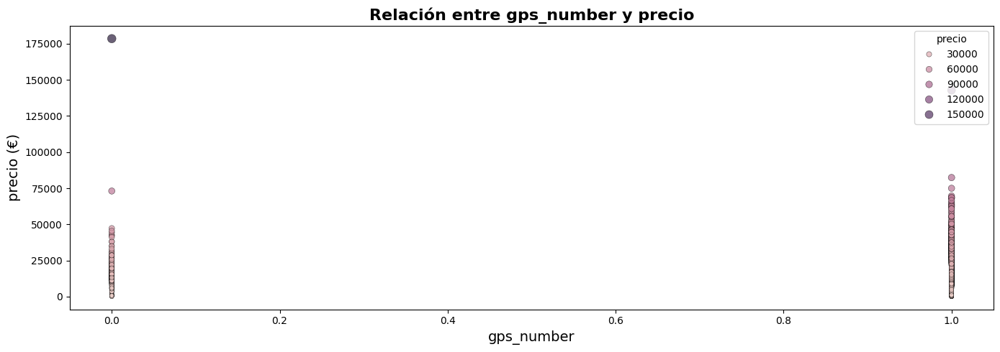

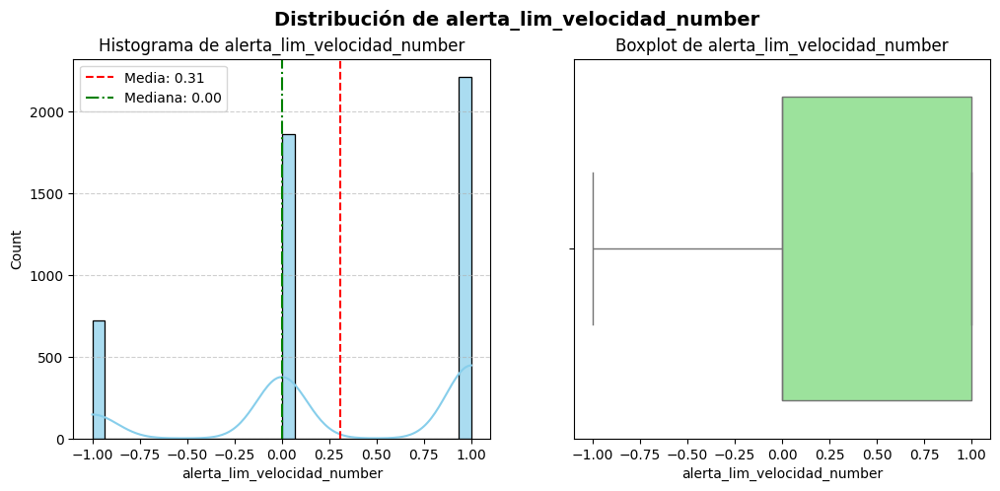




🔎 Columna: tipo_gasolina_diesel
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.960200
std         0.195509
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: tipo_gasolina_diesel, dtype: float64


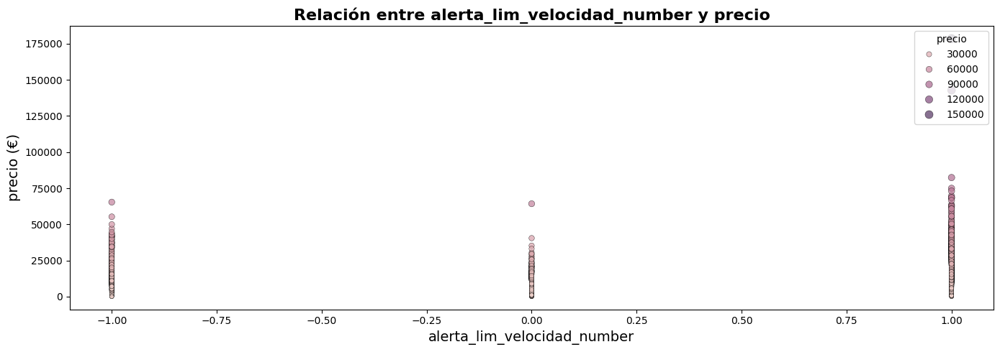

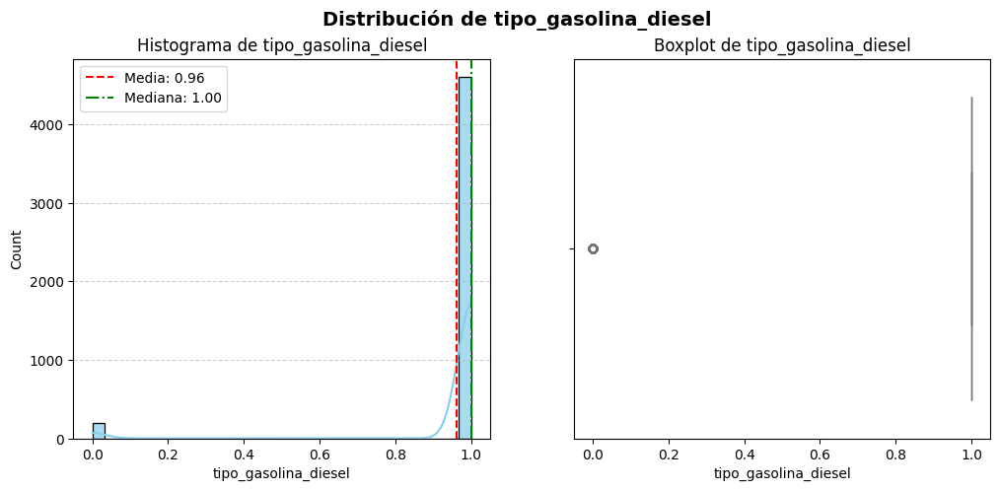




🔎 Columna: tipo_gasolina_electro
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_gasolina_electro, dtype: float64


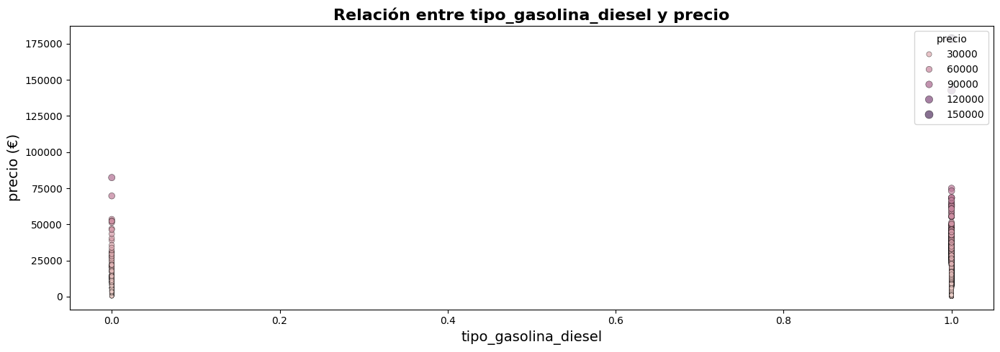

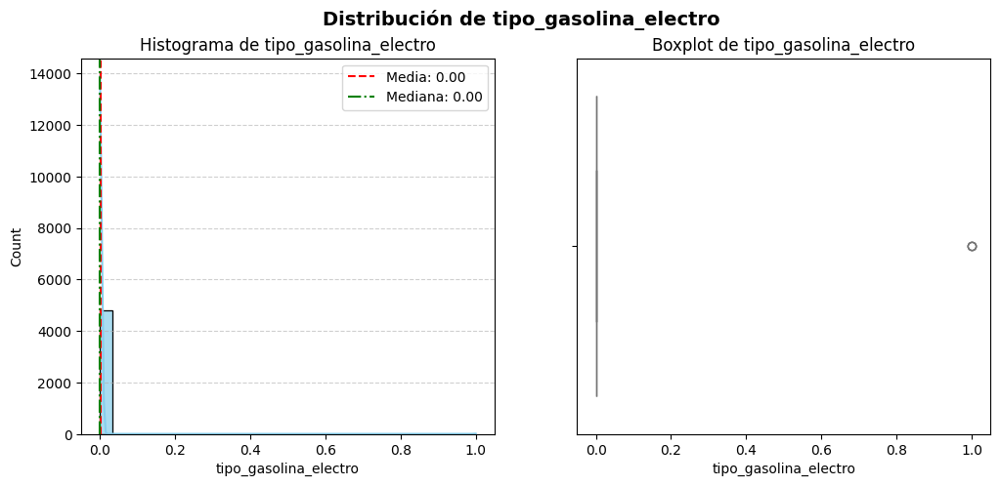




🔎 Columna: tipo_gasolina_hybrid_petrol
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001459
std         0.038168
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_gasolina_hybrid_petrol, dtype: float64


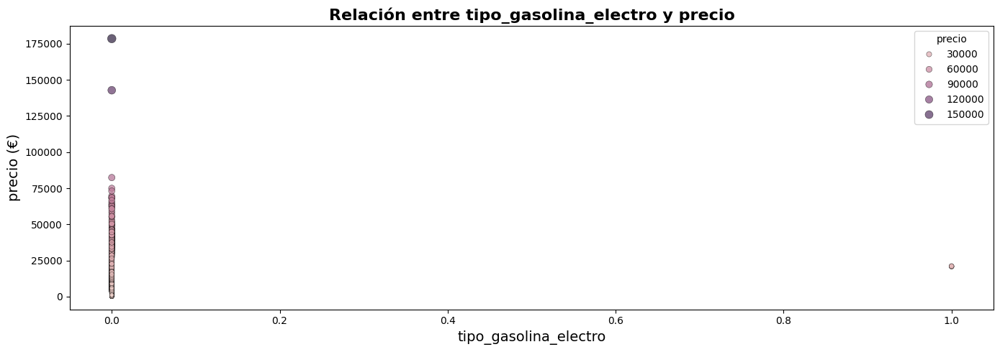

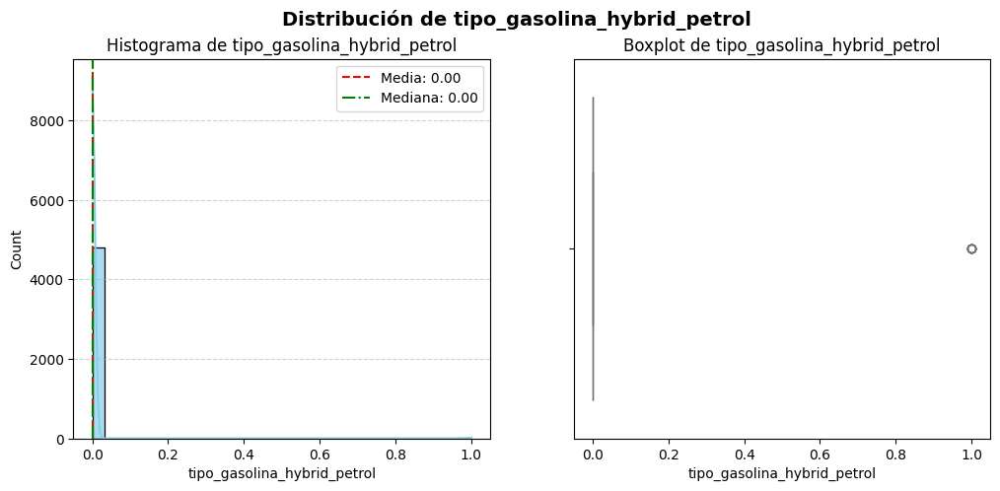




🔎 Columna: tipo_gasolina_petrol
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.037716
std         0.190529
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: tipo_gasolina_petrol, dtype: float64


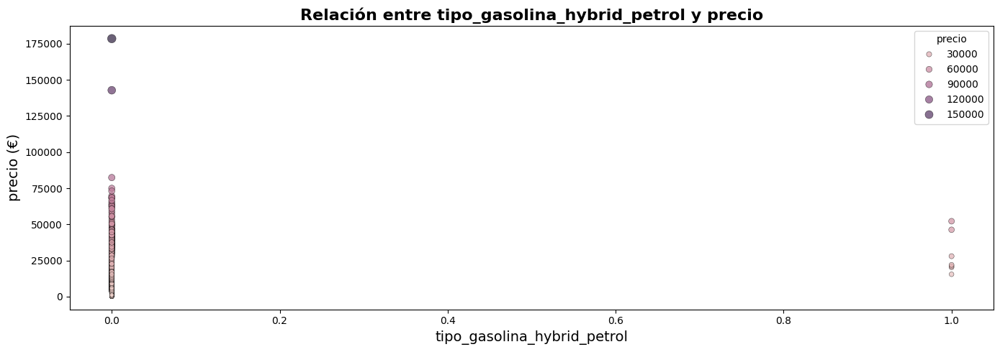

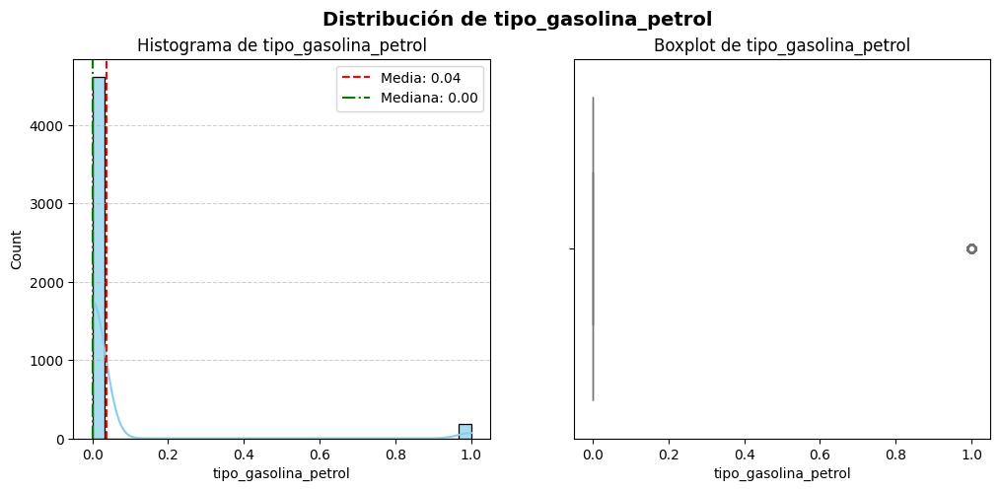




🔎 Columna: modelo_114
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003126
std         0.055826
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_114, dtype: float64


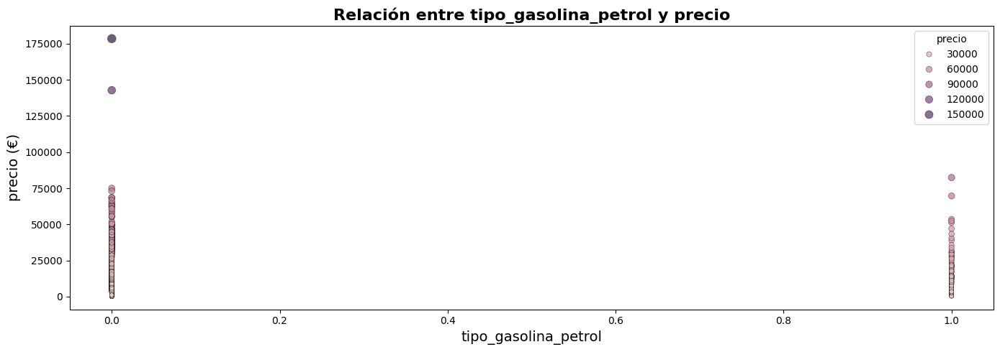

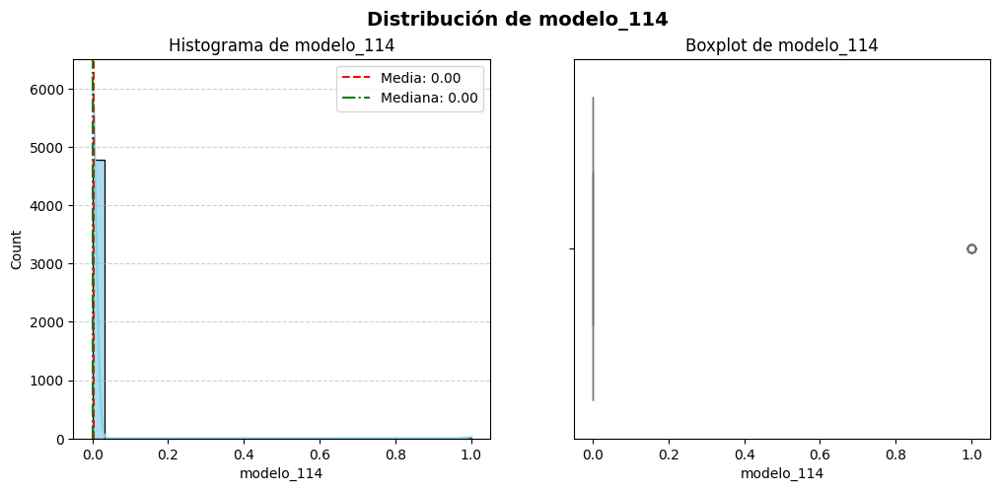




🔎 Columna: modelo_116
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.074599
std         0.262770
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_116, dtype: float64


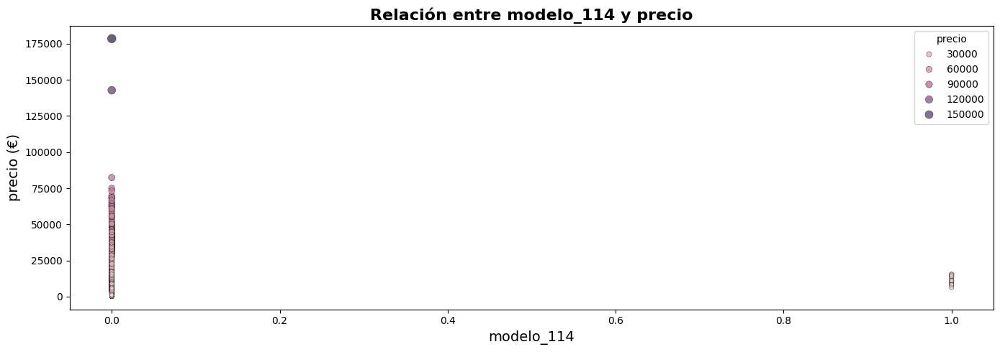

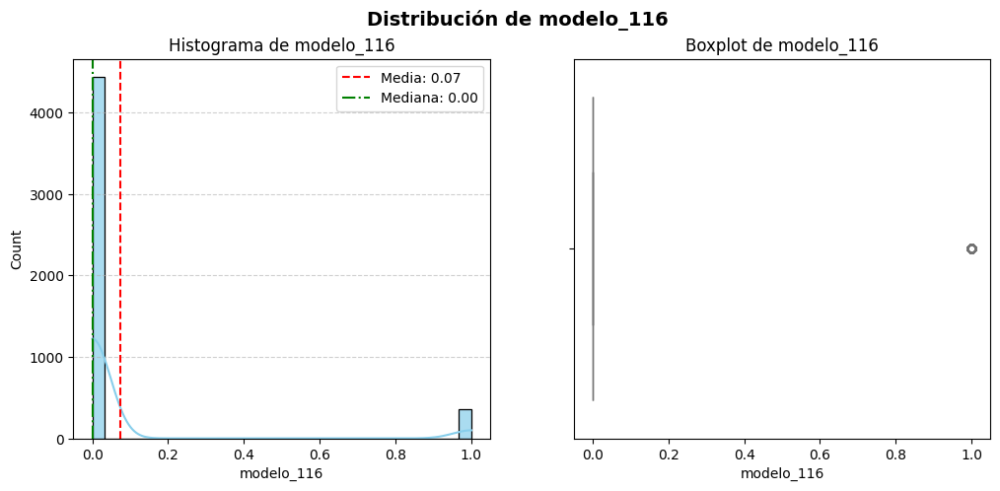




🔎 Columna: modelo_118
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.029798
std         0.170047
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_118, dtype: float64


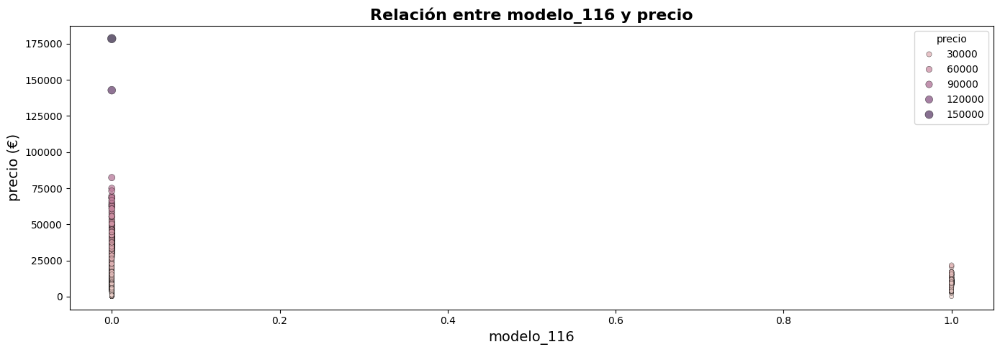

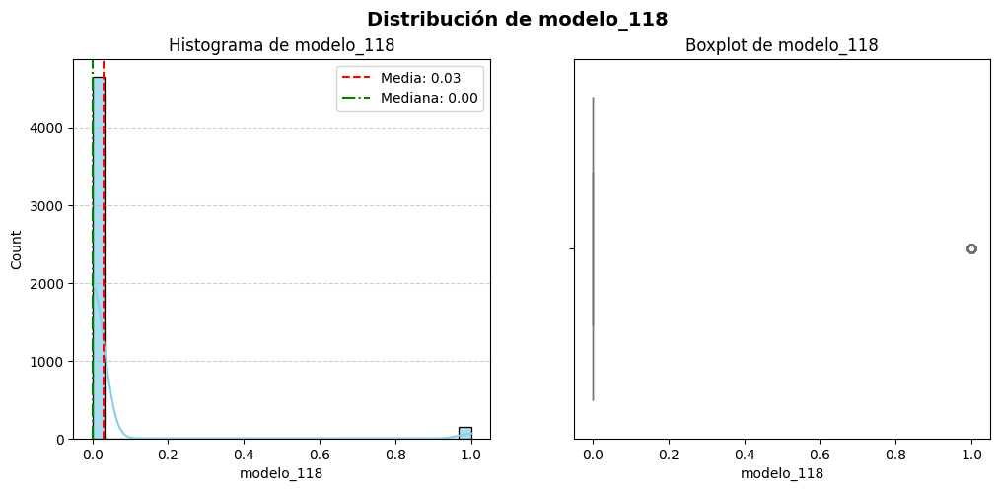




🔎 Columna: modelo_120
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.007502
std         0.086295
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_120, dtype: float64


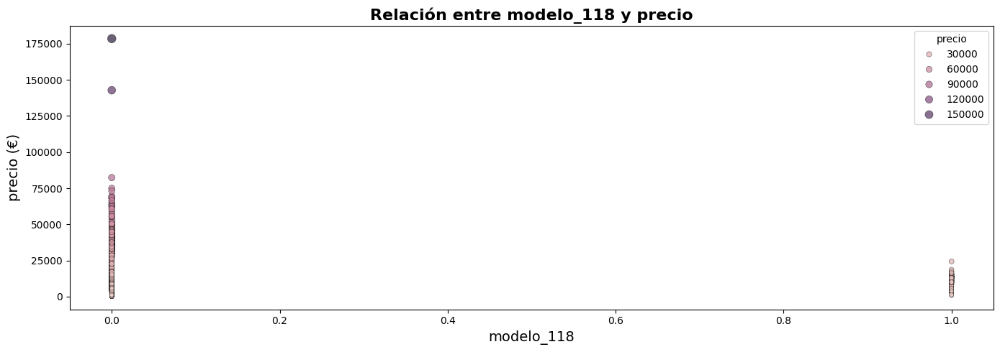

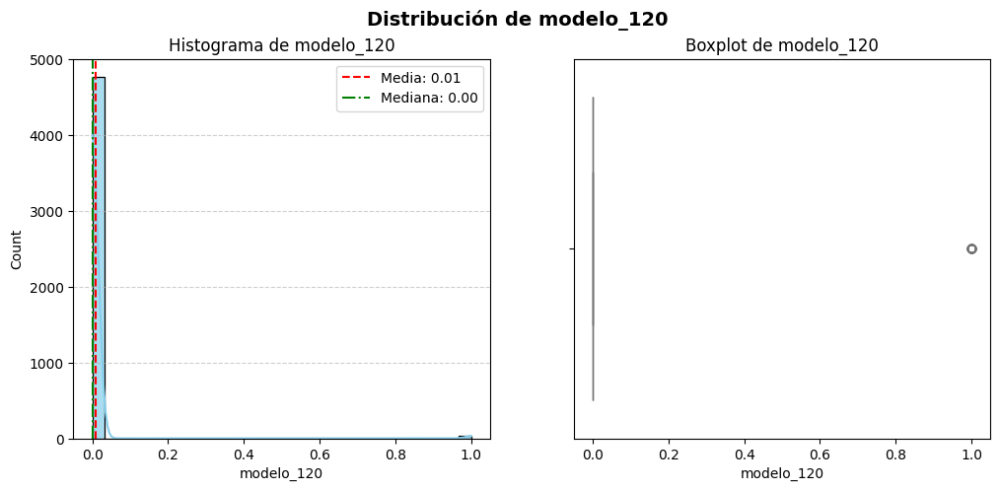




🔎 Columna: modelo_125
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001042
std         0.032265
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_125, dtype: float64


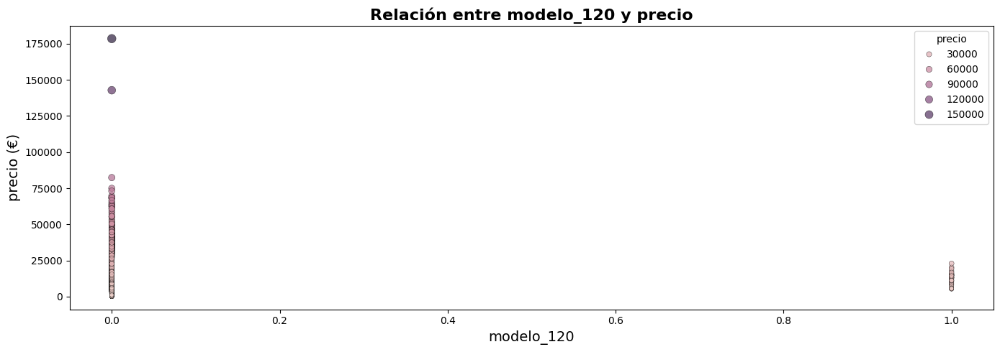

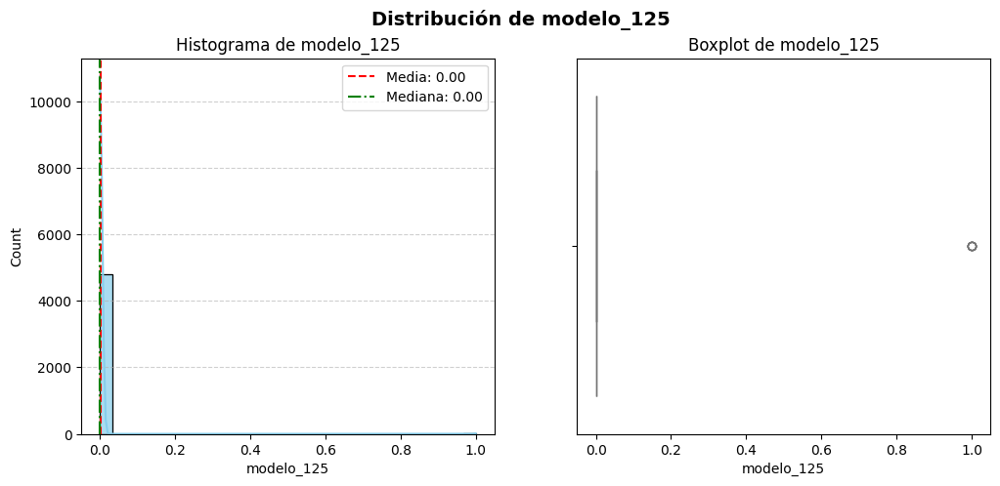




🔎 Columna: modelo_135
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_135, dtype: float64


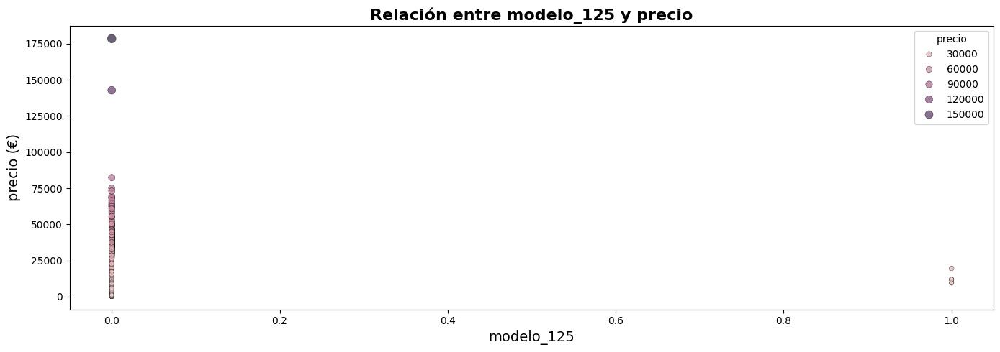

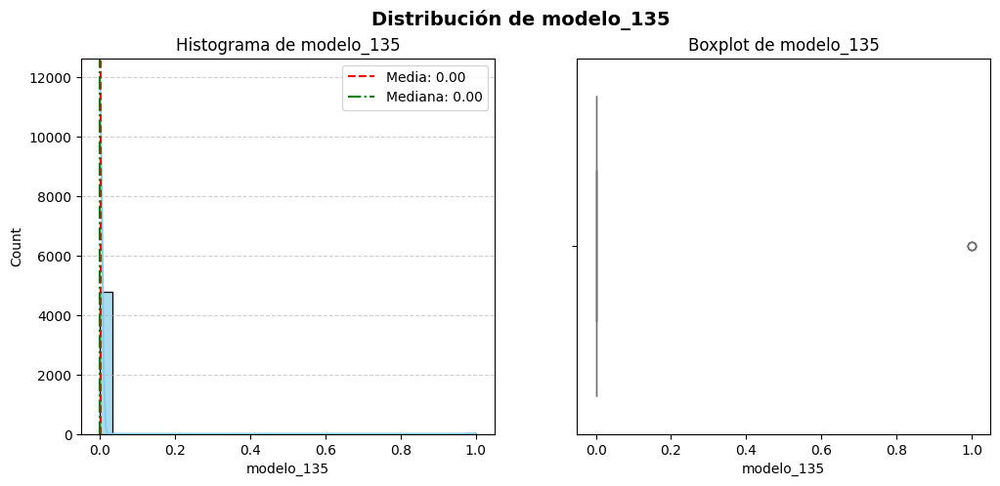




🔎 Columna: modelo_214-Gran-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_214-Gran-Tourer, dtype: float64


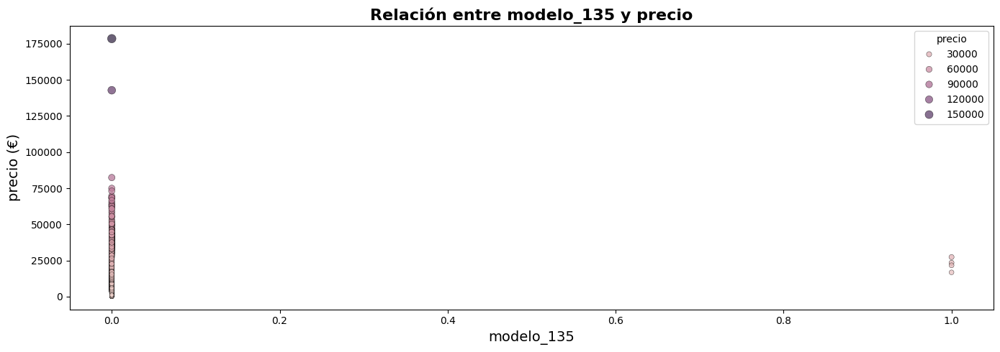

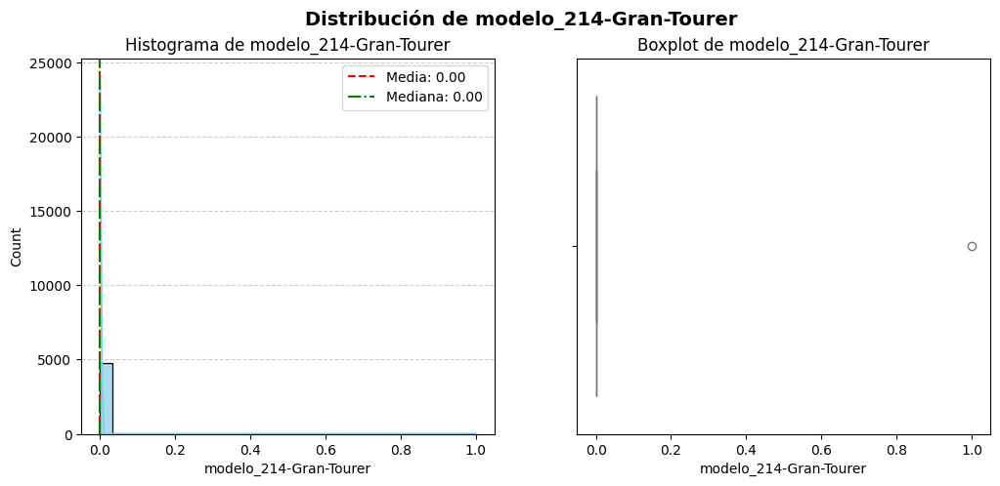




🔎 Columna: modelo_216-Active-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_216-Active-Tourer, dtype: float64


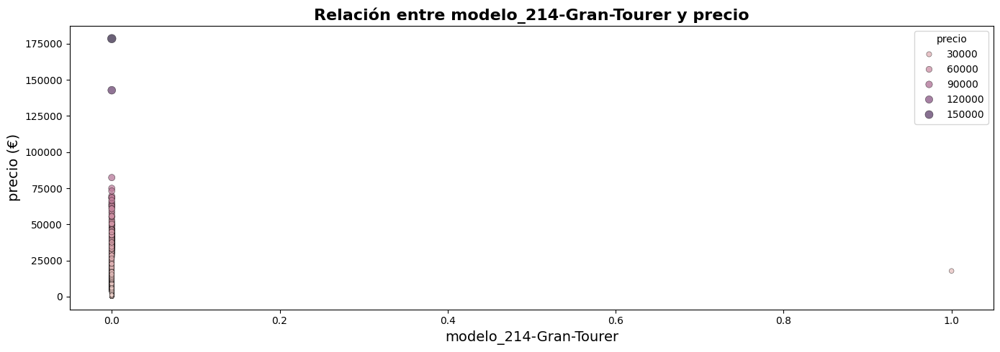

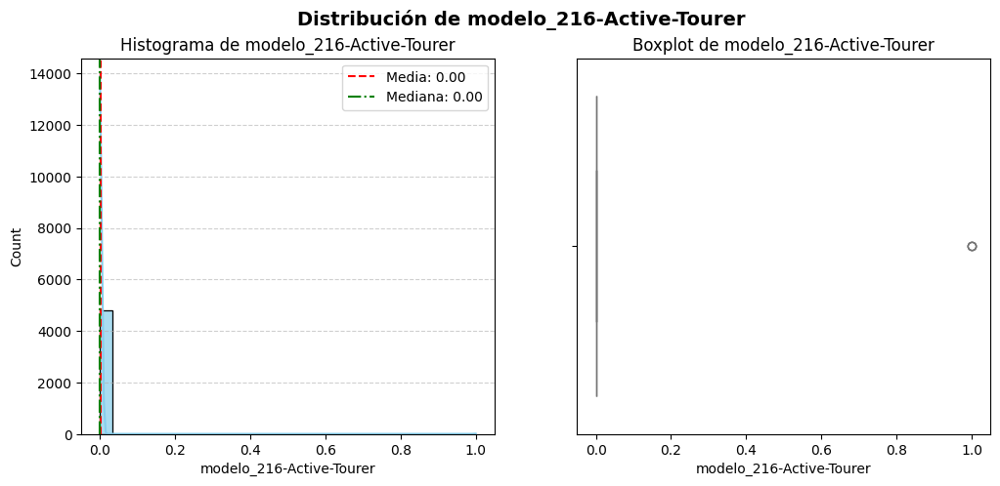




🔎 Columna: modelo_216-Gran-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_216-Gran-Tourer, dtype: float64


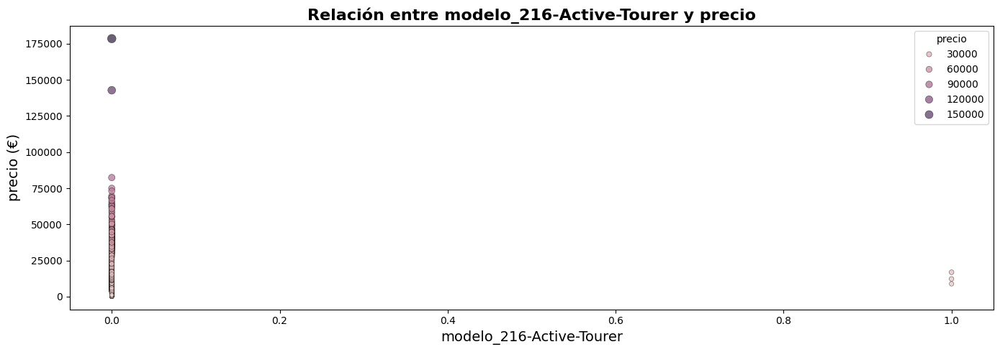

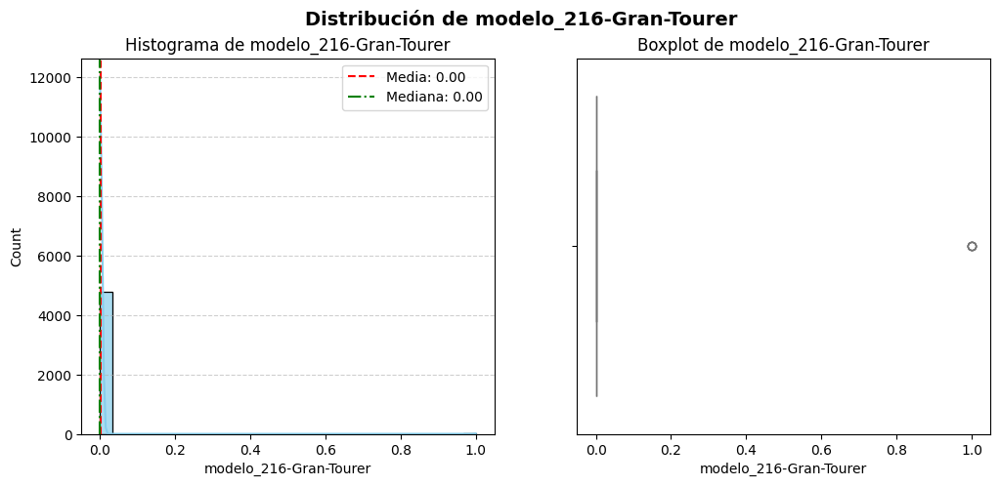




🔎 Columna: modelo_218
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.002501
std         0.049948
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_218, dtype: float64


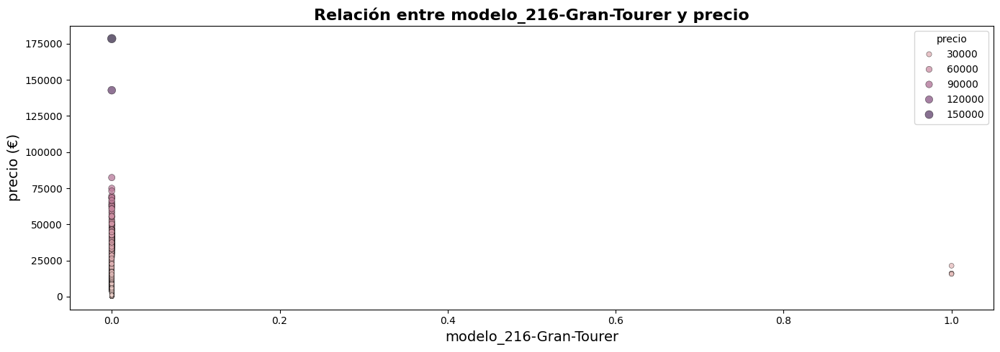

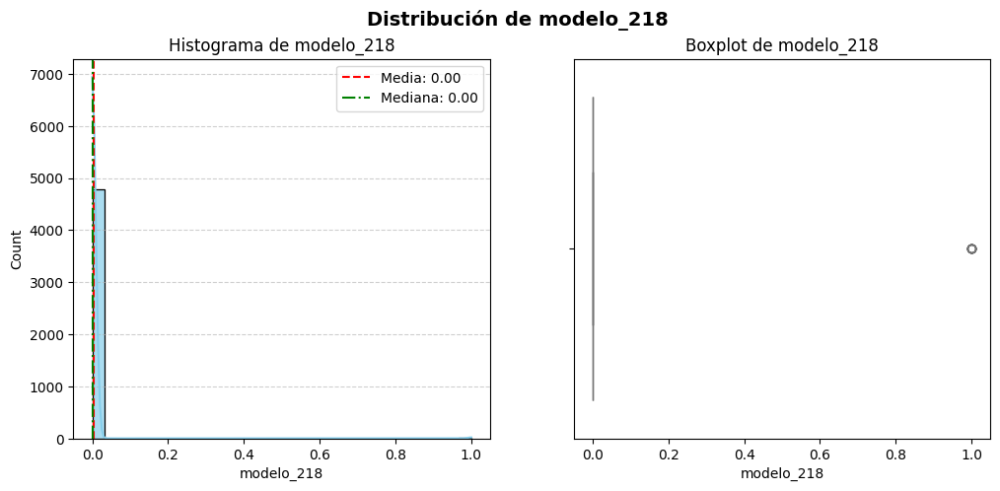




🔎 Columna: modelo_218-Active-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.002709
std         0.051982
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_218-Active-Tourer, dtype: float64


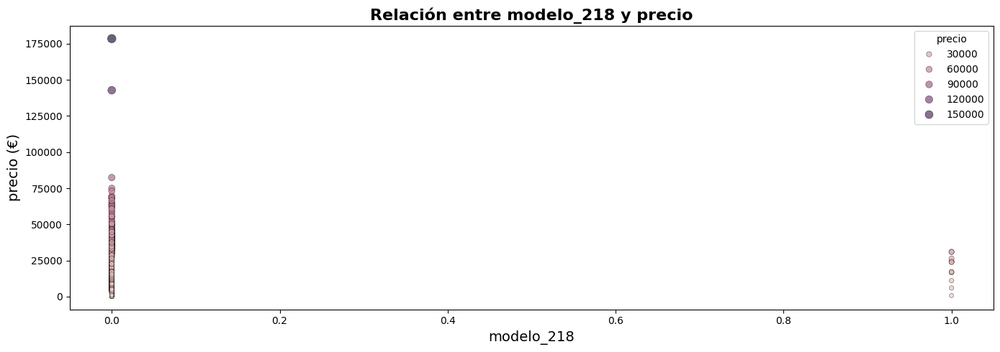

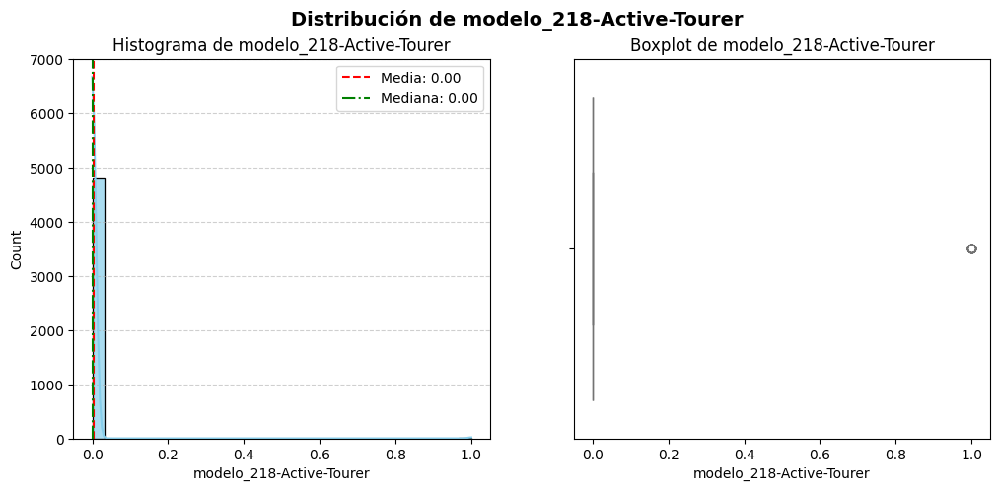




🔎 Columna: modelo_218-Gran-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001875
std         0.043270
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_218-Gran-Tourer, dtype: float64


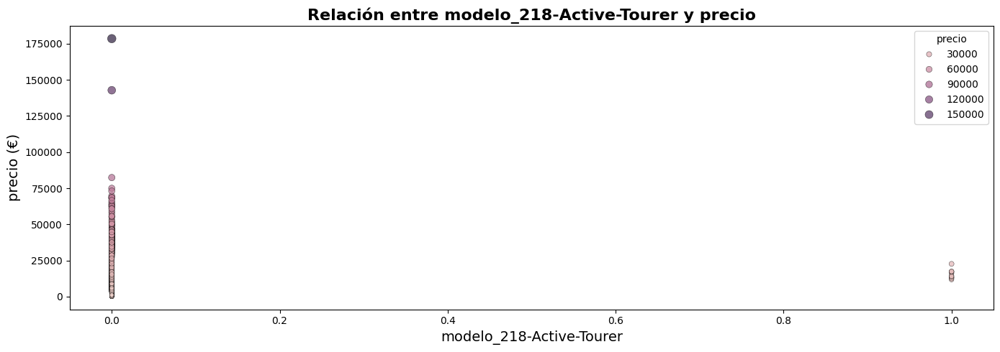

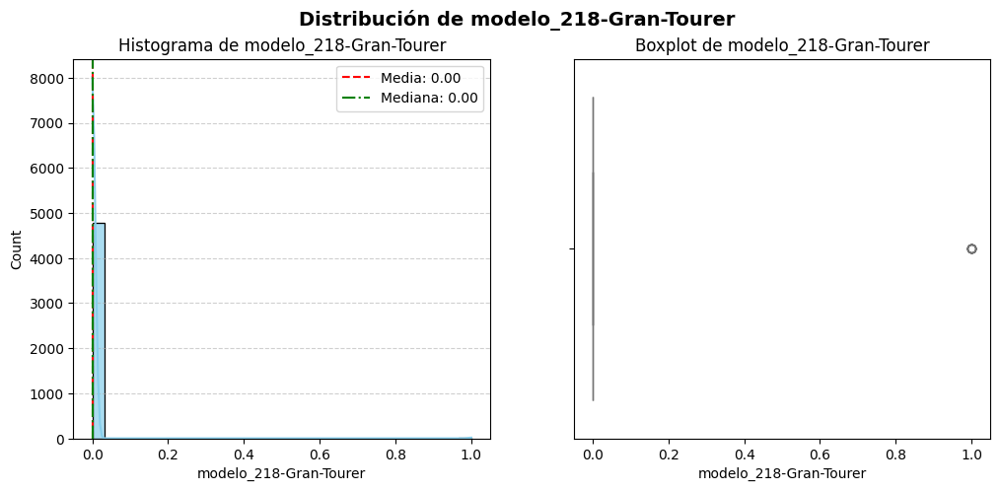




🔎 Columna: modelo_220
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_220, dtype: float64


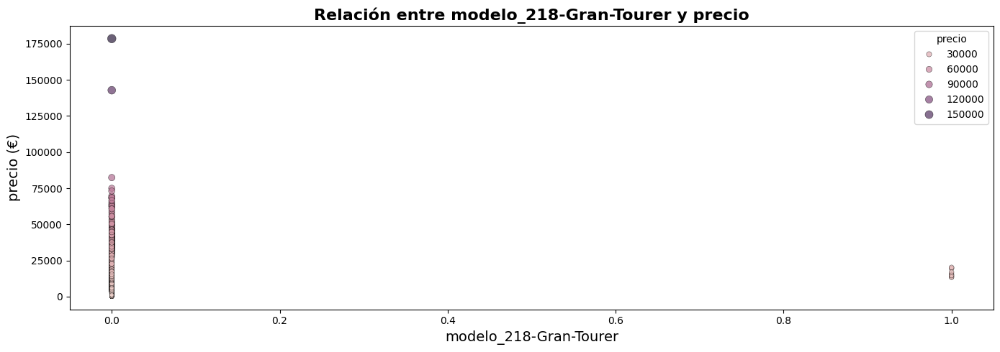

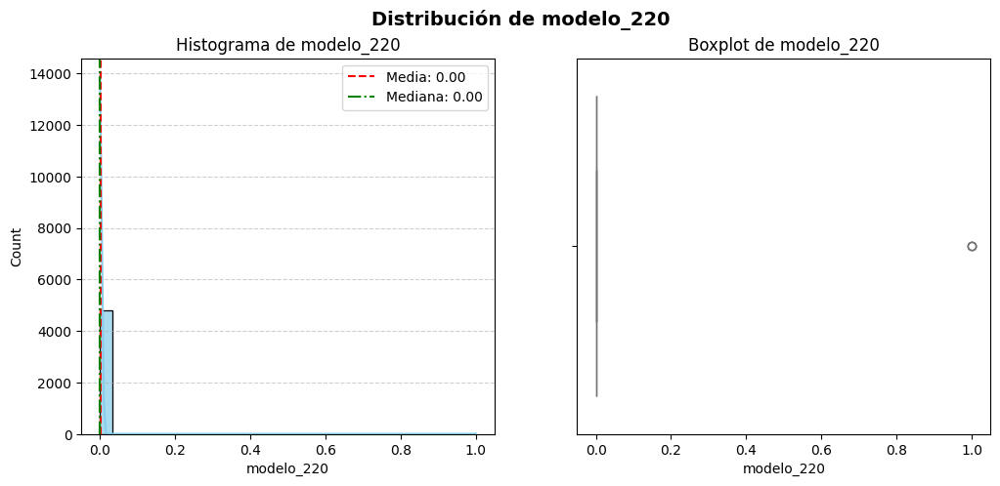




🔎 Columna: modelo_220-Active-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_220-Active-Tourer, dtype: float64


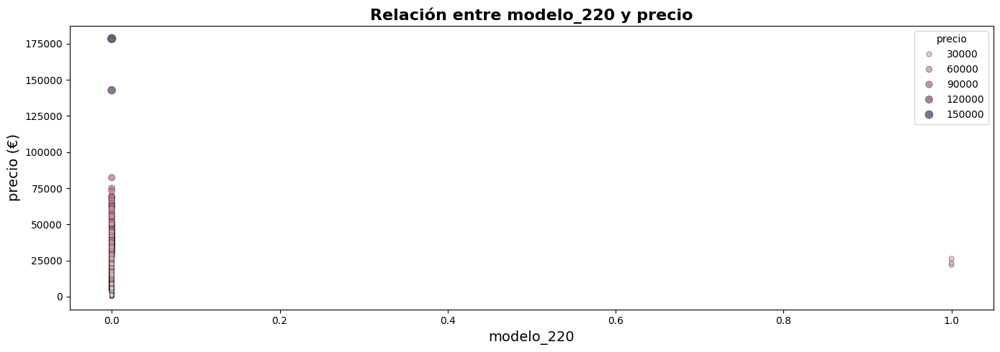

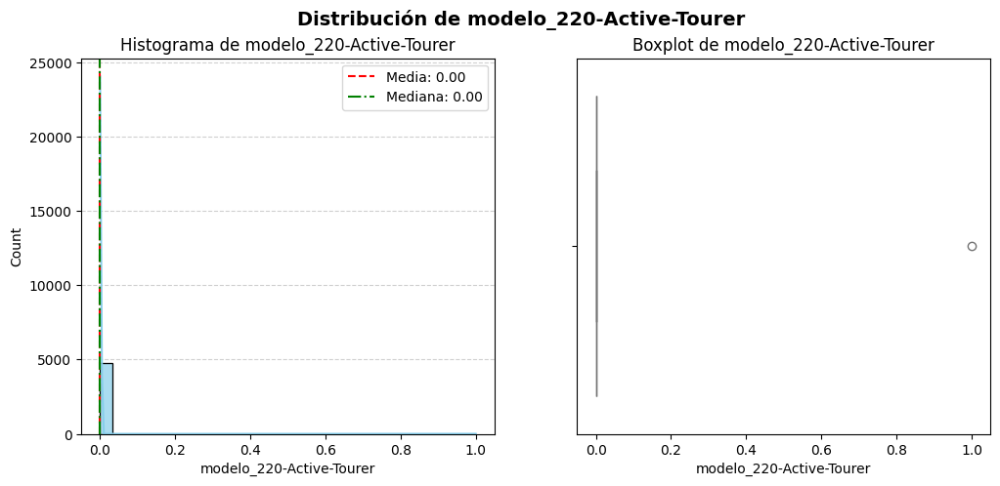




🔎 Columna: modelo_316
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.048552
std         0.214951
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_316, dtype: float64


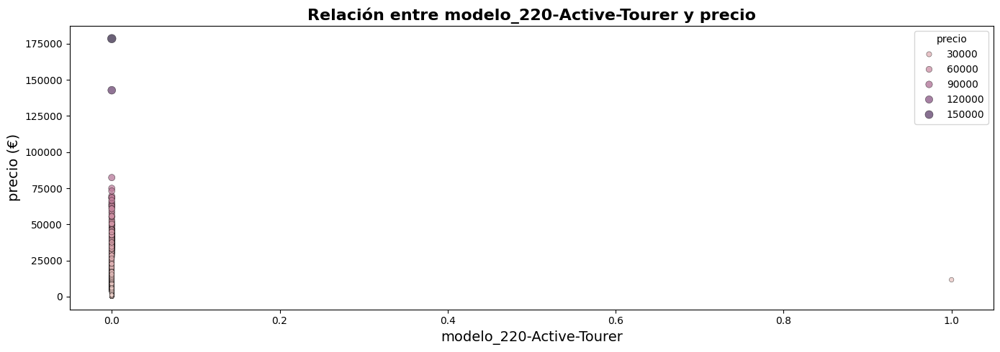

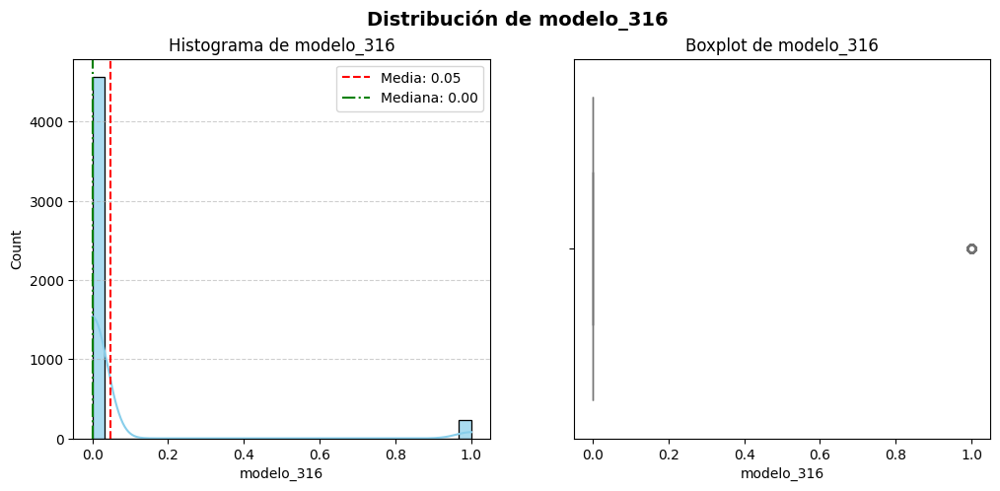




🔎 Columna: modelo_318
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.117108
std         0.321582
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_318, dtype: float64


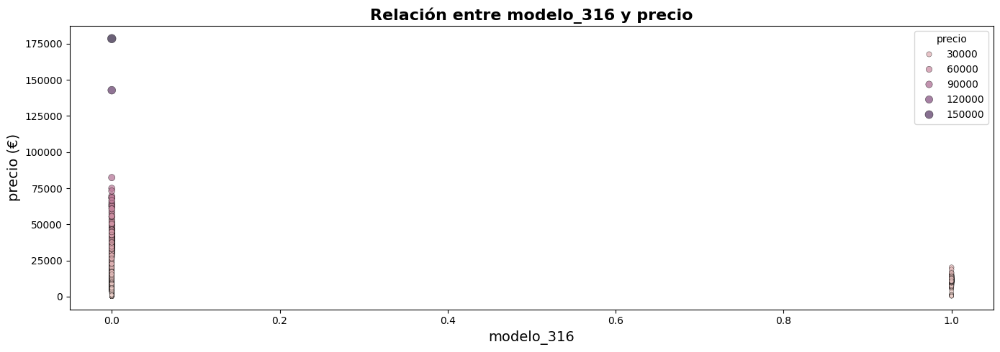

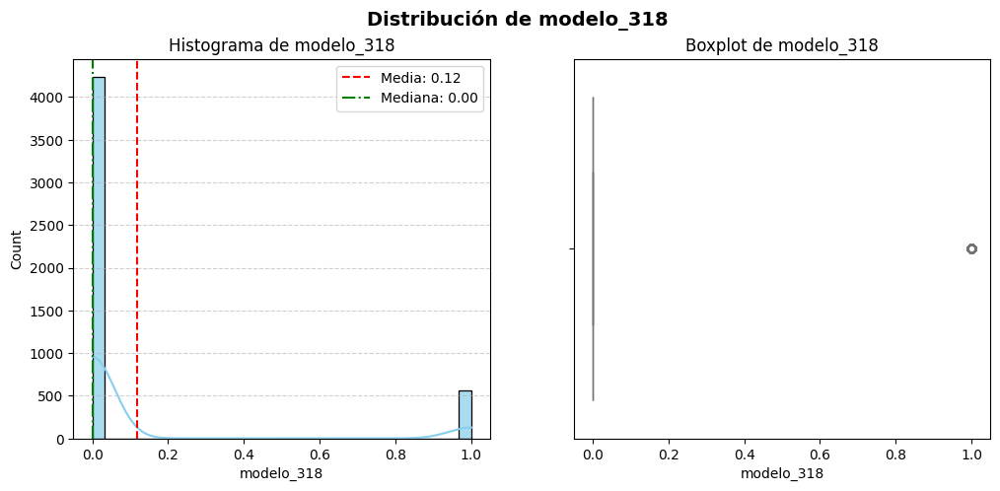




🔎 Columna: modelo_318-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.020213
std         0.140741
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_318-Gran-Turismo, dtype: float64


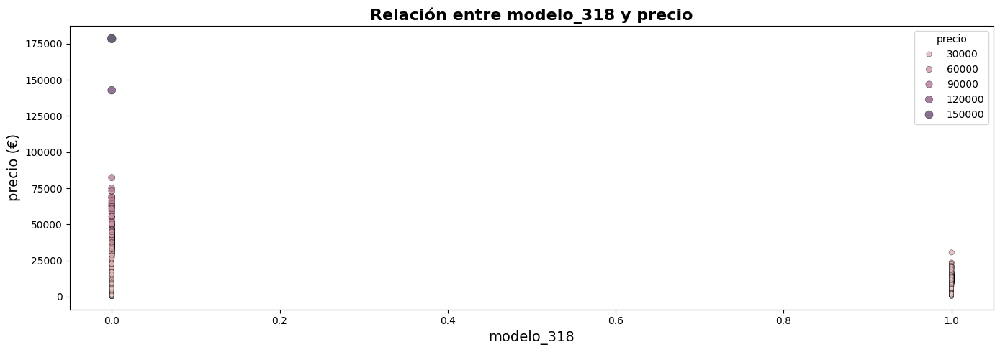

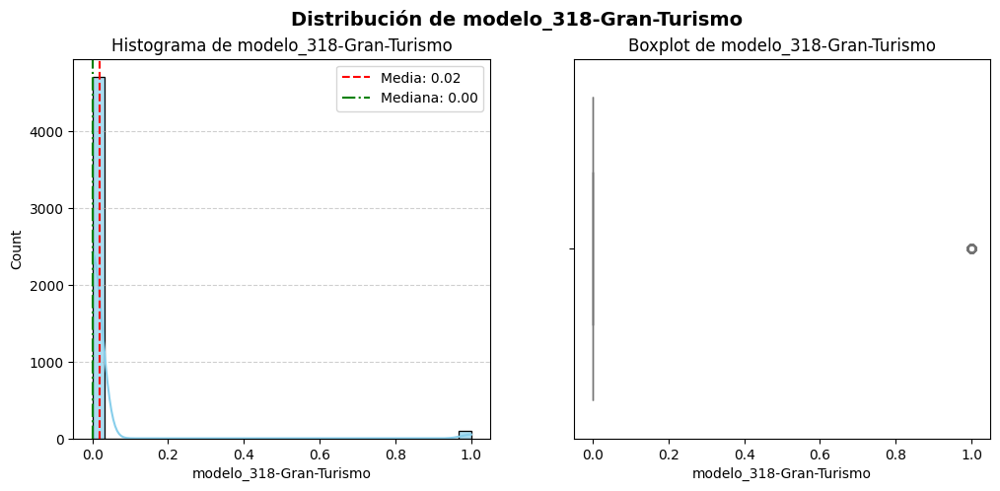




🔎 Columna: modelo_320
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.155657
std         0.362568
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_320, dtype: float64


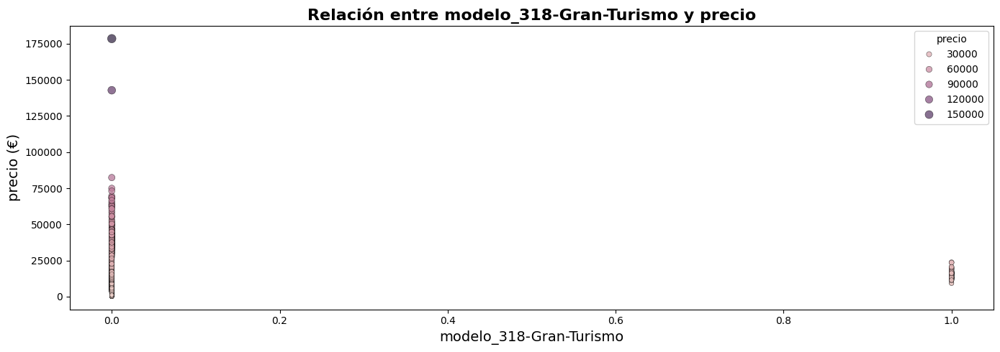

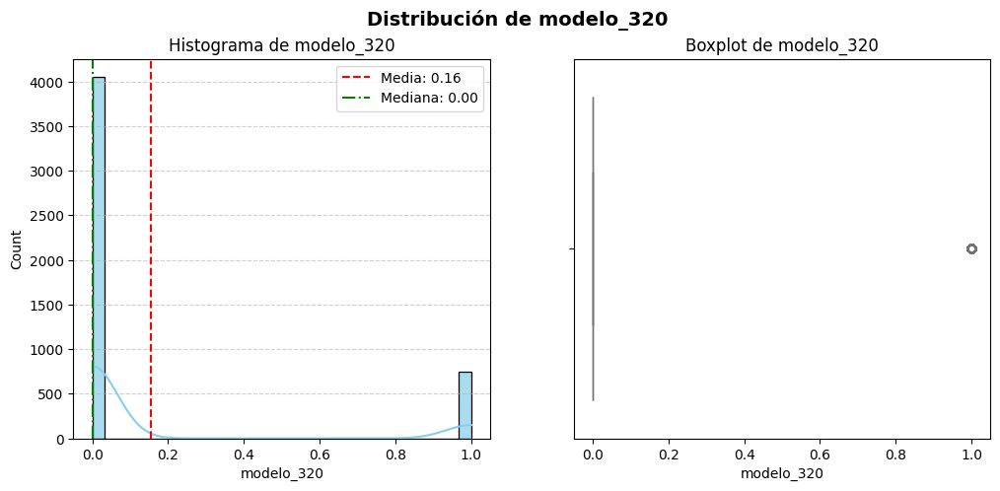




🔎 Columna: modelo_320-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.015212
std         0.122406
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_320-Gran-Turismo, dtype: float64


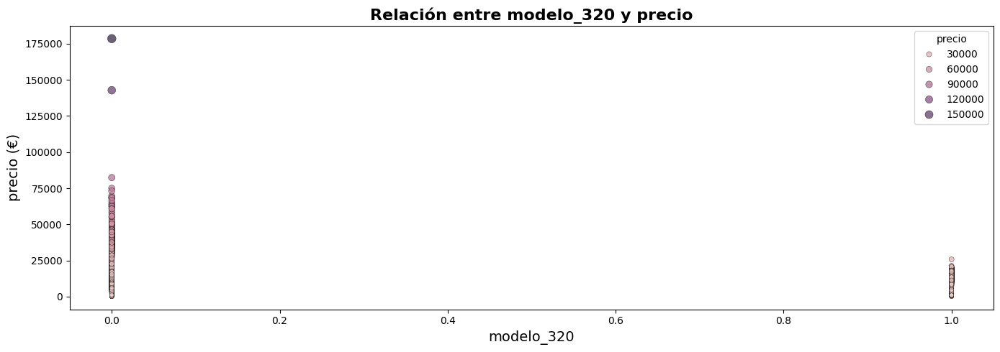

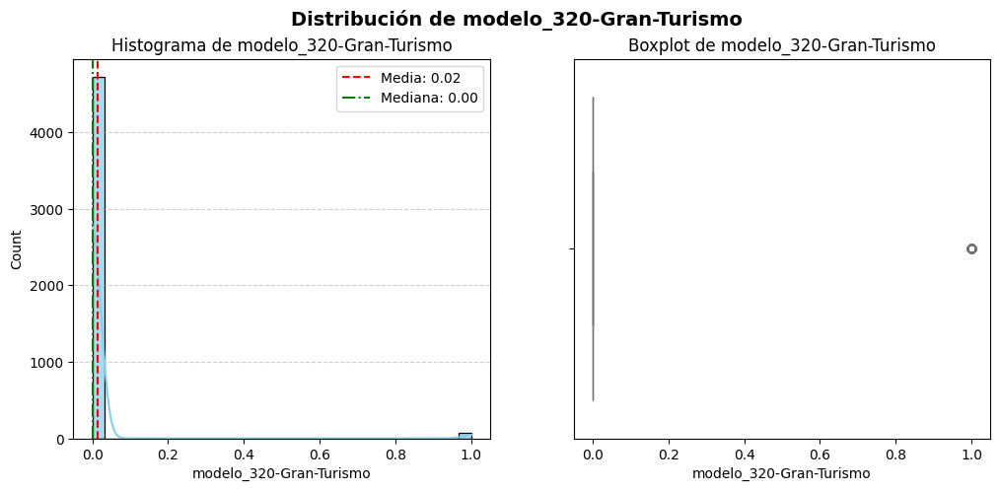




🔎 Columna: modelo_325
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003959
std         0.062804
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_325, dtype: float64


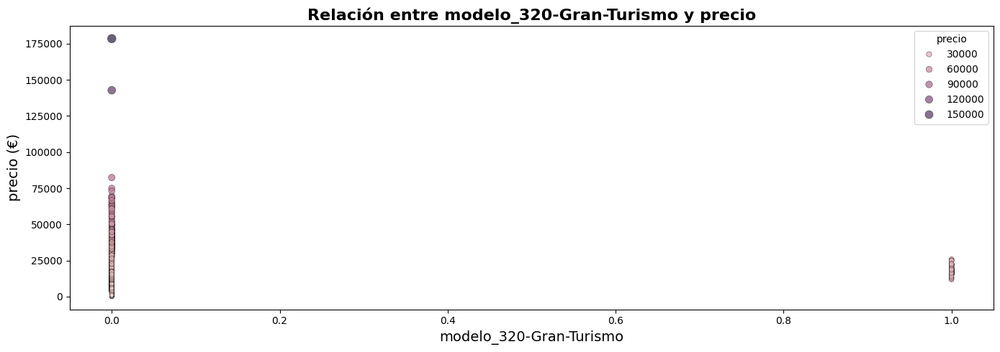

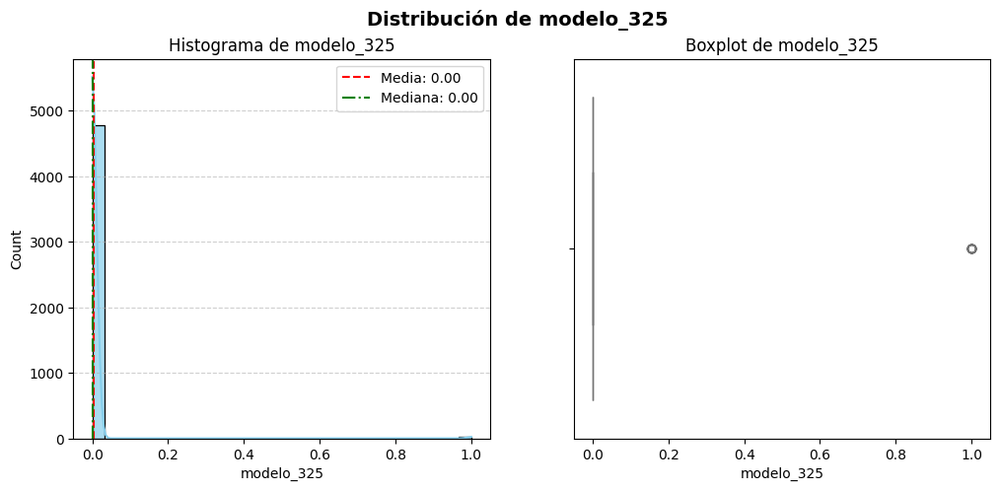




🔎 Columna: modelo_325-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_325-Gran-Turismo, dtype: float64


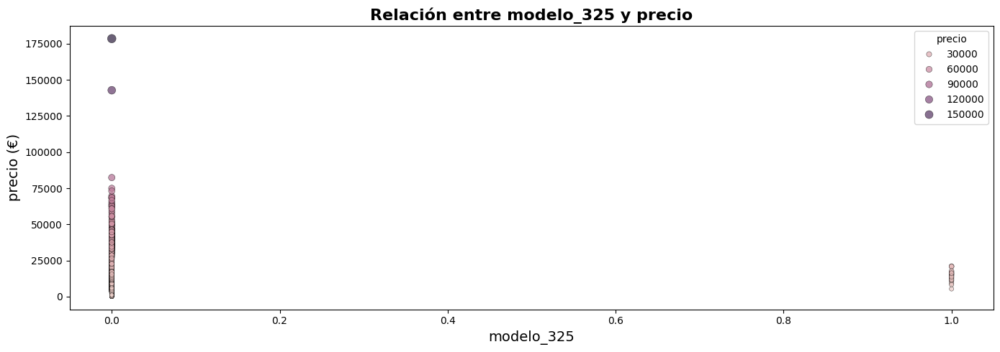

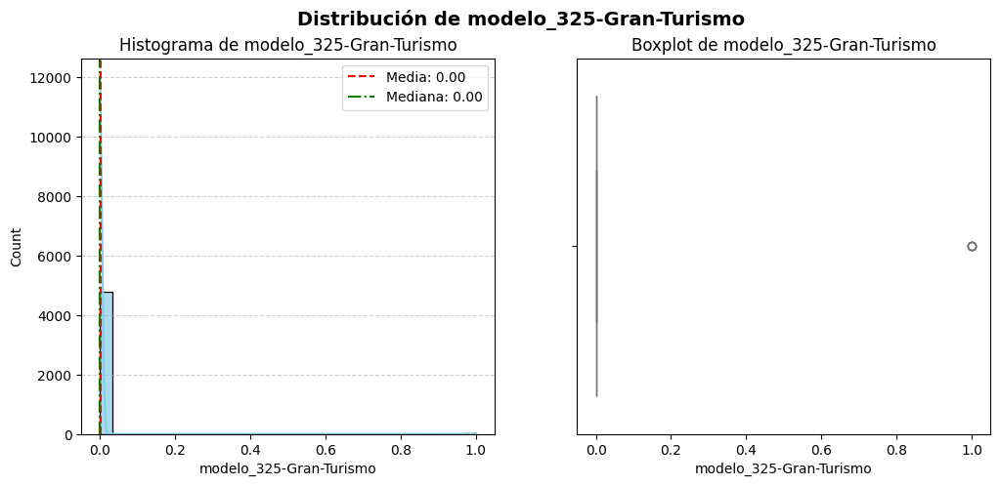




🔎 Columna: modelo_328
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001042
std         0.032265
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_328, dtype: float64


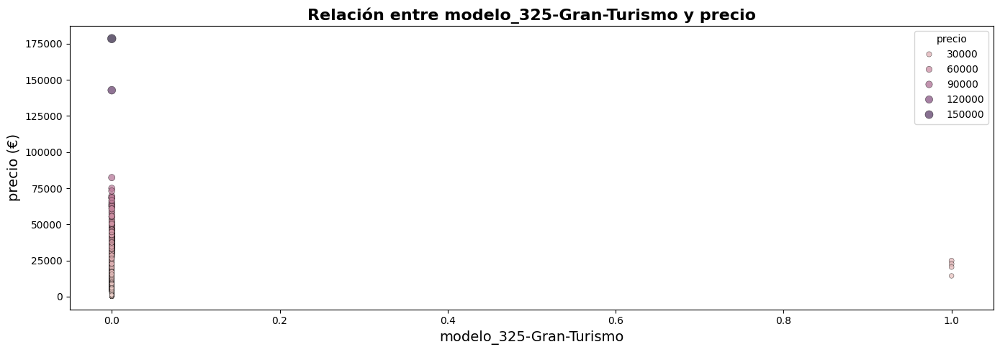

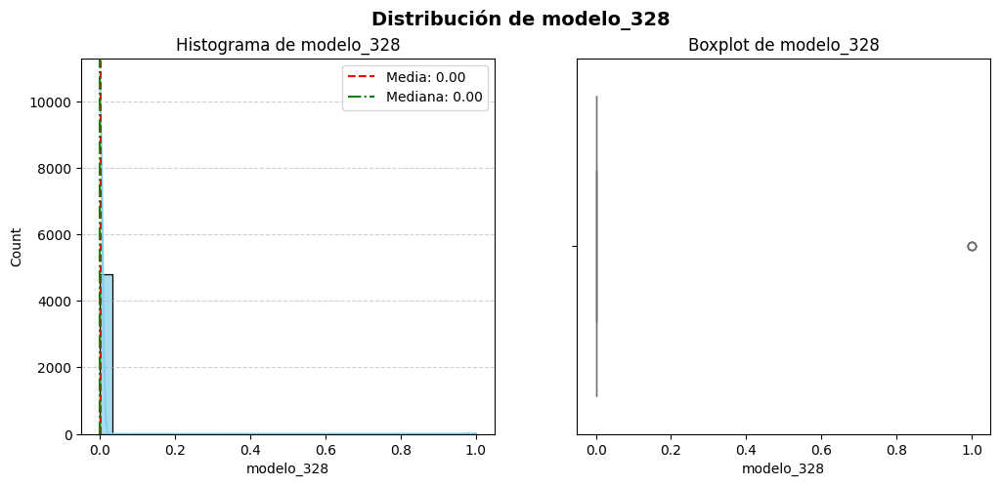




🔎 Columna: modelo_330
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.006876
std         0.082647
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_330, dtype: float64


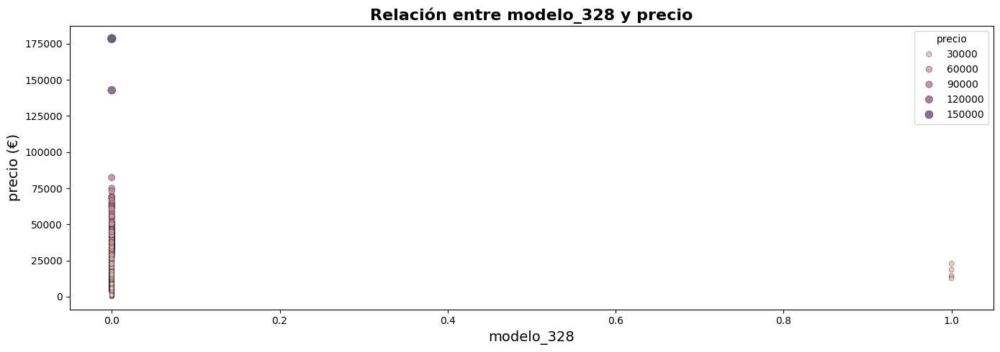

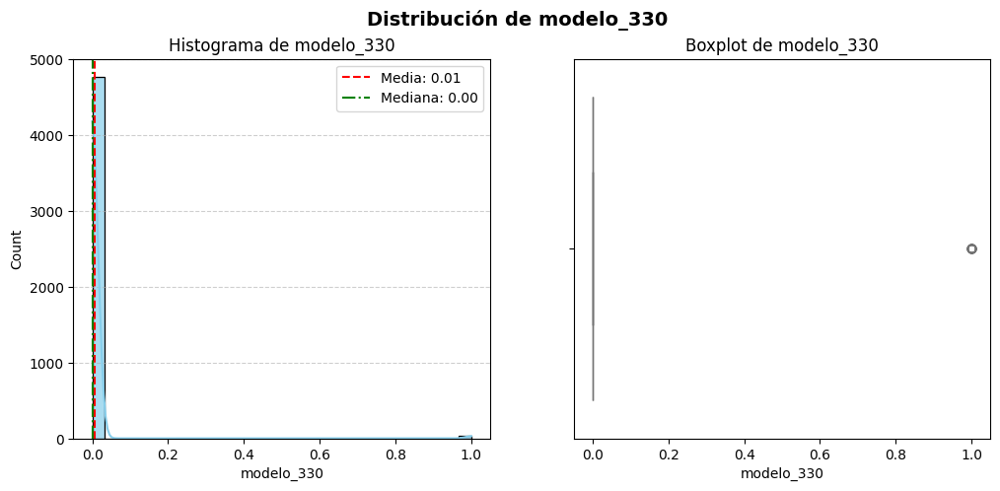




🔎 Columna: modelo_330-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_330-Gran-Turismo, dtype: float64


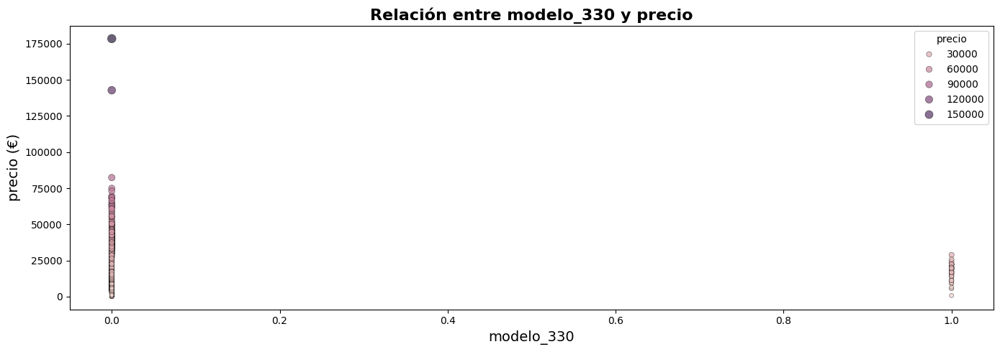

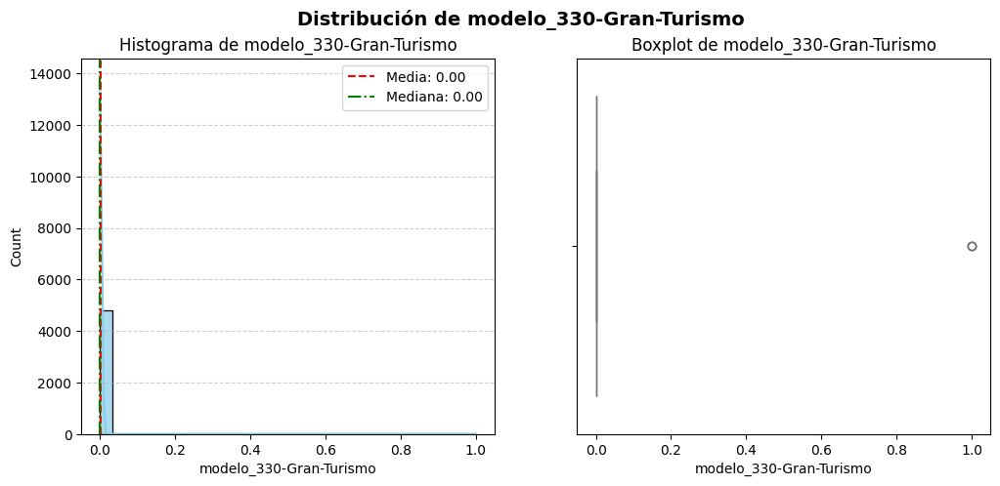




🔎 Columna: modelo_335
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001459
std         0.038168
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_335, dtype: float64


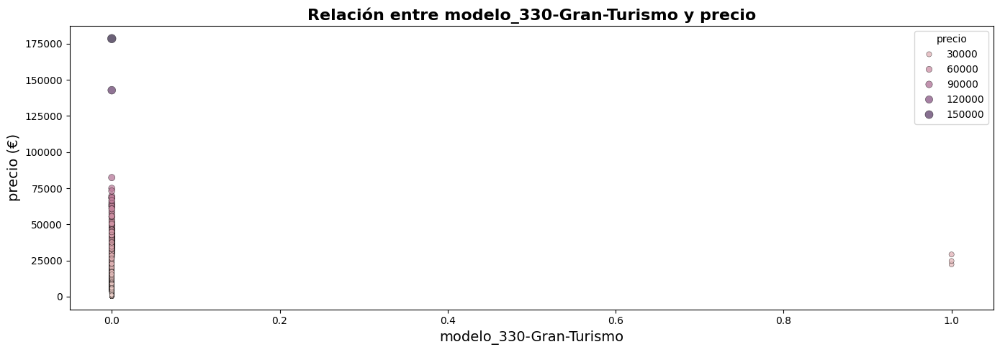

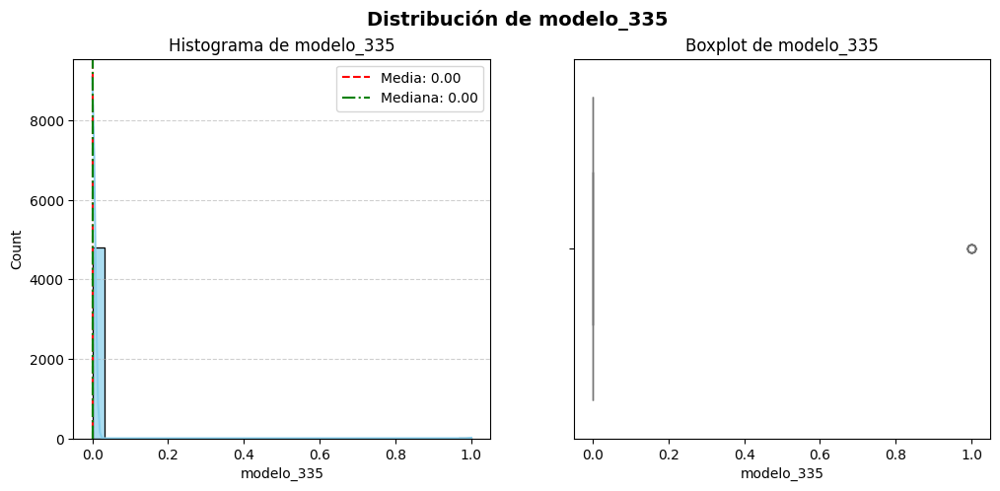




🔎 Columna: modelo_335-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_335-Gran-Turismo, dtype: float64


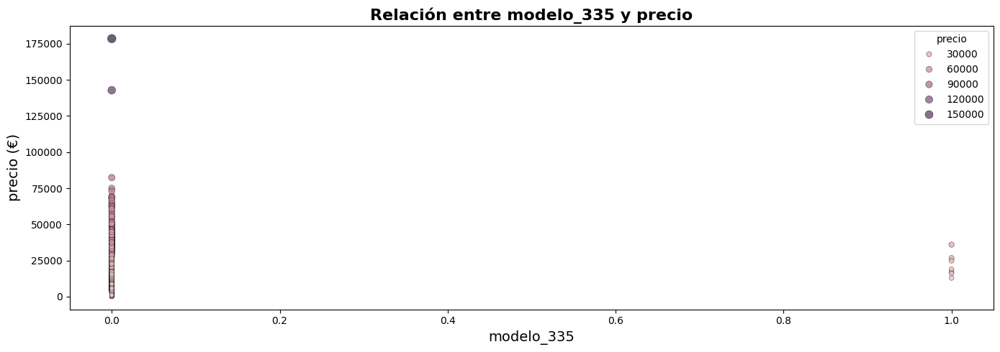

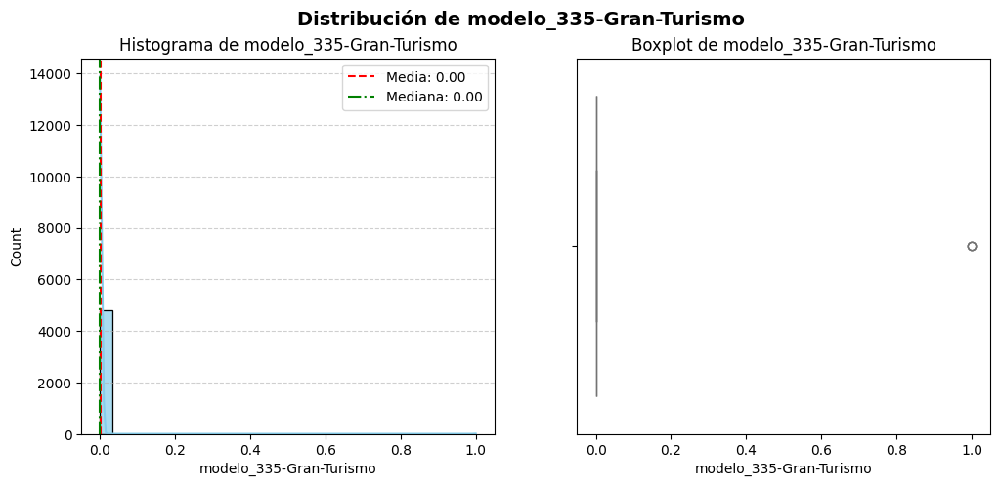




🔎 Columna: modelo_418-Gran-Coupé
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001667
std         0.040799
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_418-Gran-Coupé, dtype: float64


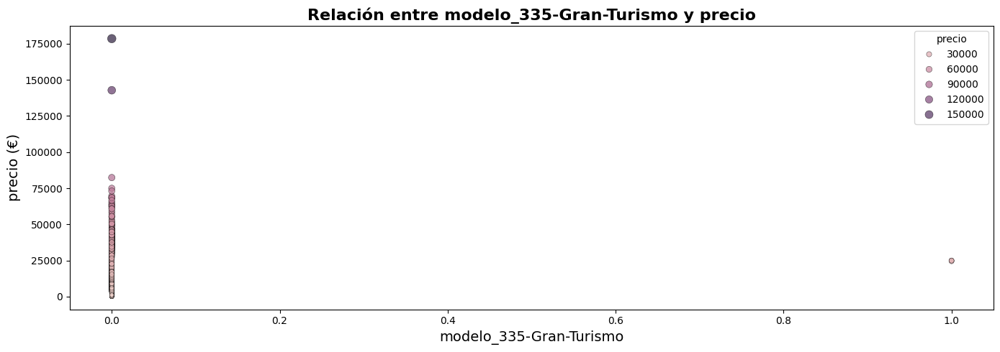

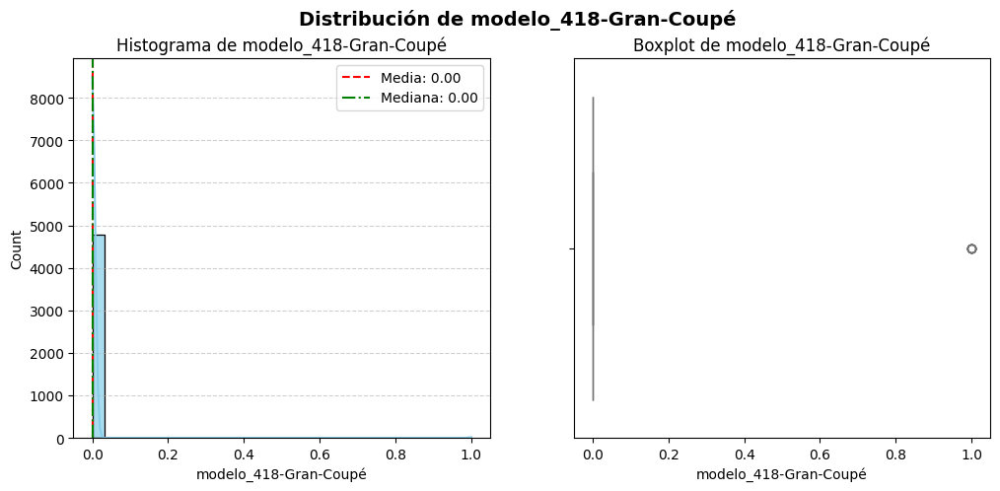




🔎 Columna: modelo_420
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.008752
std         0.093151
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_420, dtype: float64


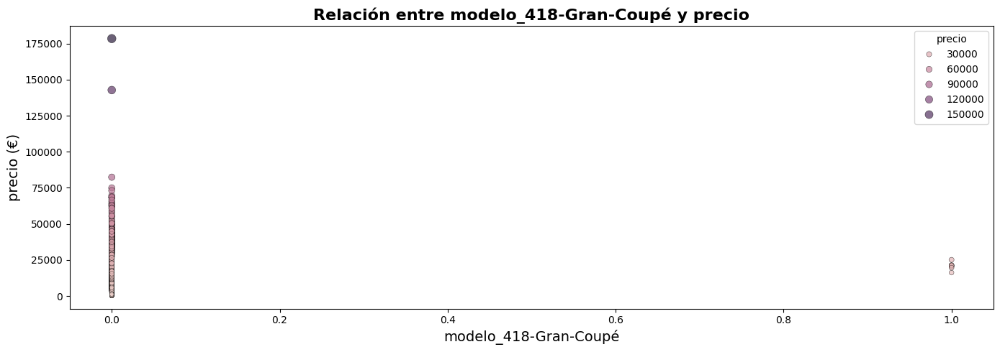

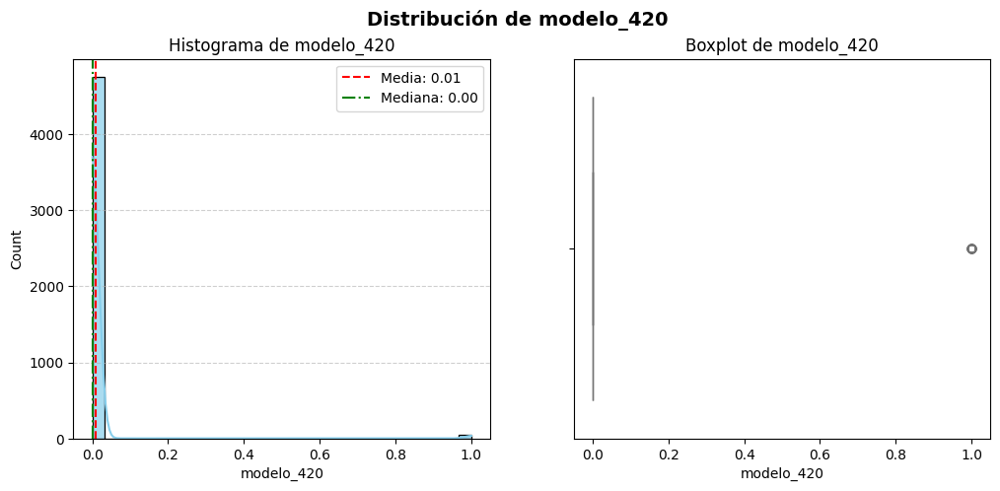




🔎 Columna: modelo_420-Gran-Coupé
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.006876
std         0.082647
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_420-Gran-Coupé, dtype: float64


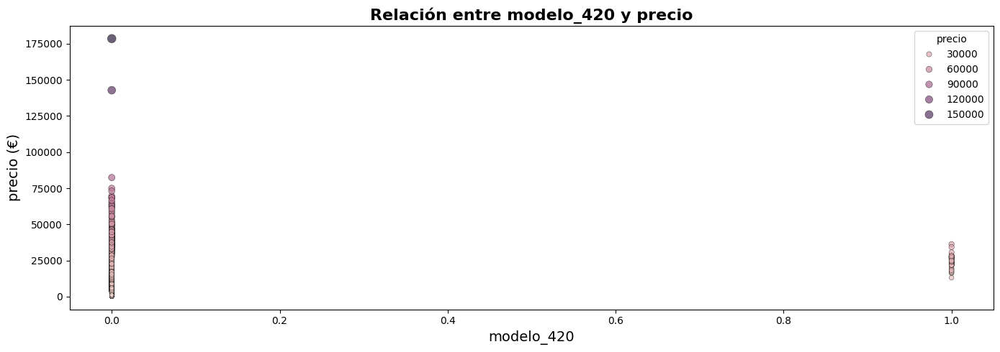

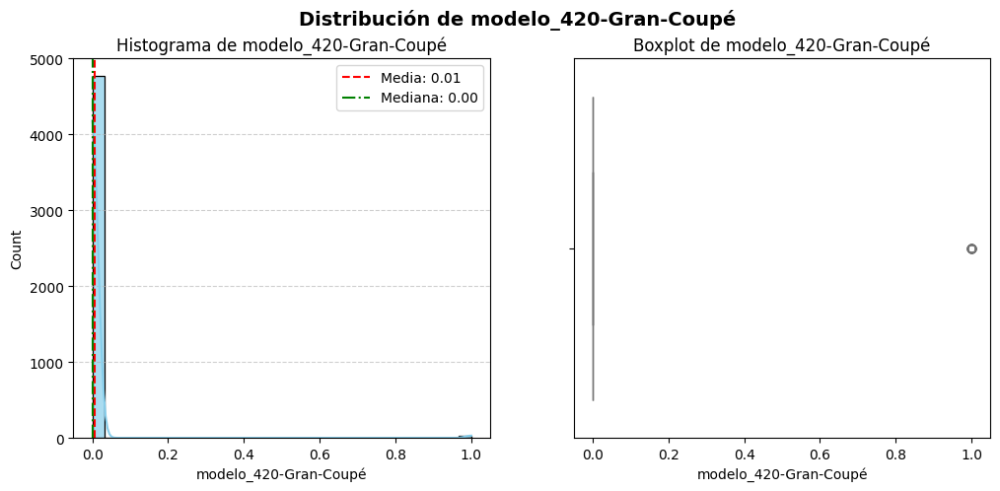




🔎 Columna: modelo_430
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000417
std         0.020412
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_430, dtype: float64


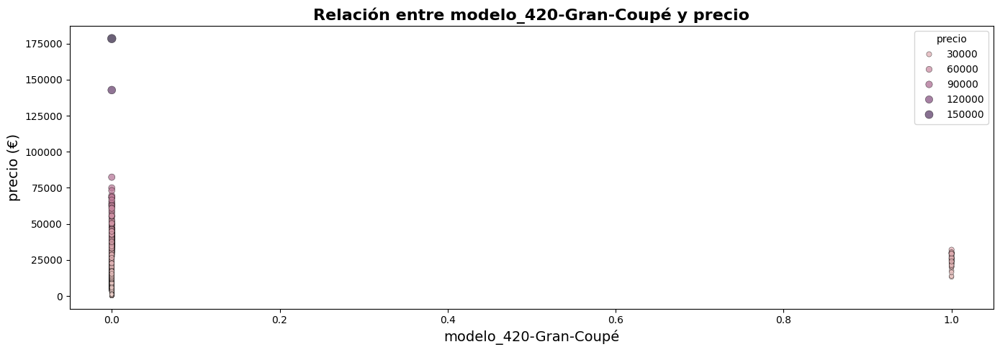

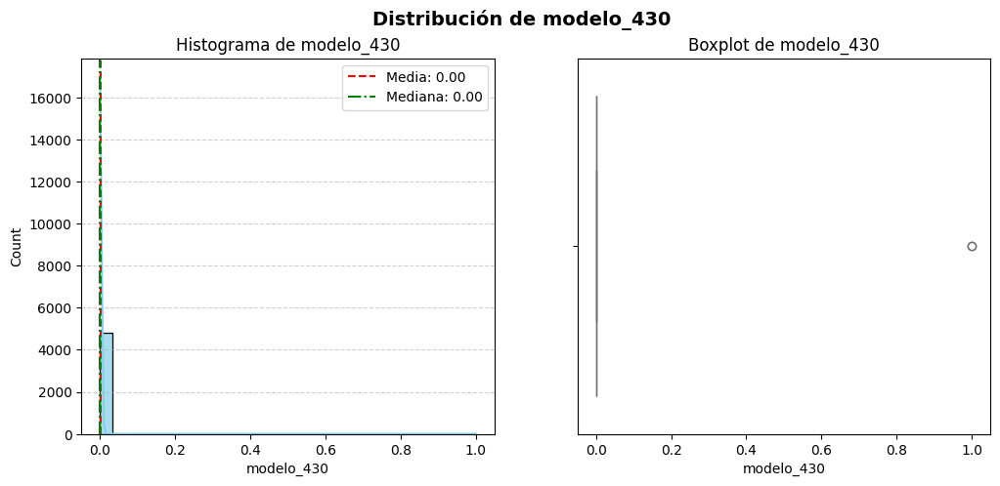




🔎 Columna: modelo_430-Gran-Coupé
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_430-Gran-Coupé, dtype: float64


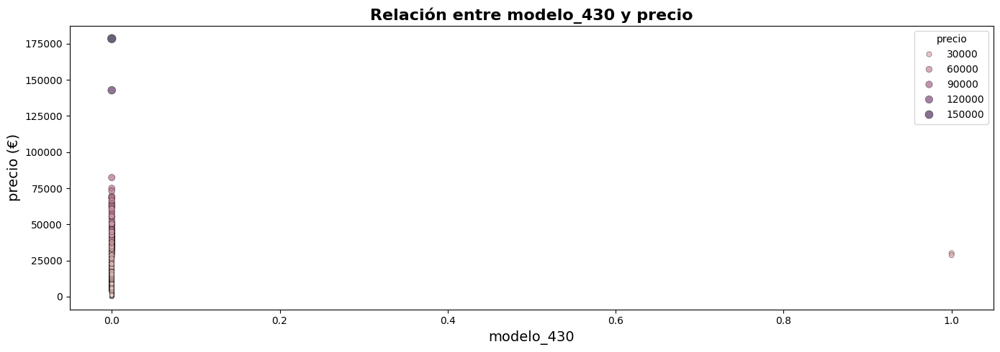

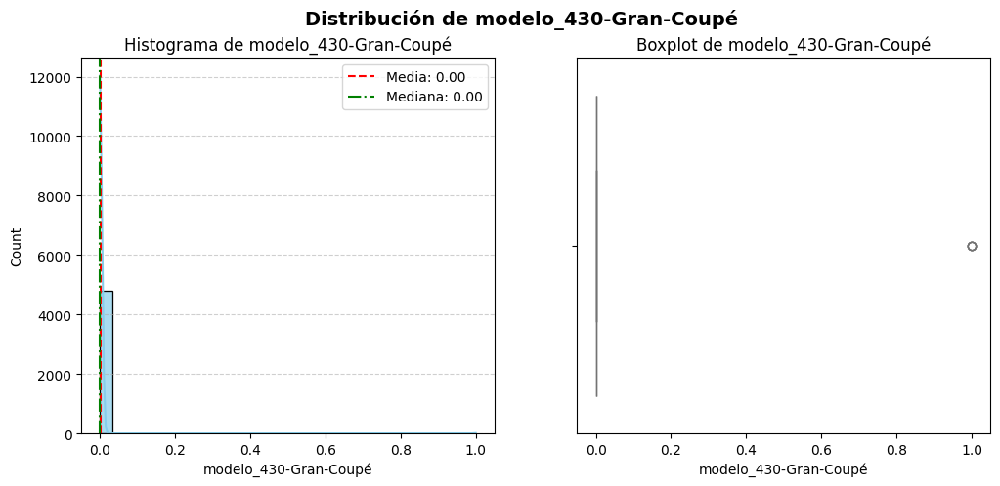




🔎 Columna: modelo_435
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_435, dtype: float64


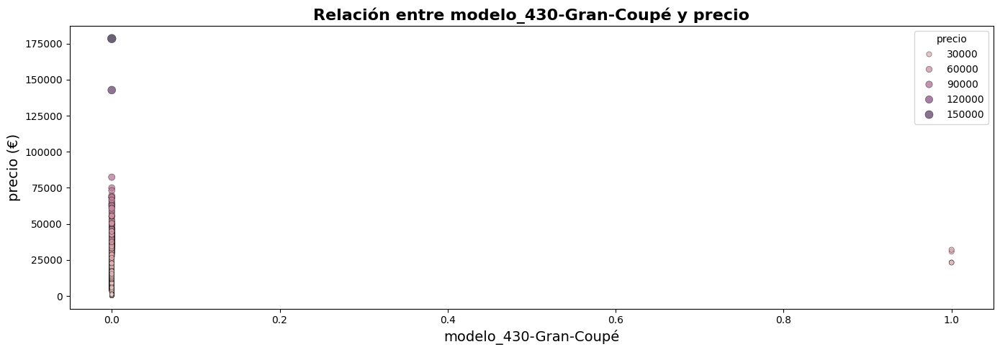

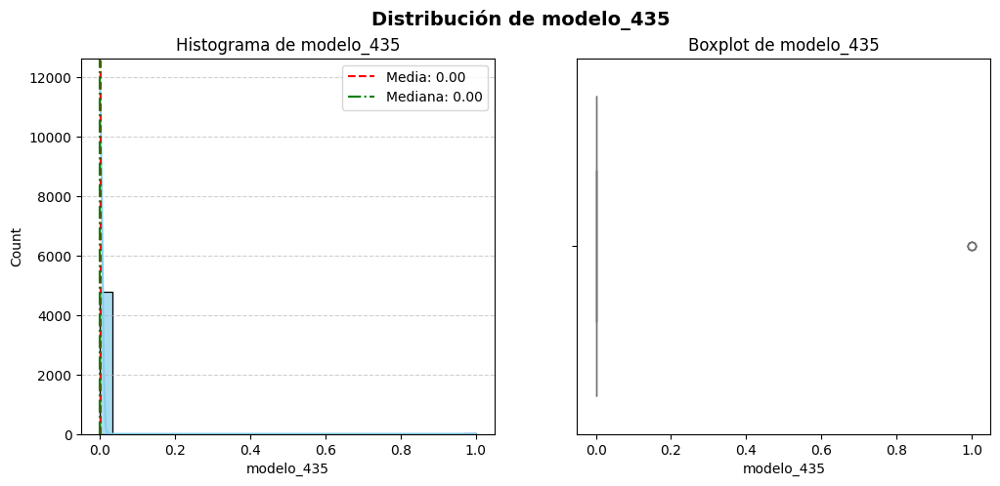




🔎 Columna: modelo_435-Gran-Coupé
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001250
std         0.035341
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_435-Gran-Coupé, dtype: float64


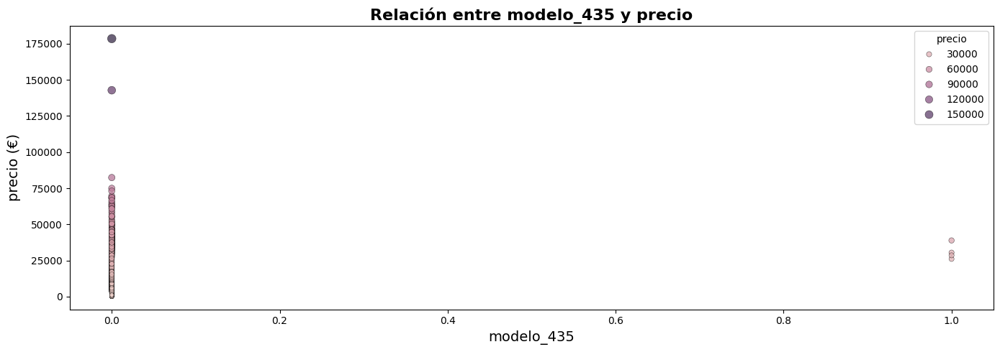

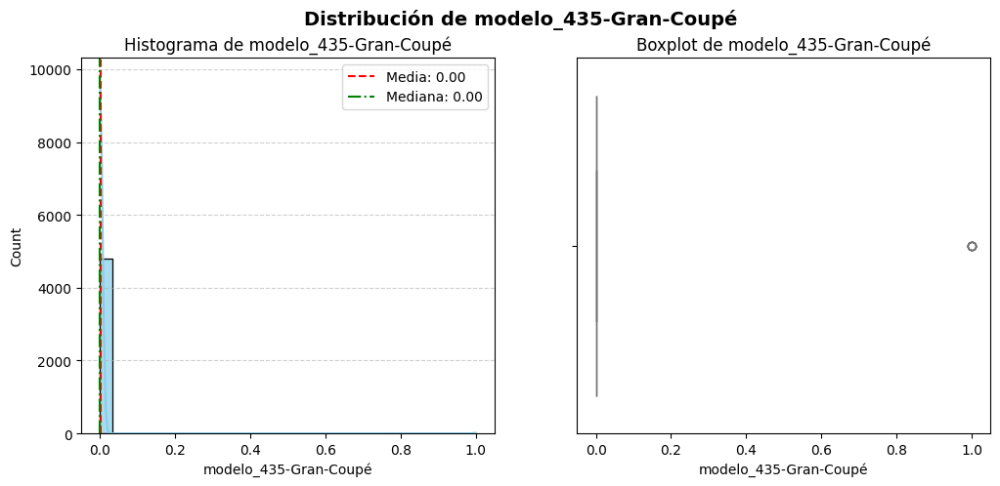




🔎 Columna: modelo_518
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.013753
std         0.116476
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_518, dtype: float64


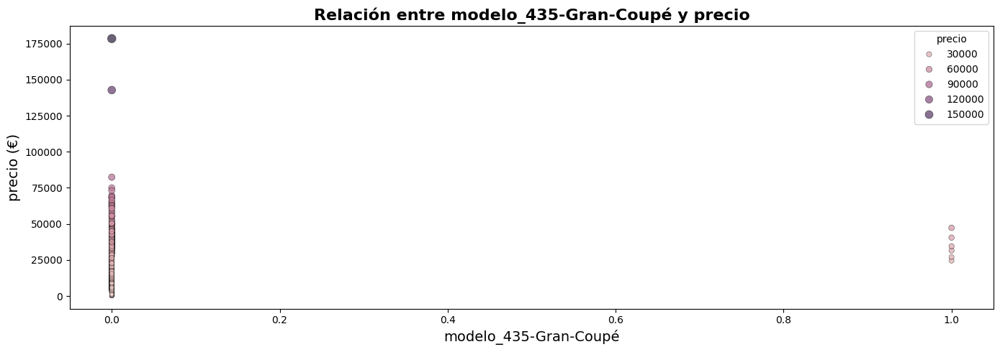

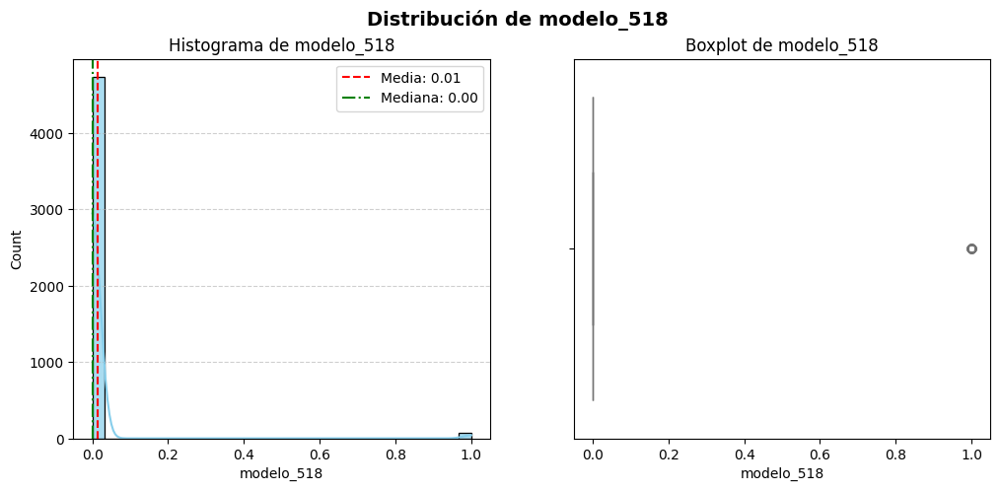




🔎 Columna: modelo_520
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.131277
std         0.337739
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_520, dtype: float64


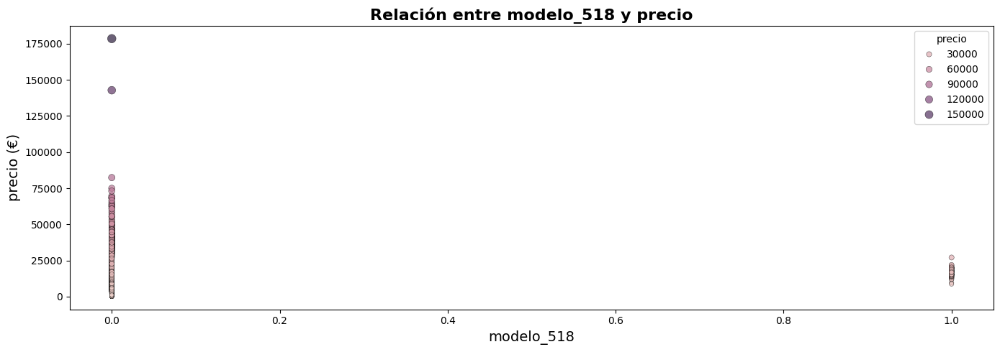

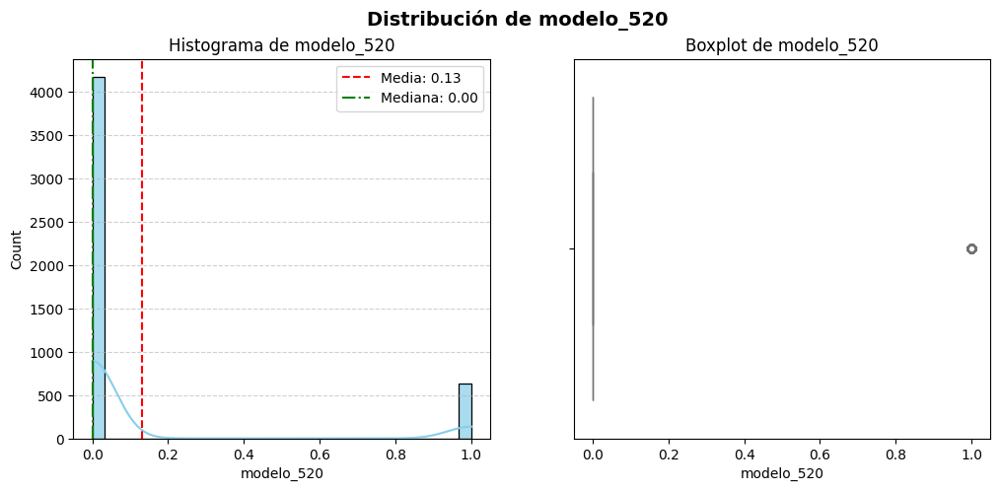




🔎 Columna: modelo_520-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.004793
std         0.069070
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_520-Gran-Turismo, dtype: float64


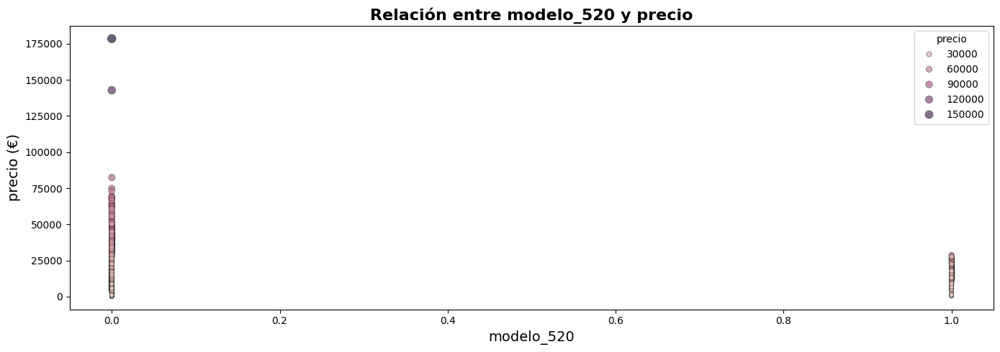

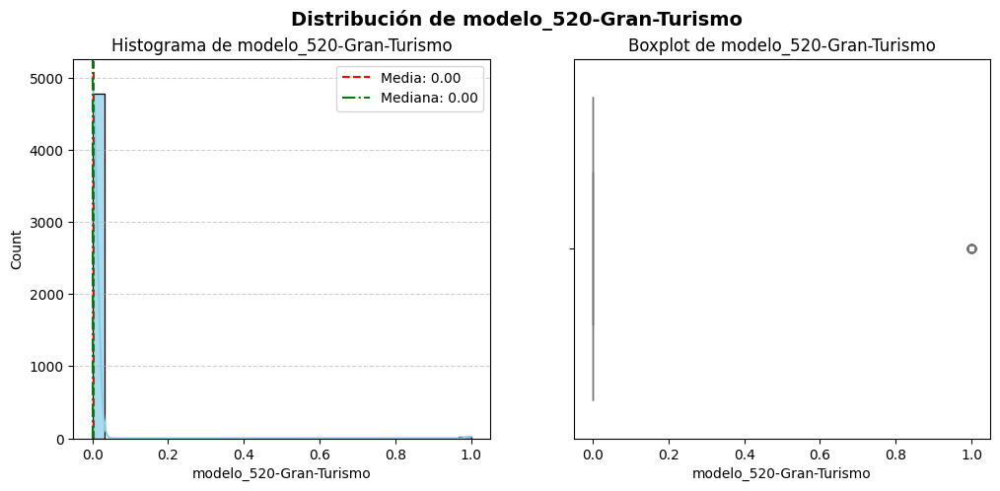




🔎 Columna: modelo_523
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000834
std         0.028861
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_523, dtype: float64


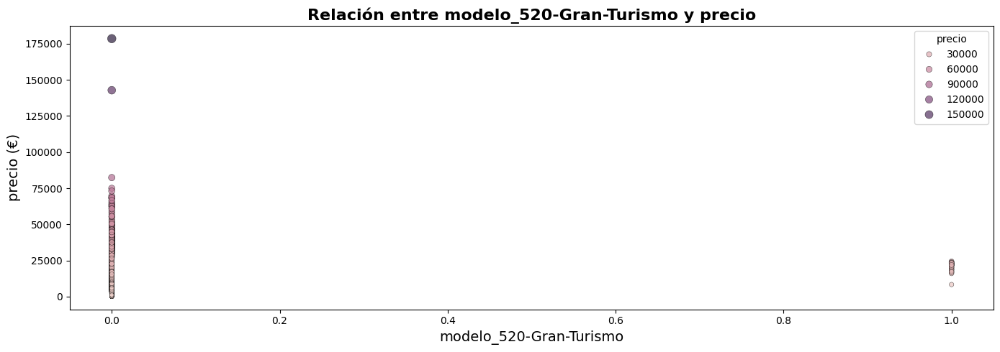

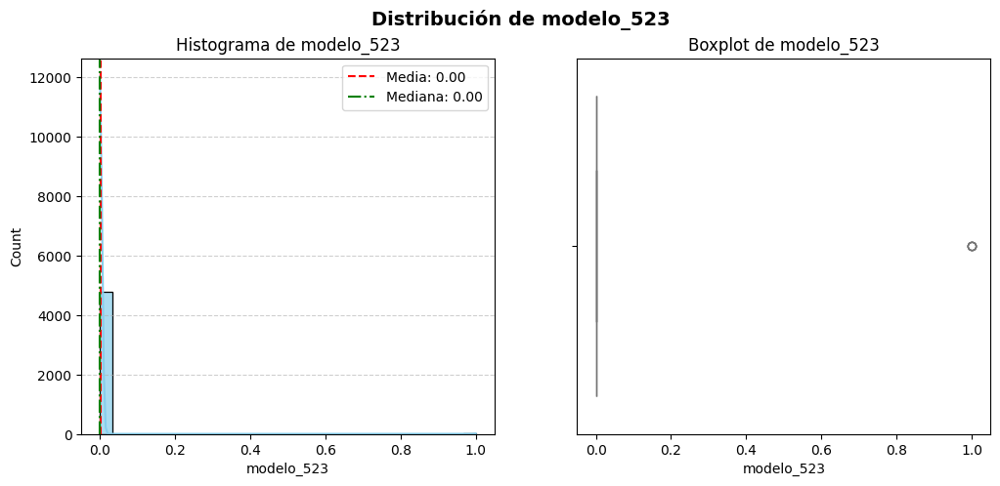




🔎 Columna: modelo_525
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.037925
std         0.191034
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_525, dtype: float64


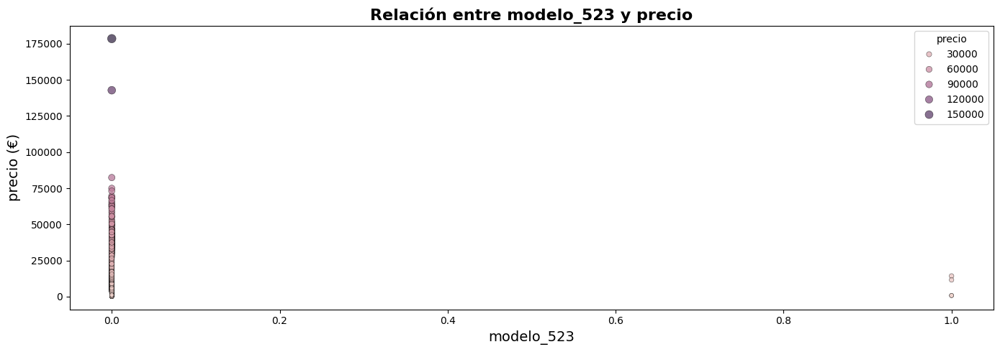

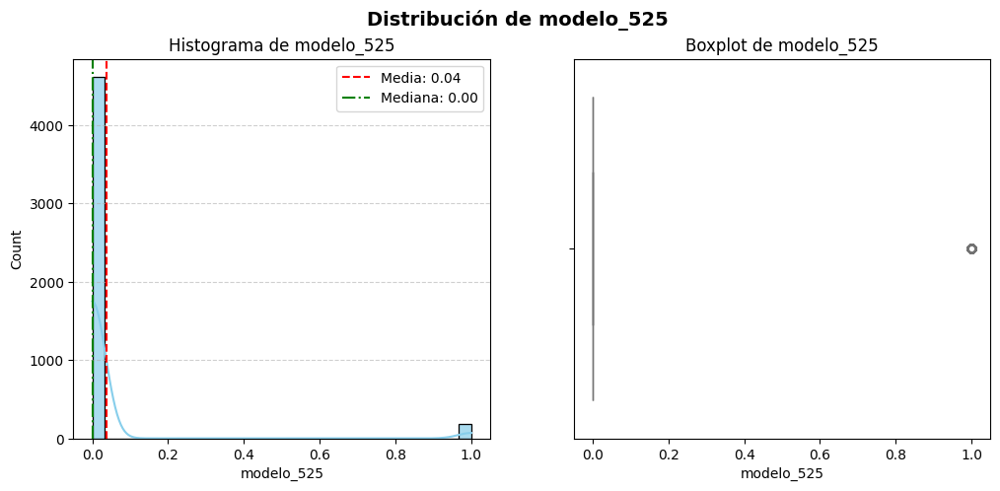




🔎 Columna: modelo_528
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001250
std         0.035341
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_528, dtype: float64


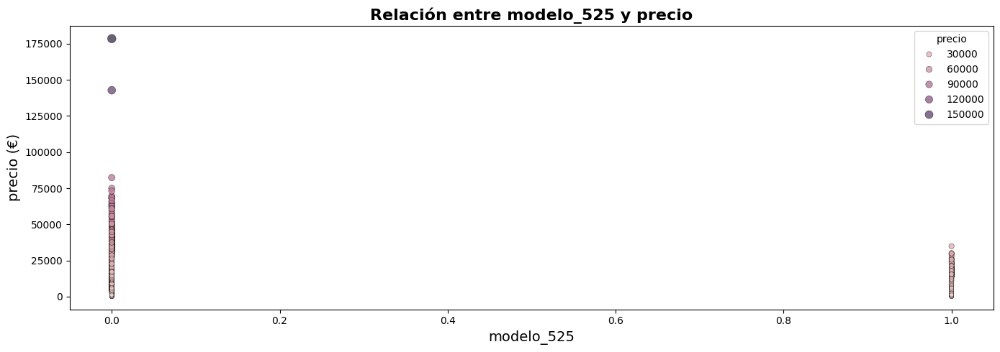

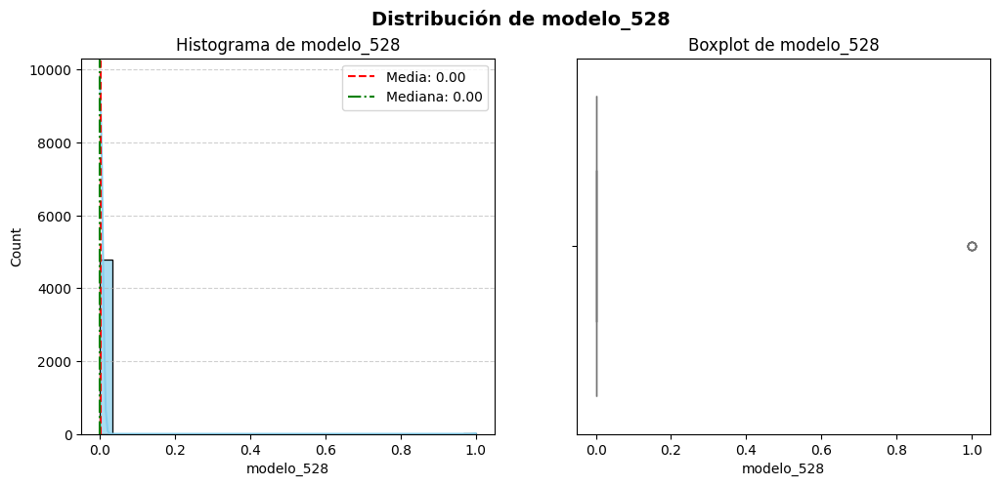




🔎 Columna: modelo_530
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.032715
std         0.177909
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_530, dtype: float64


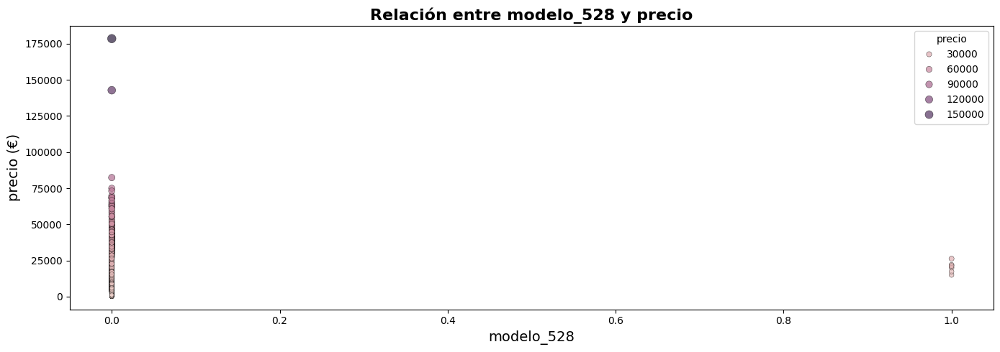

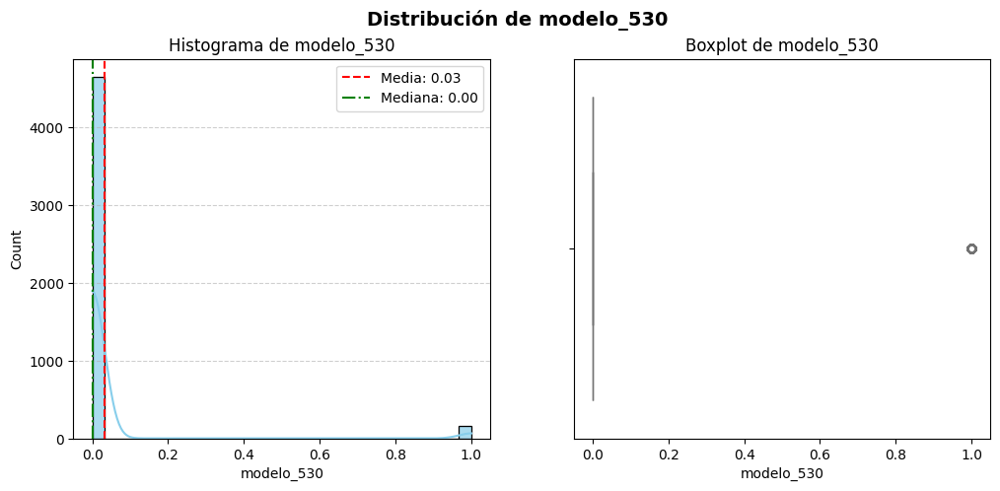




🔎 Columna: modelo_530-Gran-Turismo
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003751
std         0.061135
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_530-Gran-Turismo, dtype: float64


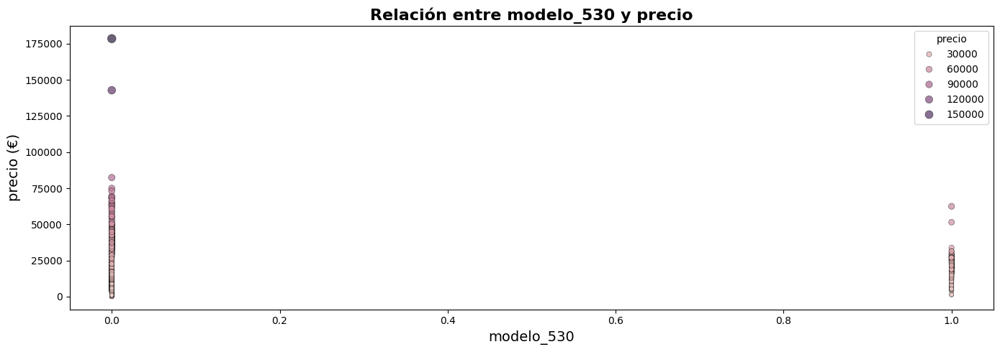

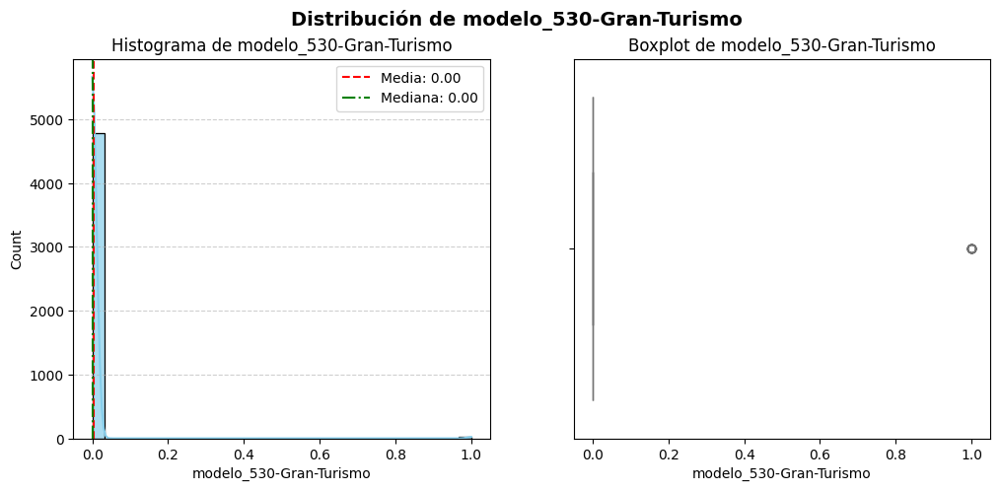




🔎 Columna: modelo_535
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.009377
std         0.096390
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_535, dtype: float64


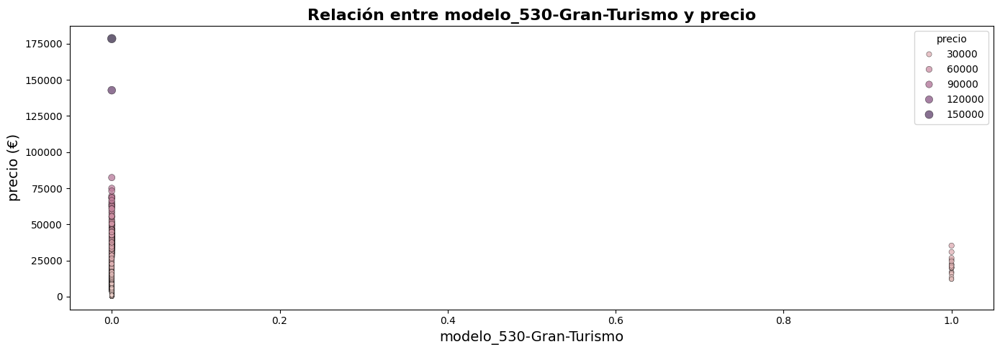

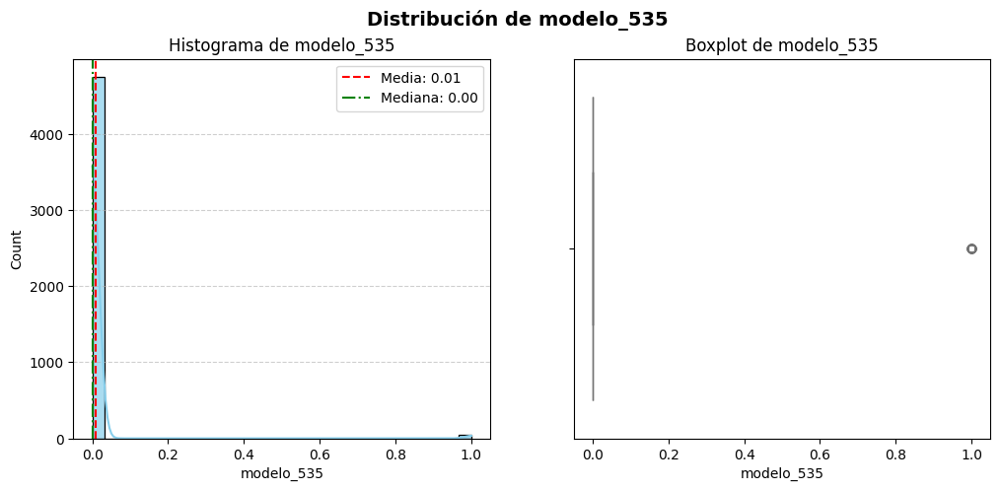




🔎 Columna: modelo_635
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_635, dtype: float64


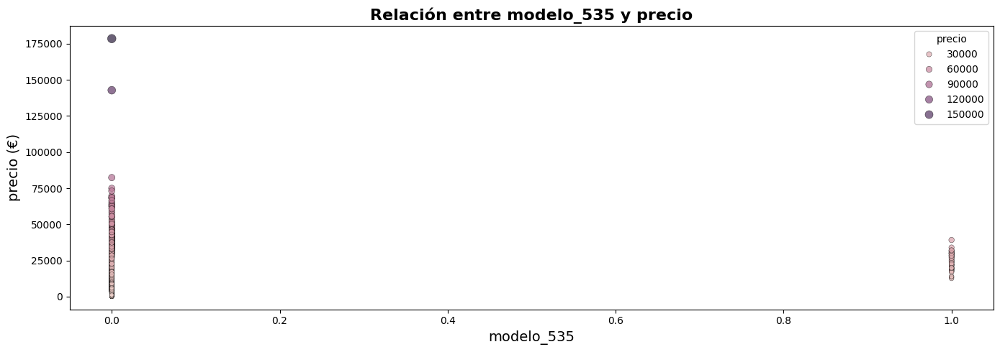

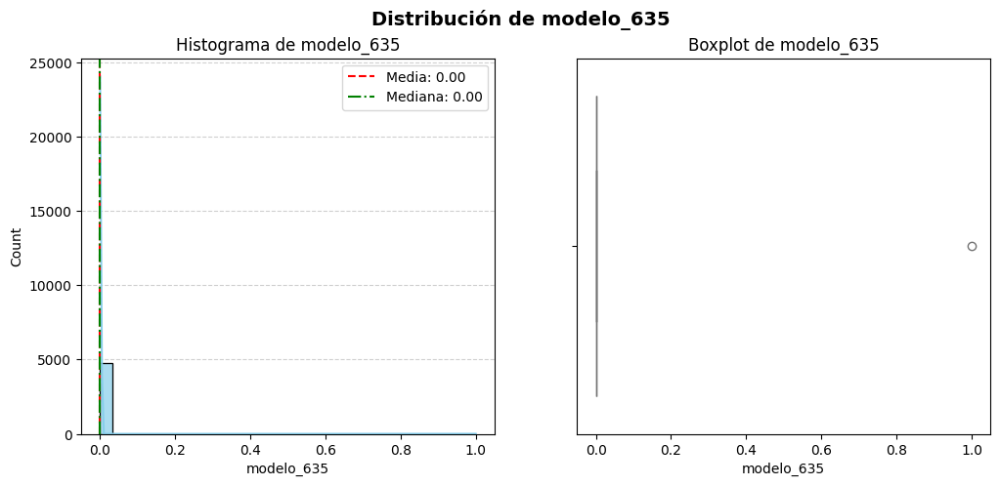




🔎 Columna: modelo_640
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001459
std         0.038168
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_640, dtype: float64


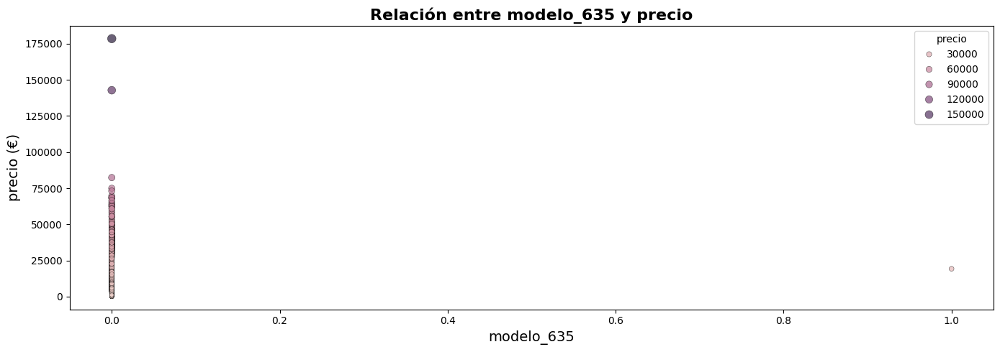

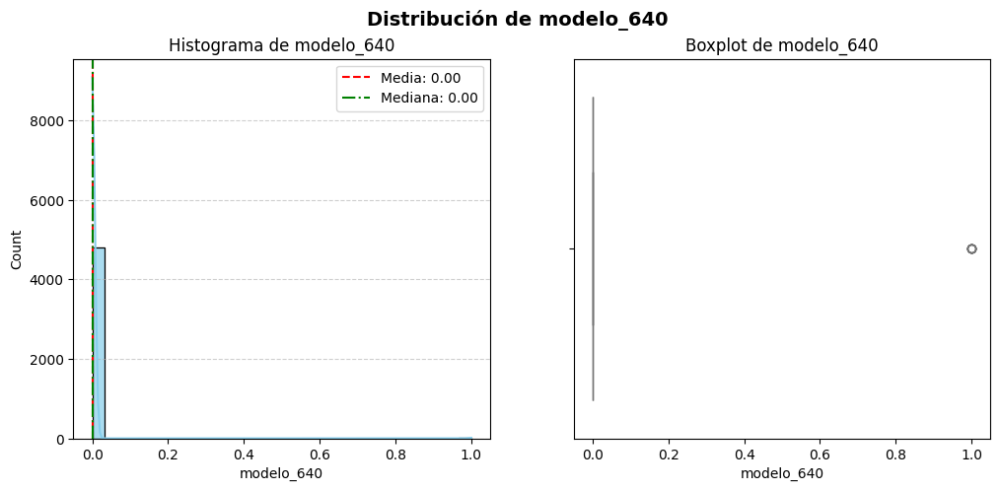




🔎 Columna: modelo_640-Gran-Coupé
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003959
std         0.062804
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_640-Gran-Coupé, dtype: float64


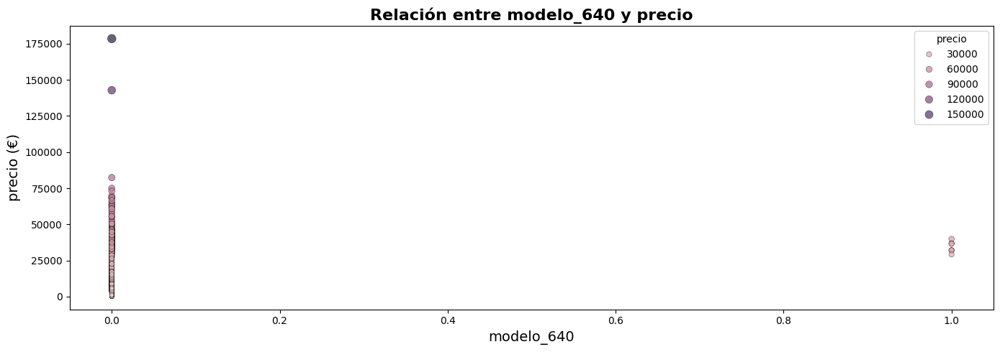

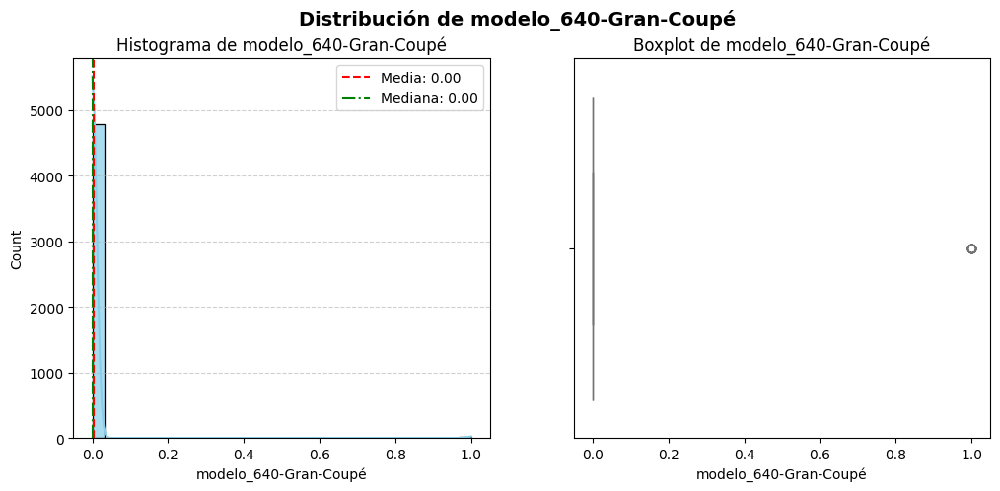




🔎 Columna: modelo_730
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.006876
std         0.082647
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_730, dtype: float64


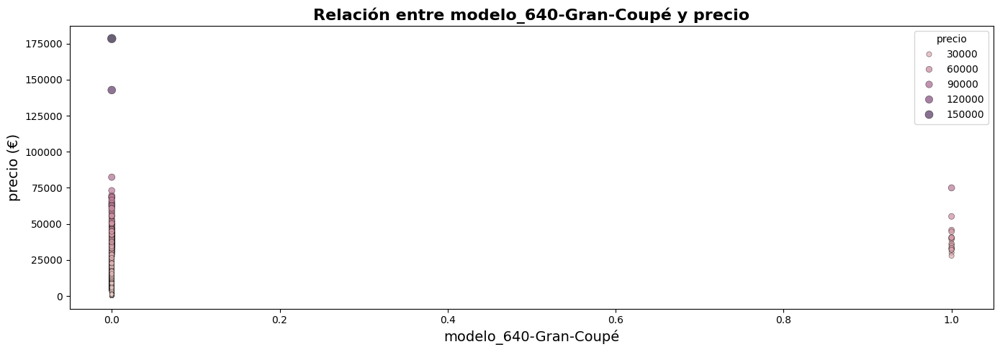

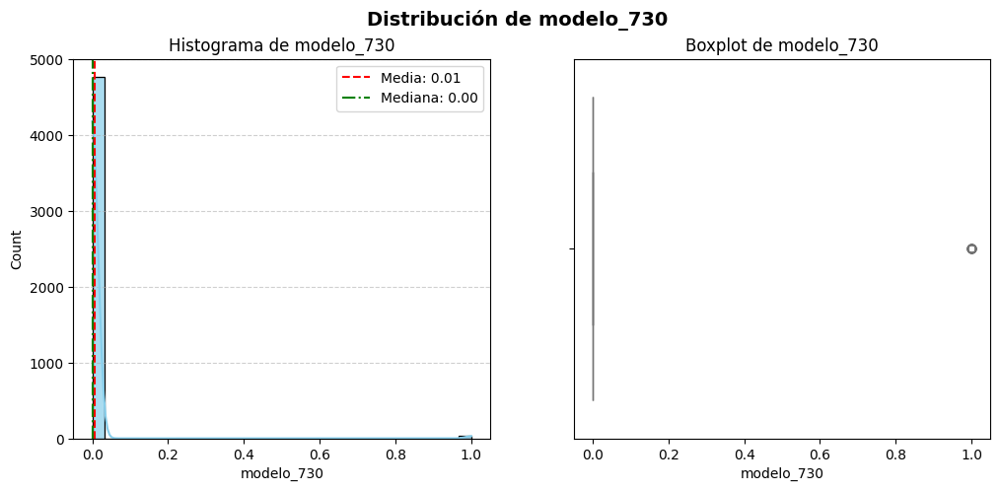




🔎 Columna: modelo_740
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003751
std         0.061135
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_740, dtype: float64


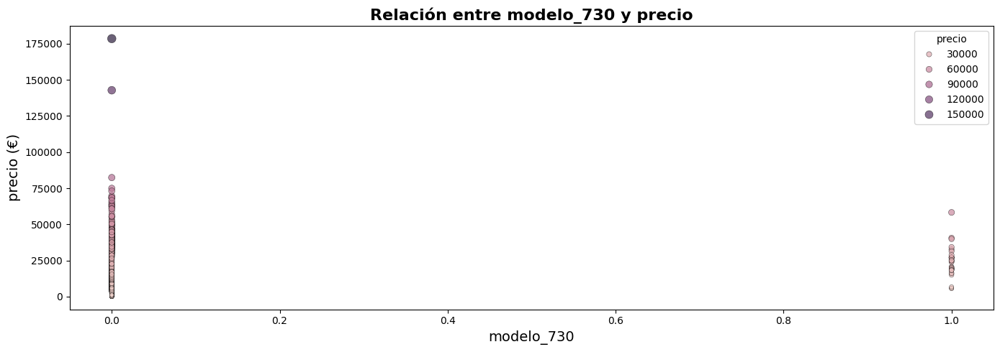

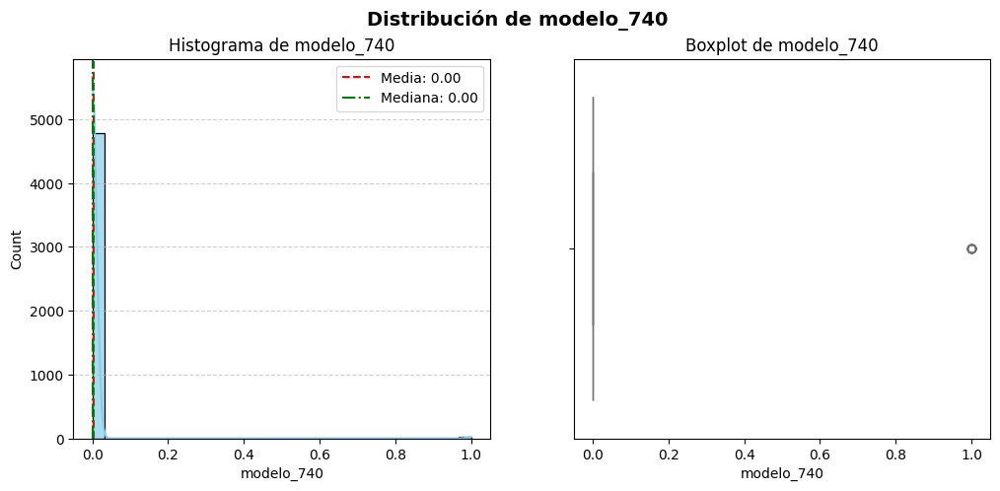




🔎 Columna: modelo_750
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000417
std         0.020412
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_750, dtype: float64


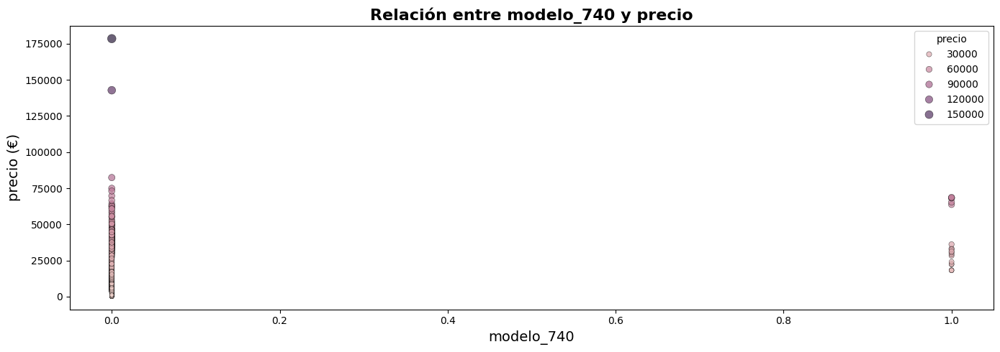

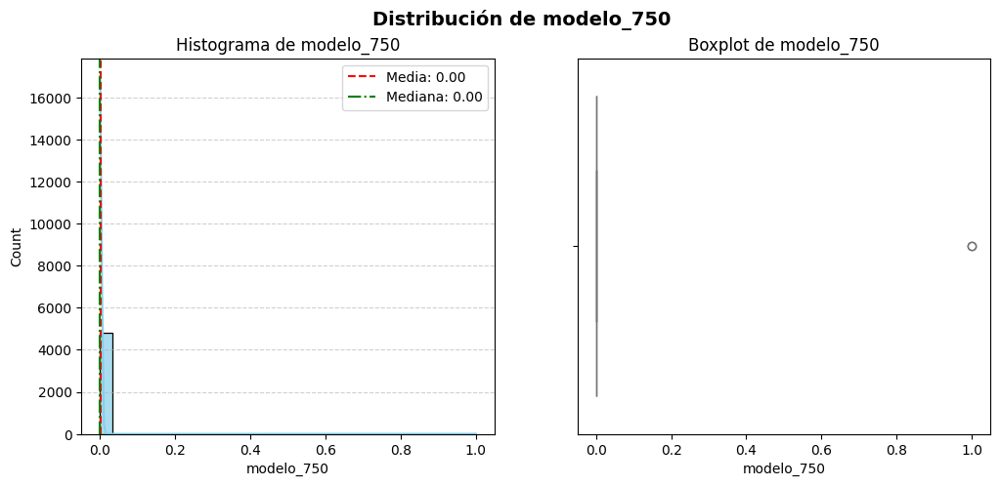




🔎 Columna: modelo_Active-Tourer
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_Active-Tourer, dtype: float64


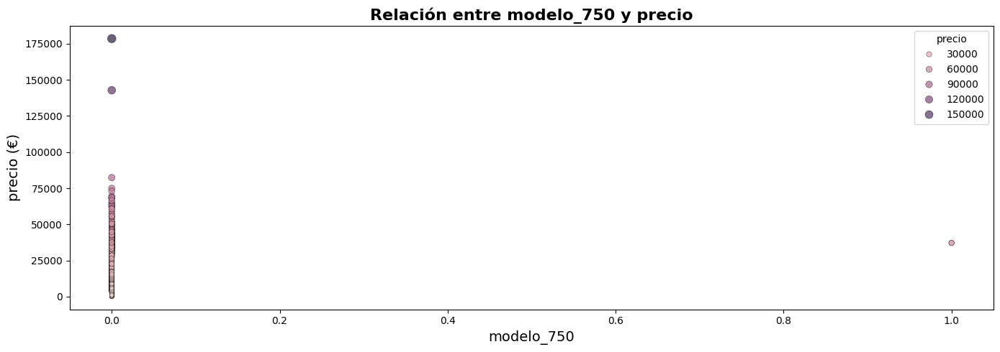

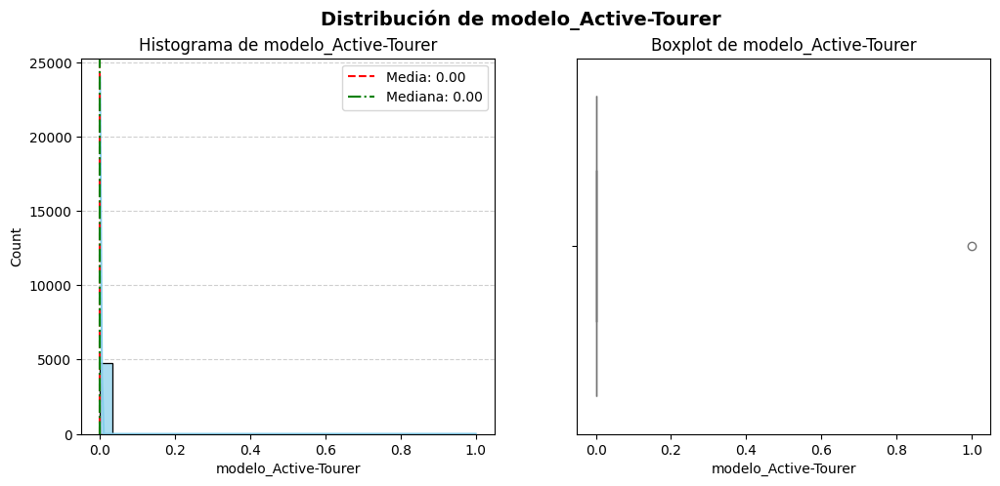




🔎 Columna: modelo_ActiveHybrid-5
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_ActiveHybrid-5, dtype: float64


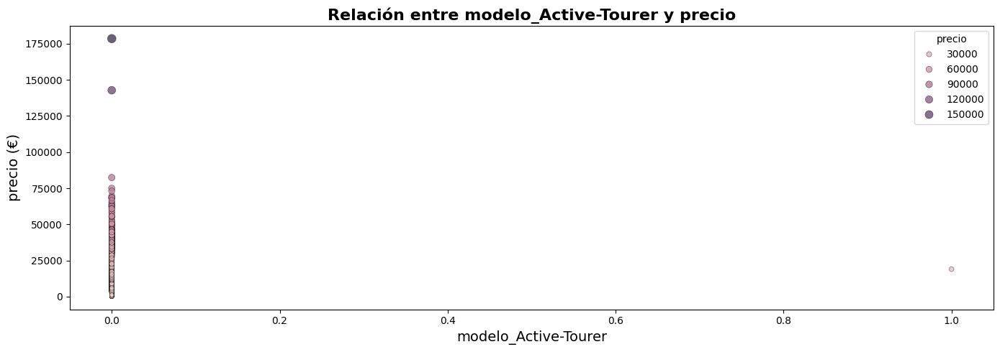

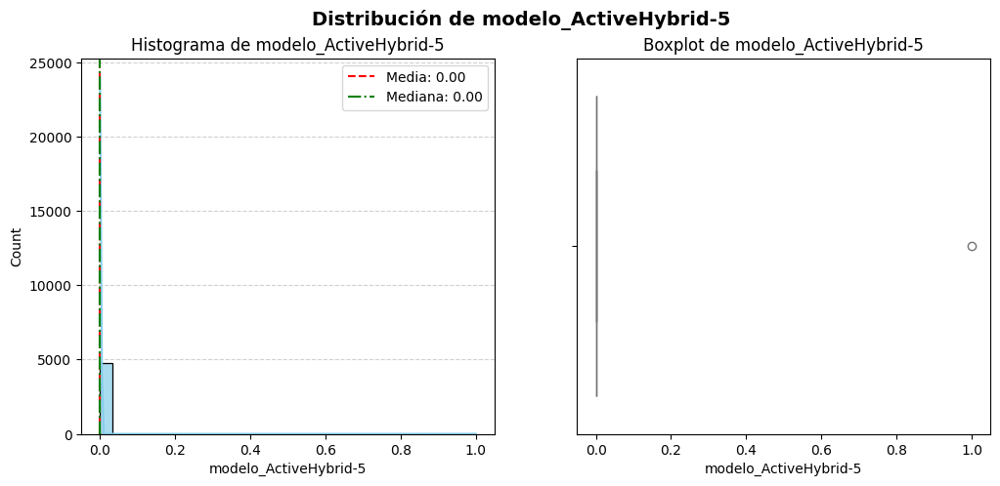




🔎 Columna: modelo_M135
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000208
std         0.014435
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_M135, dtype: float64


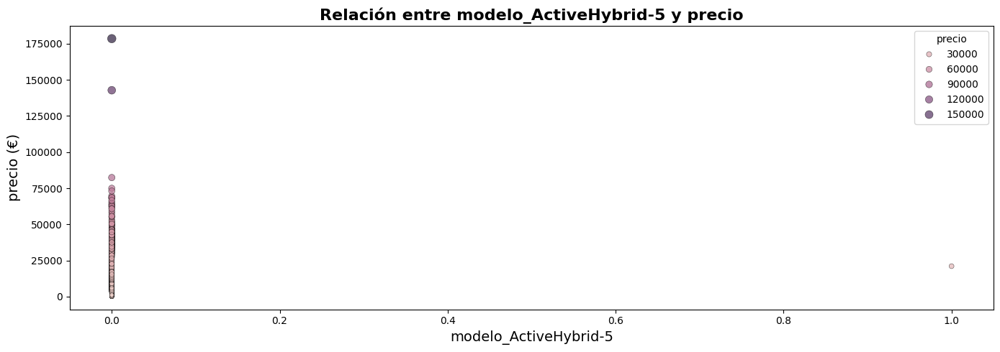

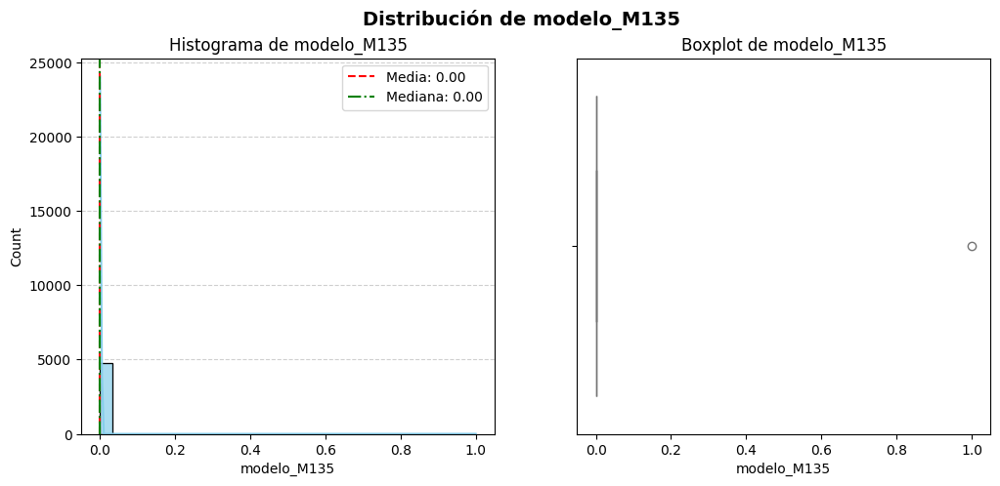




🔎 Columna: modelo_M3
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001459
std         0.038168
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_M3, dtype: float64


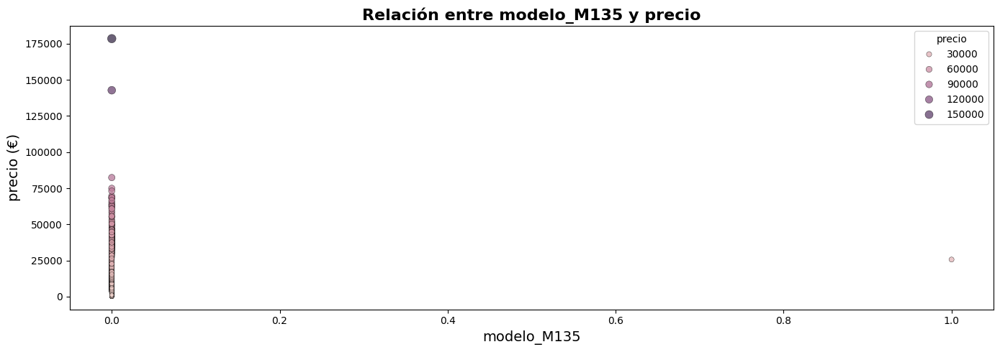

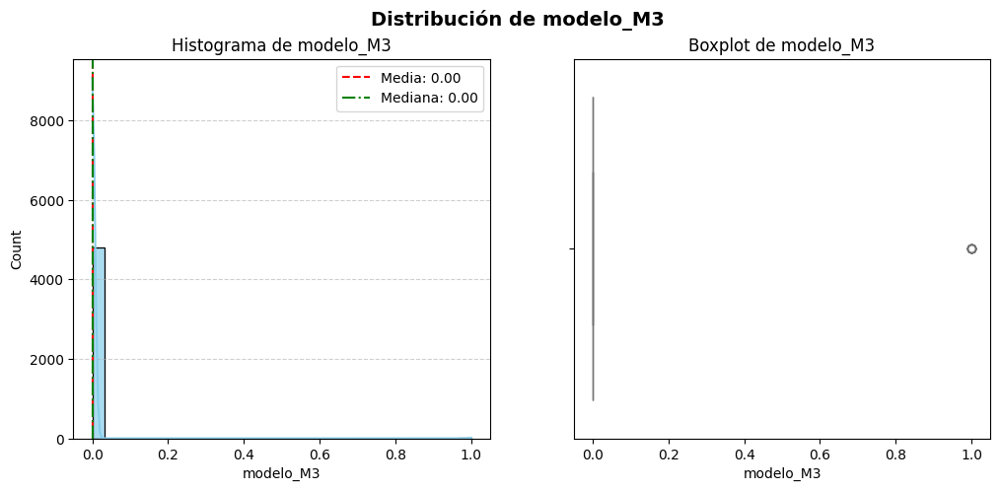




🔎 Columna: modelo_M4
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000417
std         0.020412
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_M4, dtype: float64


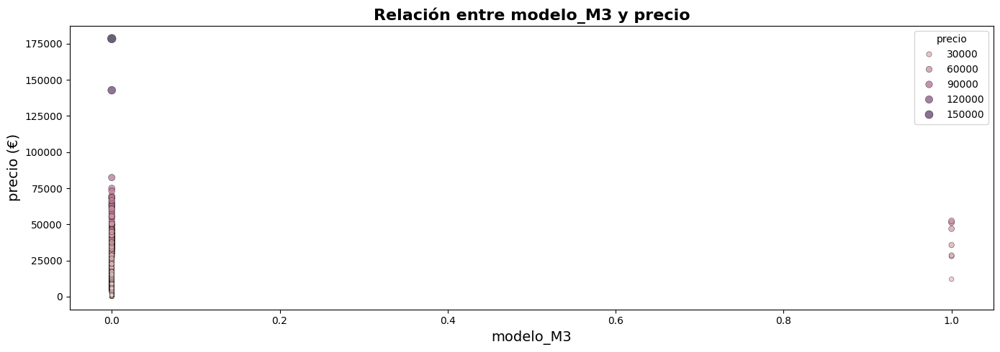

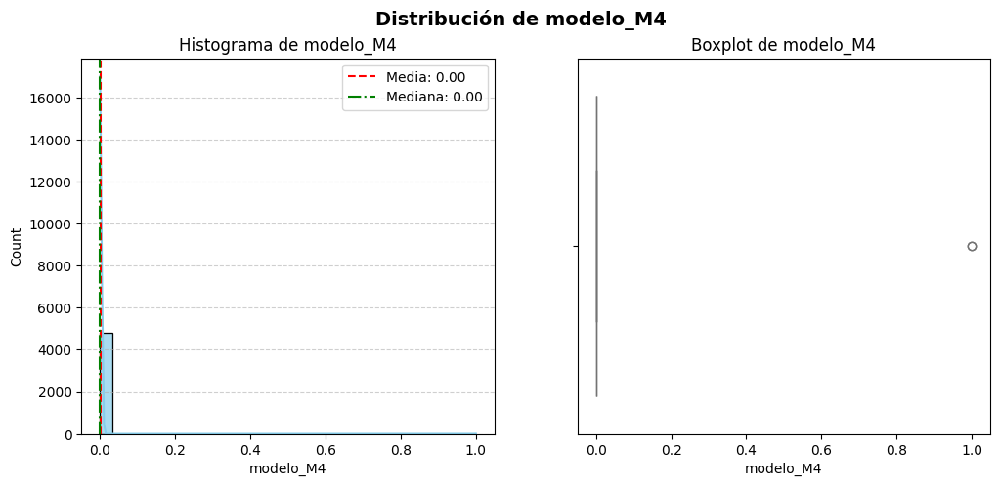




🔎 Columna: modelo_M550
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.002501
std         0.049948
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_M550, dtype: float64


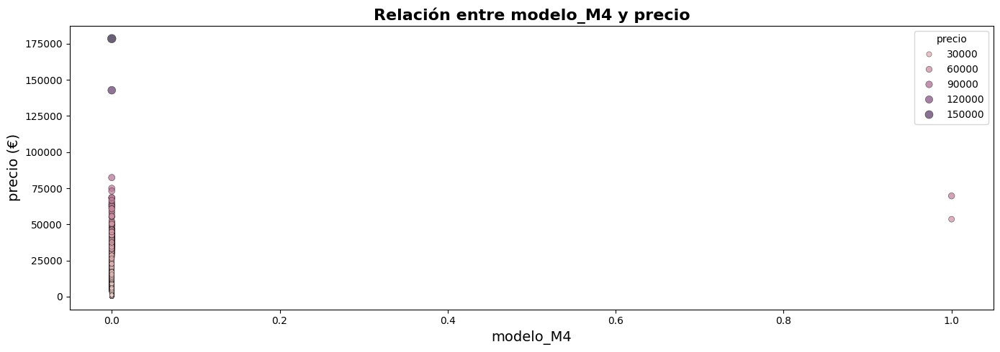

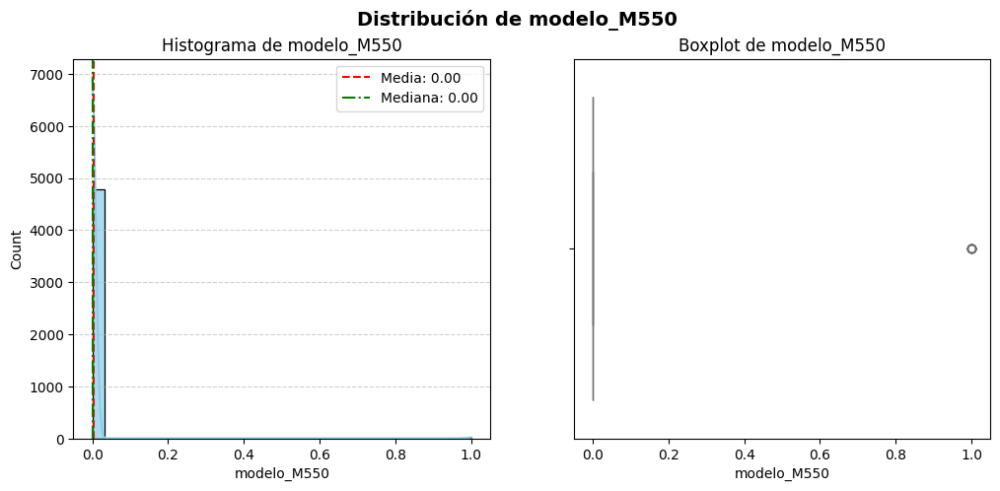




🔎 Columna: modelo_X1
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.057095
std         0.232049
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X1, dtype: float64


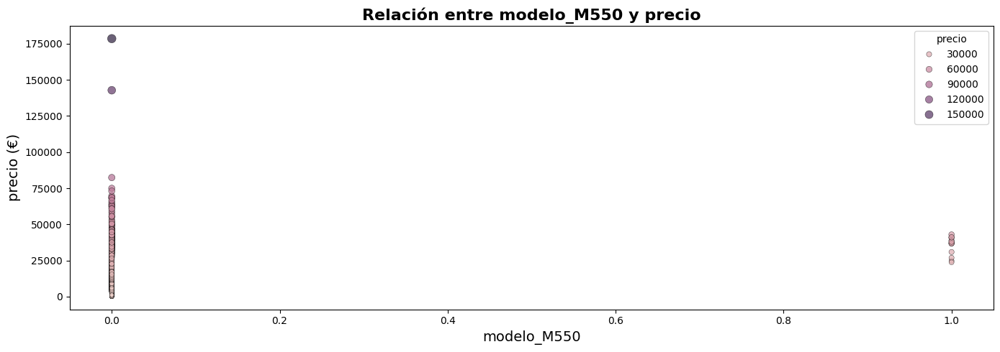

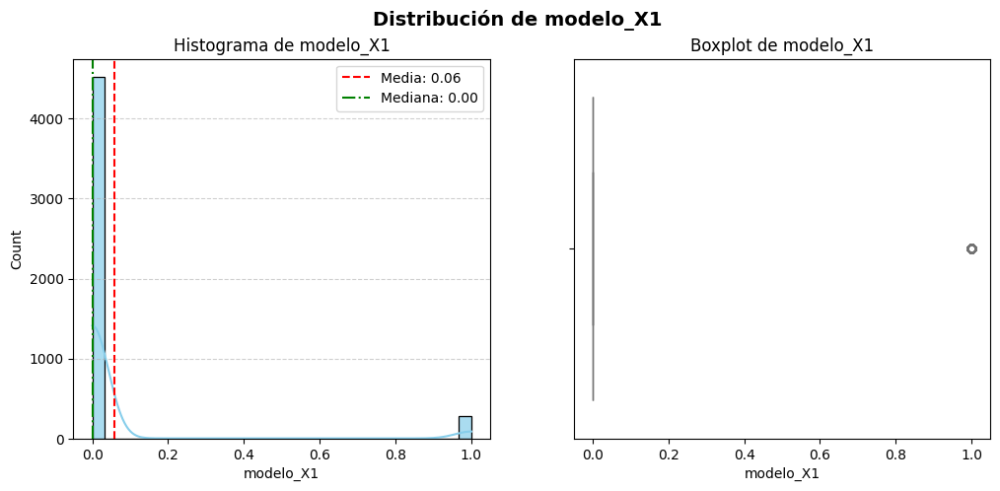




🔎 Columna: modelo_X3
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.091061
std         0.287725
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X3, dtype: float64


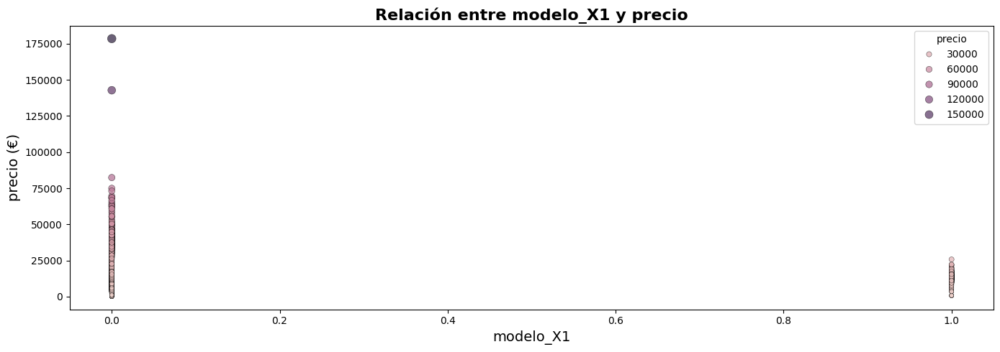

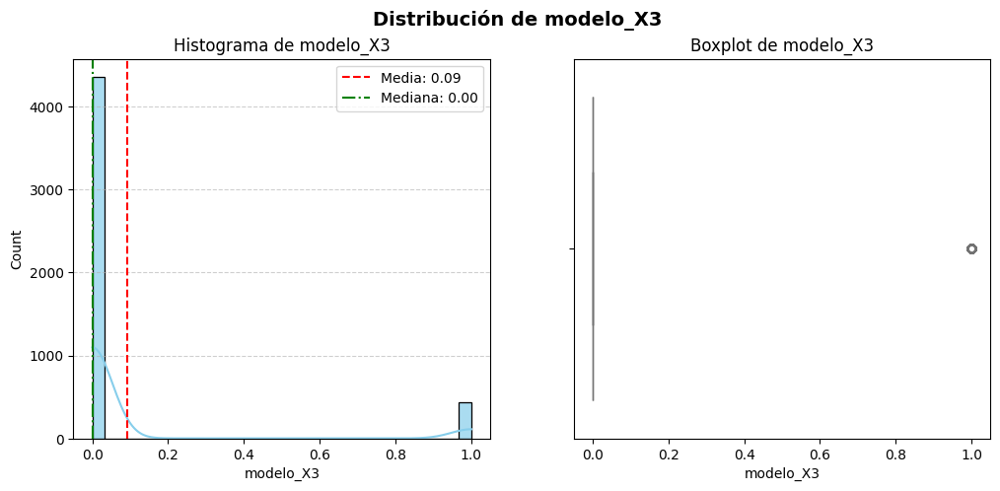




🔎 Columna: modelo_X4
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.009585
std         0.097444
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X4, dtype: float64


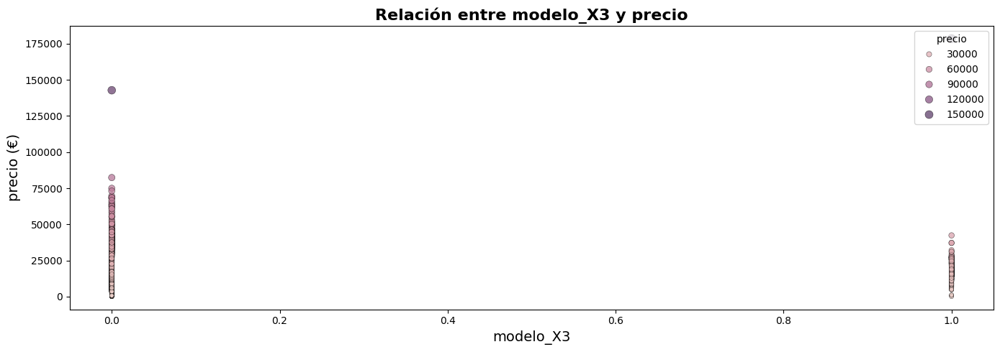

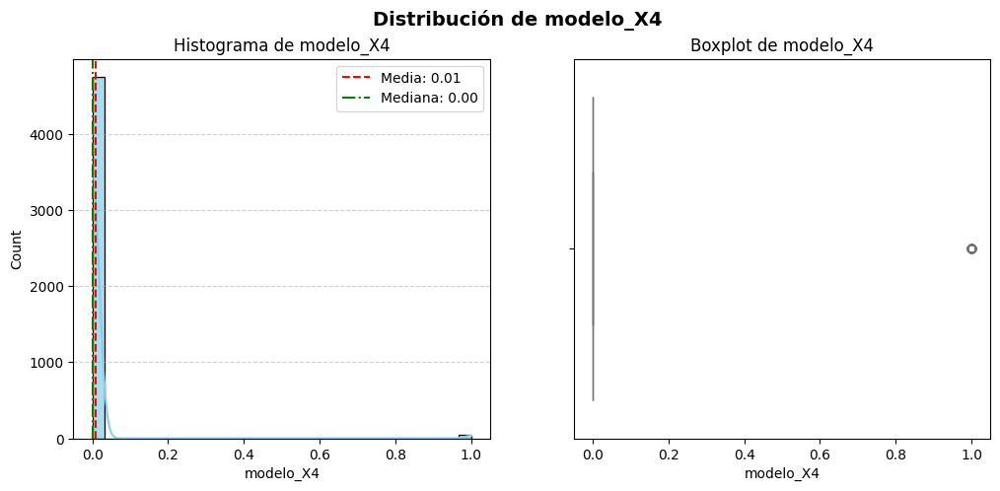




🔎 Columna: modelo_X5
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.048135
std         0.214074
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X5, dtype: float64


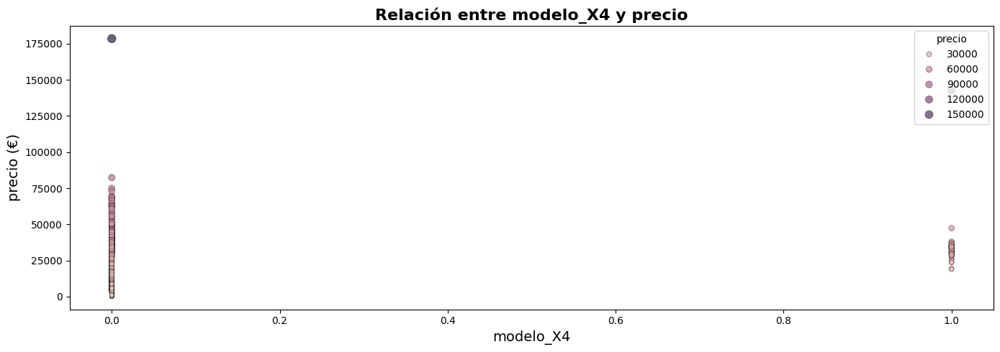

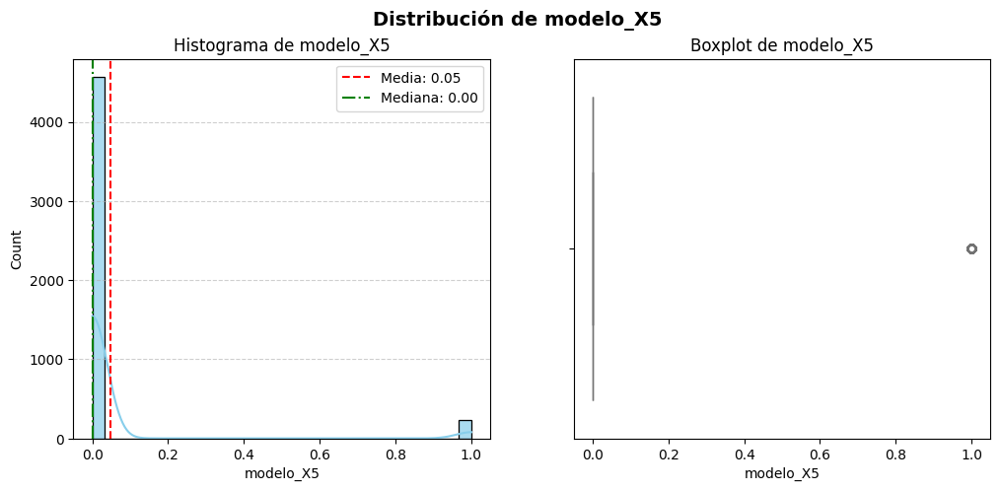




🔎 Columna: modelo_X5-M
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.003542
std         0.059419
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X5-M, dtype: float64


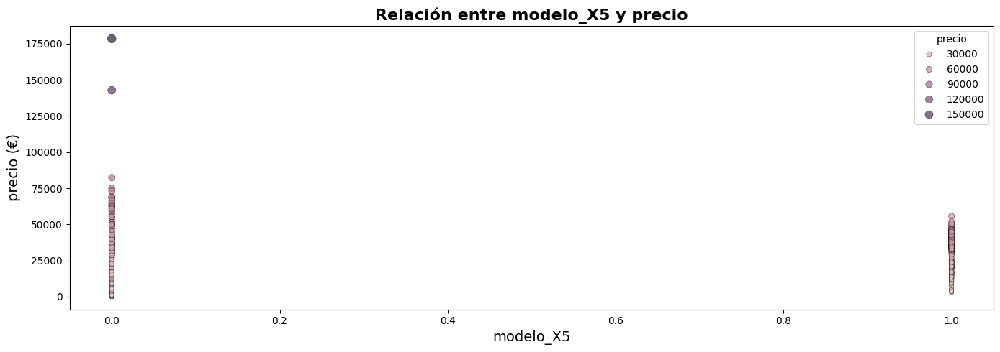

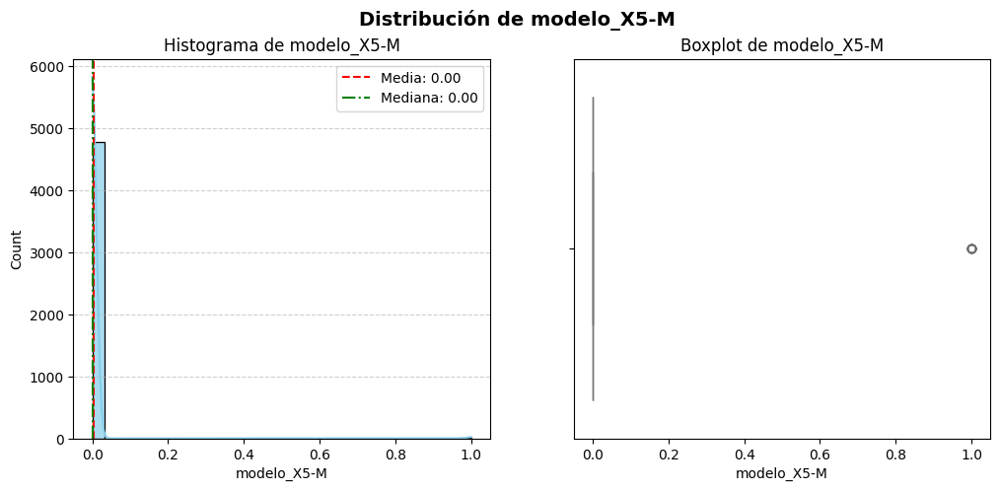




🔎 Columna: modelo_X5-M50
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.000625
std         0.024997
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X5-M50, dtype: float64


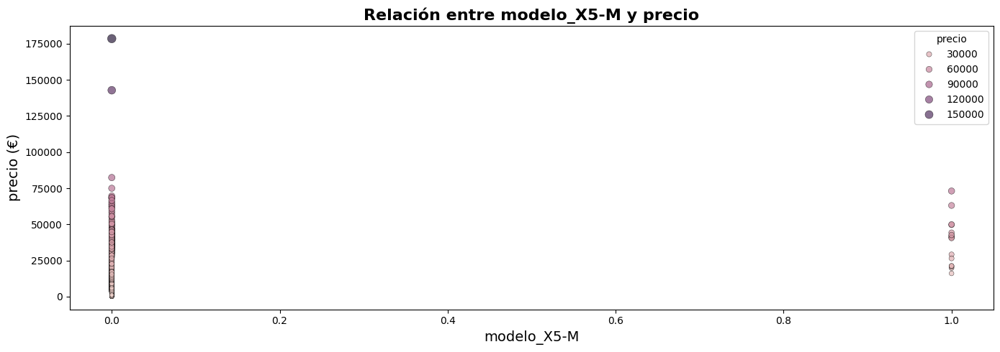

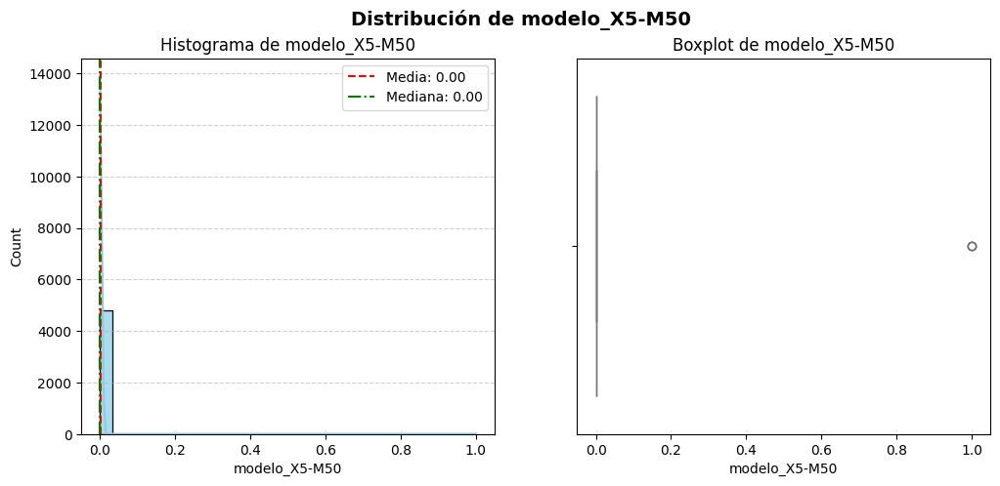




🔎 Columna: modelo_X6
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.009169
std         0.095323
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X6, dtype: float64


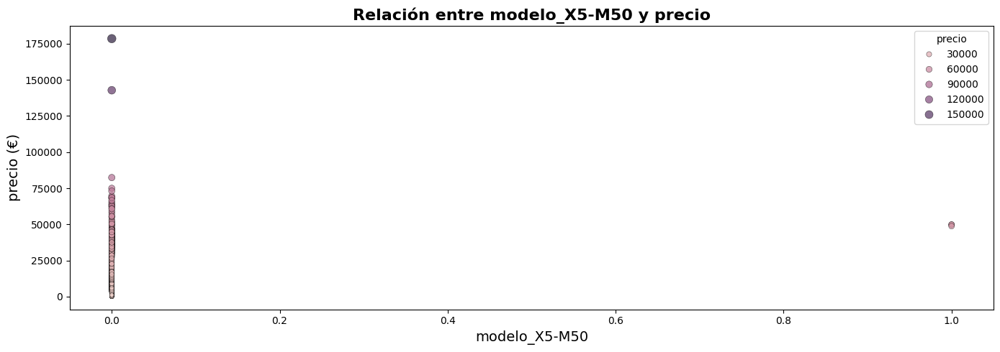

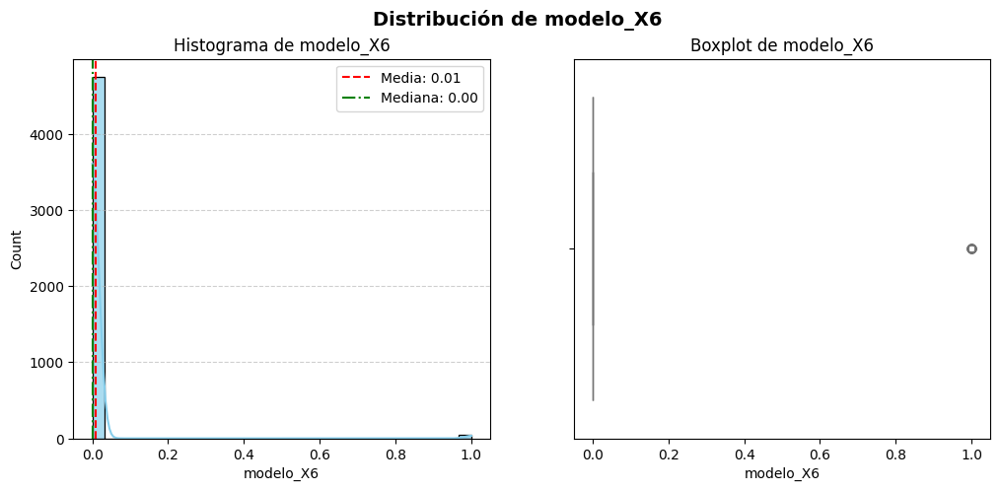




🔎 Columna: modelo_X6-M
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001667
std         0.040799
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_X6-M, dtype: float64


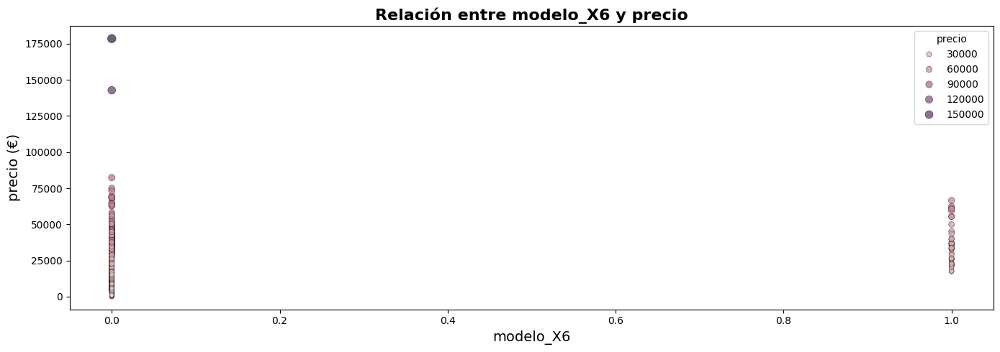

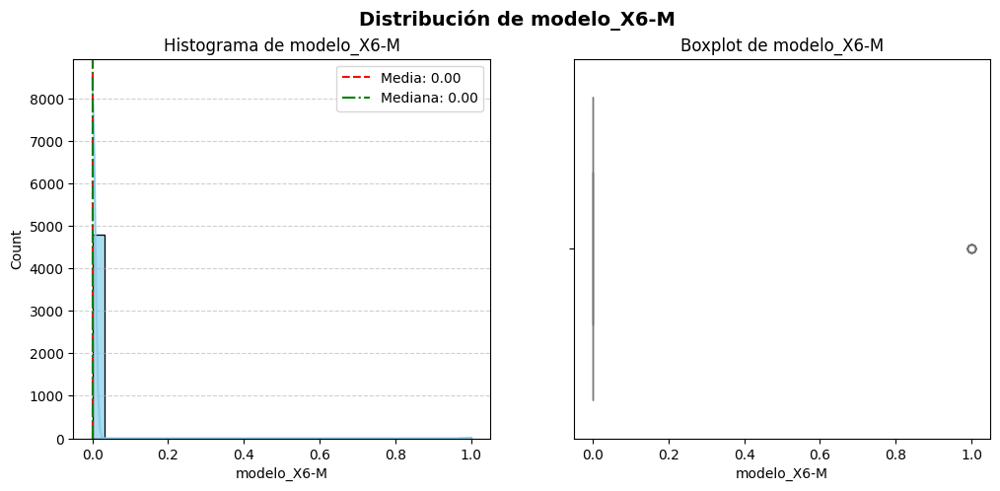




🔎 Columna: modelo_Z4
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001250
std         0.035341
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_Z4, dtype: float64


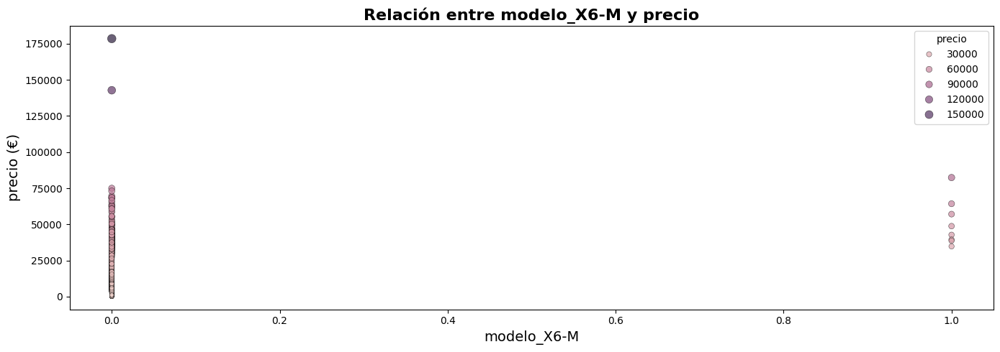

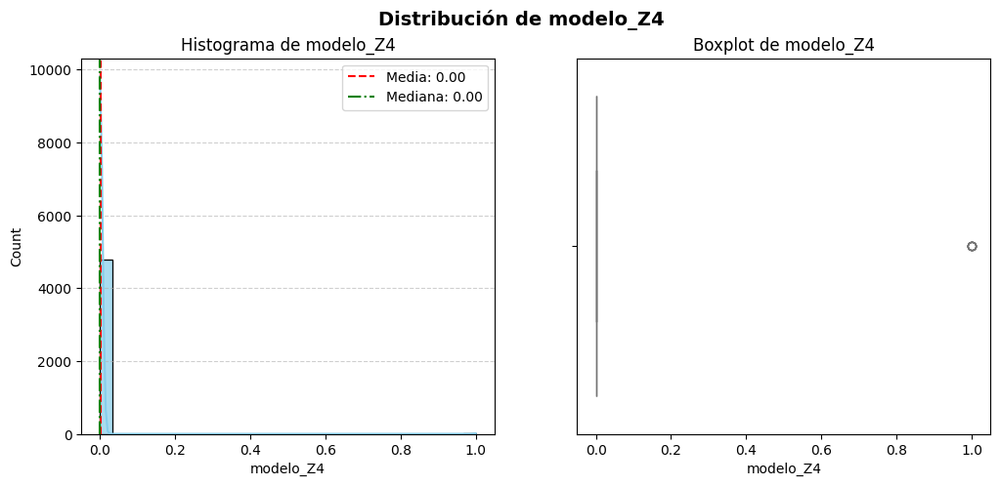




🔎 Columna: modelo_i3
------------------------------
Tipo: Numérica

Estadísticas descriptivas:
count    4799.000000
mean        0.001250
std         0.035341
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: modelo_i3, dtype: float64


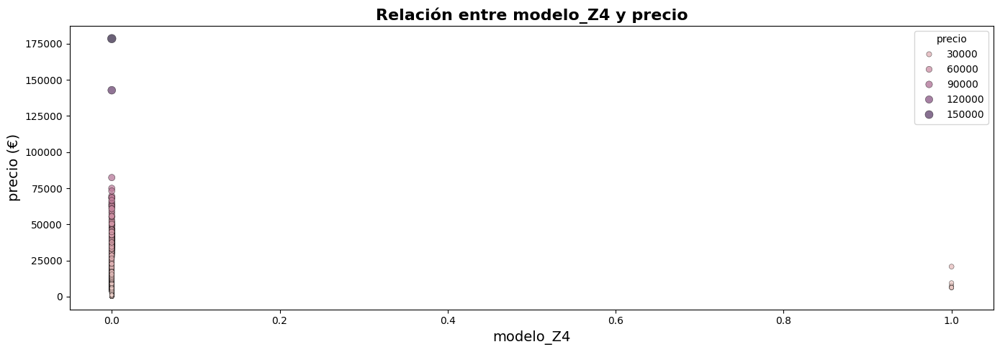

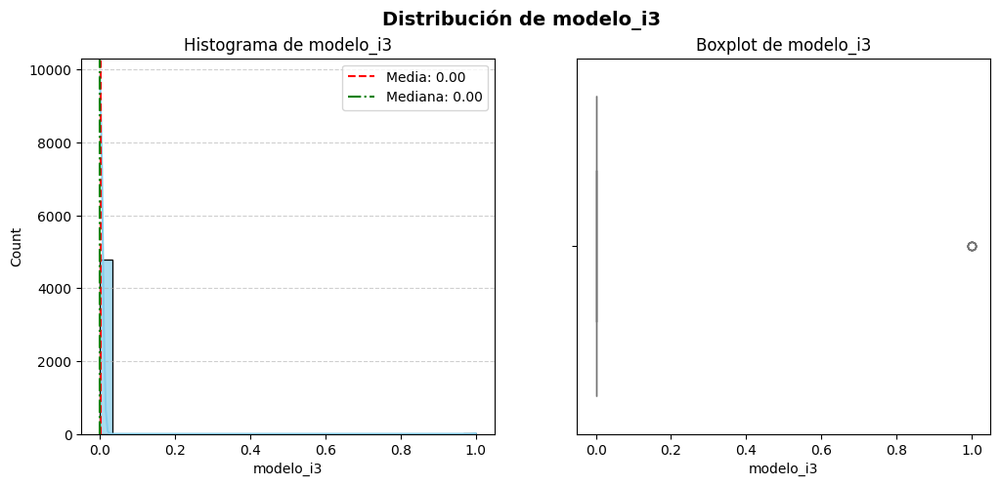

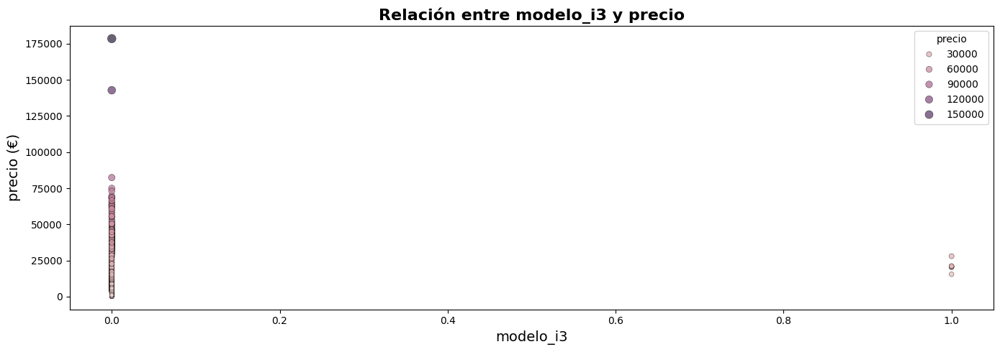

In [10]:
eda_helper.analisis_exploratorio(dataFrame_base, target = "precio", display_numericas = True )

In [11]:
corr = dataFrame_base.corr()
corr.style.background_gradient(cmap='coolwarm')

array([[<Axes: title={'center': 'precio'}>]], dtype=object)

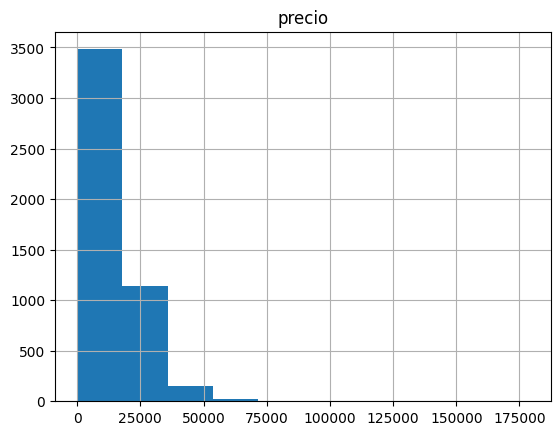

In [12]:
dataFrame_base.hist("precio")

<Axes: xlabel='precio'>

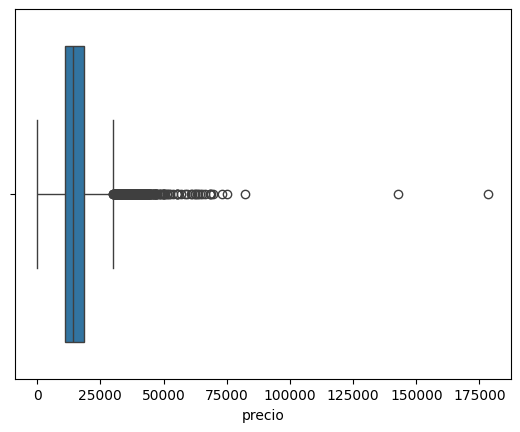

In [13]:
sns.boxplot(x=dataFrame_base["precio"])

In [14]:
# Normalizacion
# Vemos que la variable PRECIO esta sesgada, vamos a crear una nueva variable LOG_PRECIO normalizada.
dataFrame_base["log_precio"]=np.log10(dataFrame_base["precio"])


array([[<Axes: title={'center': 'log_precio'}>]], dtype=object)

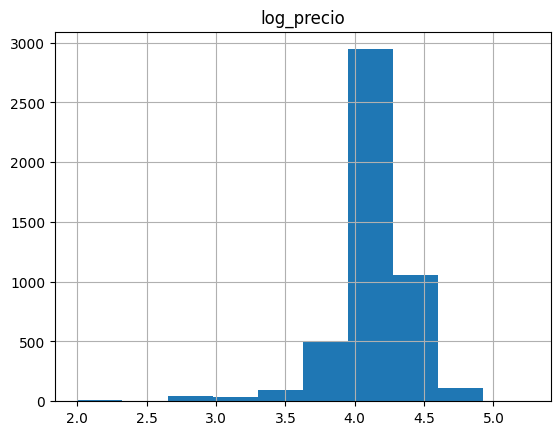

In [15]:
dataFrame_base.hist("log_precio")

<Axes: xlabel='log_precio'>

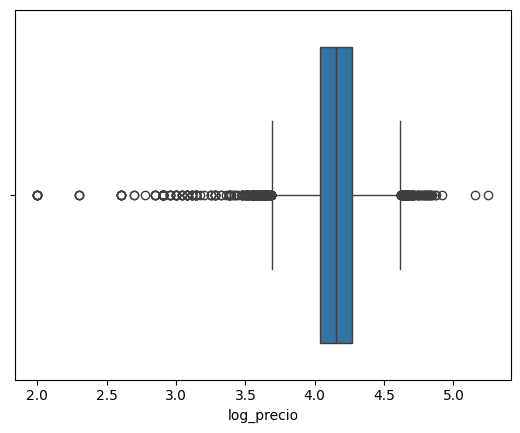

In [16]:
sns.boxplot(x=dataFrame_base["log_precio"])

In [17]:
dataFrame_base.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4799 entries, 0 to 4842
Columns: 105 entries, km to log_precio
dtypes: float64(8), int32(6), int64(91)
memory usage: 3.8 MB


In [18]:
dataFrame_base.head()

,km,potencia,precio,fecha_registro_Year,fecha_registro_Month,fecha_registro_Weekday,fecha_venta_Year,fecha_venta_Month,fecha_venta_Weekday,color_beige,...,modelo_X3,modelo_X4,modelo_X5,modelo_X5-M,modelo_X5-M50,modelo_X6,modelo_X6-M,modelo_Z4,modelo_i3,log_precio
0,140411.0,100.0,11300.0,2012,2,2,2018,1,0,0,...,0,0,0,0,0,0,0,0,0,4.053078
1,13929.0,317.0,69700.0,2015,1,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,4.843233
2,183297.0,120.0,10200.0,2012,4,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,4.008600
3,128035.0,135.0,25100.0,2014,5,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,4.399674
5,152352.0,225.0,17100.0,2011,5,6,2018,2,3,0,...,0,0,0,0,0,0,0,0,0,4.232996


<class 'pandas.core.frame.DataFrame'>
Index: 4799 entries, 0 to 4842
Columns: 105 entries, km to log_precio
dtypes: float64(8), int32(6), int64(91)
memory usage: 3.8 MB


In [20]:
# verificando la relacion de variables categoricas con el PRECIO
target="precio"


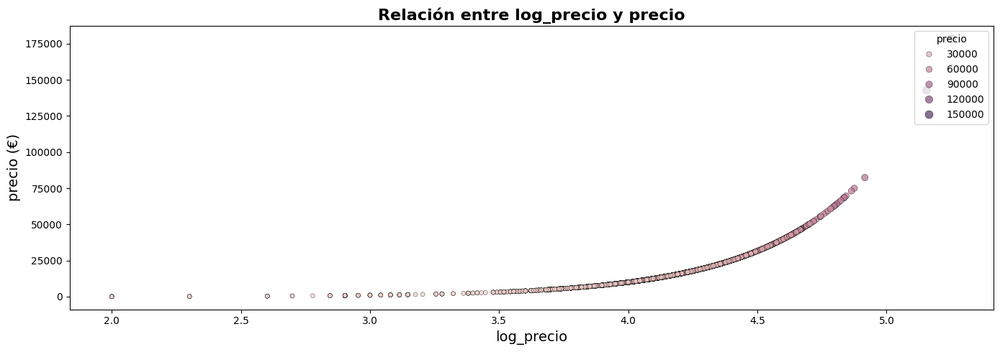

In [21]:
eda_helper.analizar_target_con_columna_numerica(dataFrame_base, "log_precio", target)